In [59]:
import pickle
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import *
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier

from sklearn.naive_bayes import MultinomialNB
%matplotlib notebook

In [60]:
news = {'news': {}, 'news_ngrams': {}, 'news_binary': {}, 'news_binary_ngrams': {}}
movie = {'movie': {}, 'movie_ngrams': {}, 'movie_binary': {}, 'movie_binary_ngrams': {}}


np.random.seed(42)

def shuffle(X, y):
    p = np.random.permutation(X.shape[0])
    return X[p], y[p]

for key in news.keys():
    file_name = key + ".pkl"
    X_train, y_train, X_test, y_test = pickle.load(open(file_name, 'rb'))
    news[key]['X_train'], news[key]['y_train'] = shuffle(X_train, y_train)
    news[key]['X_test'], news[key]['y_test'] = shuffle(X_test, y_test)

for key in movie.keys():
    file_name = key + ".pkl"
    X_train, y_train, X_test, y_test = pickle.load(open(file_name, 'rb'))
    movie[key]['X_train'], movie[key]['y_train'] = shuffle(X_train, y_train)
    movie[key]['X_test'], movie[key]['y_test'] = shuffle(X_test, y_test)

    


In [61]:
def load_pickles(model_name):
    results = {'movie': None, 'movie_binary': None, 'movie_ngrams': None, 'movie_binary_ngrams': None,
              'news': None, 'news_binary': None, 'news_ngrams': None, 'news_binary_ngrams': None}
    results['movie'] = pickle.load(open("movie_results_" + model_name + '.pkl', 'rb'))
    results['movie_binary'] = pickle.load(open("movie_binary_results_" + model_name + '.pkl', 'rb'))
    results['movie_ngrams'] = pickle.load(open("movie_ngrams_results_" + model_name + '.pkl', 'rb'))
    results['movie_binary_ngrams'] = pickle.load(open("movie_binary_ngrams_results_" + model_name + '.pkl', 'rb'))
    
    results['news'] = pickle.load(open("news_results_" + model_name + '.pkl', 'rb'))
    results['news_binary'] = pickle.load(open("news_binary_results_" + model_name + '.pkl', 'rb'))
    results['news_ngrams'] = pickle.load(open("news_ngrams_results_" + model_name + '.pkl', 'rb'))
    results['news_binary_ngrams'] = pickle.load(open("news_binary_ngrams_results_" + model_name + '.pkl', 'rb'))
    return results

In [62]:
news_labels = ['alt.atheism',
 'comp.graphics',
 'comp.os.ms-windows.misc',
 'comp.sys.ibm.pc.hardware',
 'comp.sys.mac.hardware',
 'comp.windows.x',
 'misc.forsale',
 'rec.autos',
 'rec.motorcycles',
 'rec.sport.baseball',
 'rec.sport.hockey',
 'sci.crypt',
 'sci.electronics',
 'sci.med',
 'sci.space',
 'soc.religion.christian',
 'talk.politics.guns',
 'talk.politics.mideast',
 'talk.politics.misc',
 'talk.religion.misc']

movie_labels = ['negative', 'positive']

In [63]:
def cv_eval_save(name, grid, X_train, y_train, X_test, y_test, y_labels, avg):
    """ Run cross validation with a grid and find the train/val/test results. Saves and downloads pkl file. """

    grid.fit(X_train, y_train)


    train_acc = grid.cv_results_['mean_train_score'][grid.best_index_]
    train_std = grid.cv_results_['std_train_score'][grid.best_index_]
    val_acc = grid.cv_results_['mean_test_score'][grid.best_index_]
    val_std = grid.cv_results_['std_test_score'][grid.best_index_]


    train_results = evaluate_model(grid, X_train, y_train, y_labels, avg) # results on whole training set
    test_results = evaluate_model(grid, X_test, y_test, y_labels, avg) # results on test set

    results = {'grid': grid, 'val_acc': val_acc, 'val_std': val_std, 'train_acc': train_acc,
            'train_std': train_std, 'train_results': train_results, 'test_results': test_results}


    with open(name, 'wb') as f:
        pickle.dump(results, f) 

    return results


def evaluate_model(model, X, y, y_labels, avg):
    """ get accuracy, F1 score, and generate a confusion matrix plot """
    results = {"acc": None, "f1": None, "conf_matrix": None, "conf_matrix_plot": None}
    y_pred = model.predict(X)
    results['acc'] = accuracy_score(y, y_pred)
    results['f1'] = f1_score(y, y_pred, average=avg)
    results['conf_matrix'] = confusion_matrix(y, y_pred)

    fig = plt.figure(figsize=(10, 8))
    sns.heatmap(results['conf_matrix'], annot=True, cmap="Blues", fmt="d")
    plt.xticks(np.arange(results['conf_matrix'].shape[0]) + 0.5, y_labels, rotation=90)
    plt.yticks(np.arange(results['conf_matrix'].shape[0]) + 0.5, y_labels, rotation=0)
    plt.xlabel("Predicted Value")
    plt.ylabel("True Value")

    results['conf_matrix_plot'] = fig

    return results

# LinearSVC

C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This figure was saved with matplotlib version 3.1.1 and is unlikely to function correctly.
  after removing the cwd from sys.path.


<IPython.core.display.Javascript object>


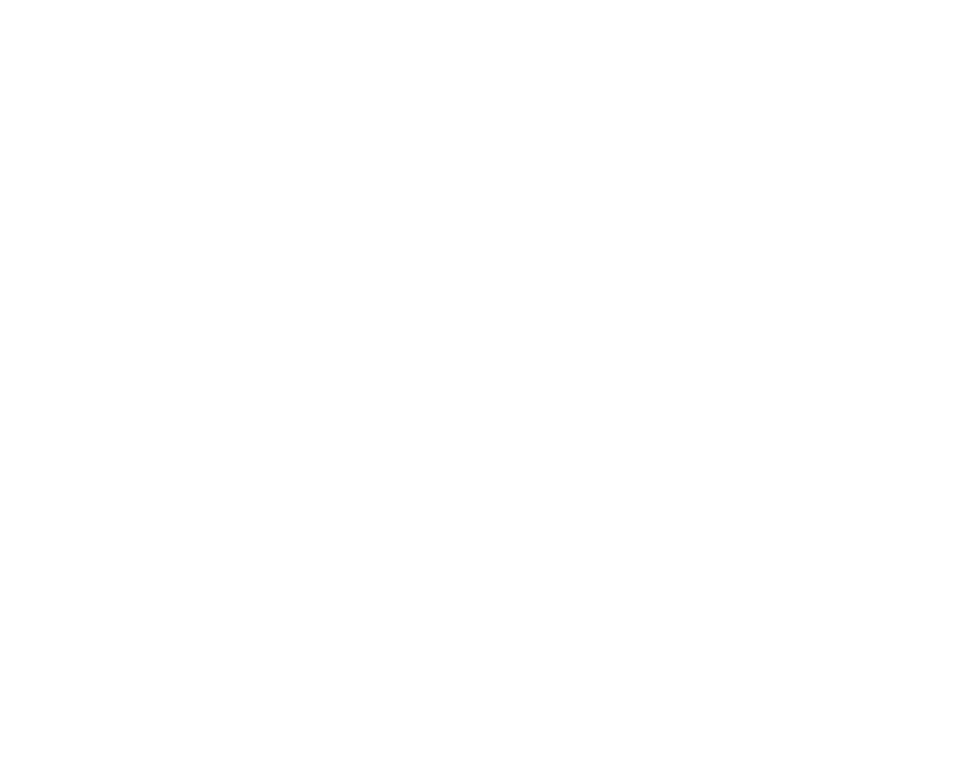

<IPython.core.display.Javascript object>


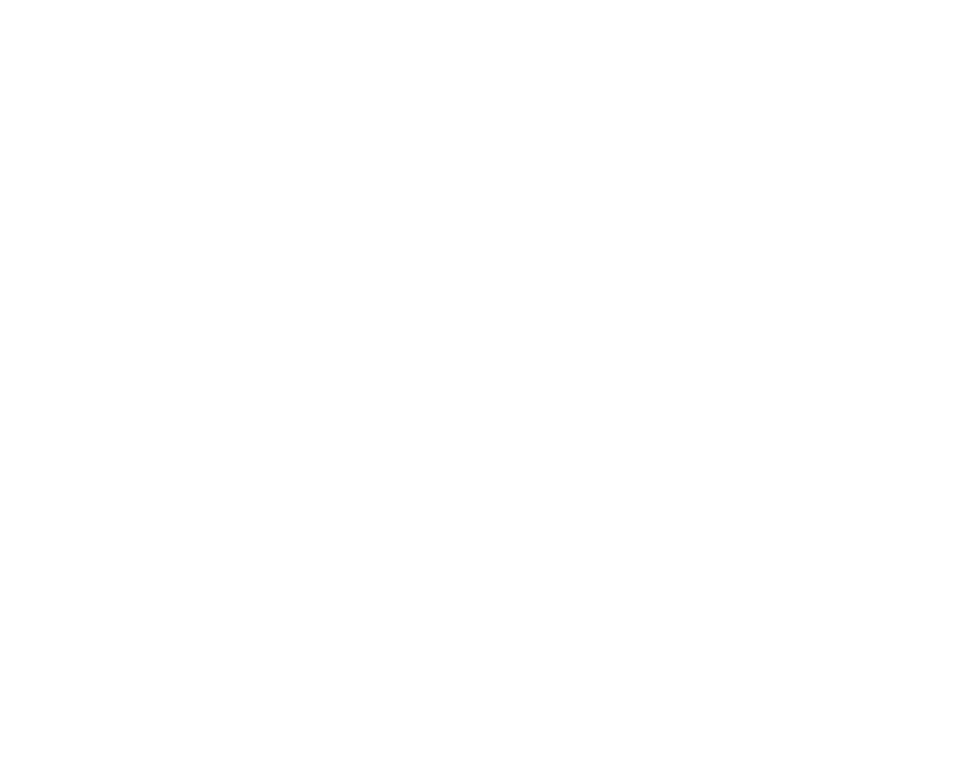

C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:5: UserWarning: This figure was saved with matplotlib version 3.1.1 and is unlikely to function correctly.
  """


<IPython.core.display.Javascript object>


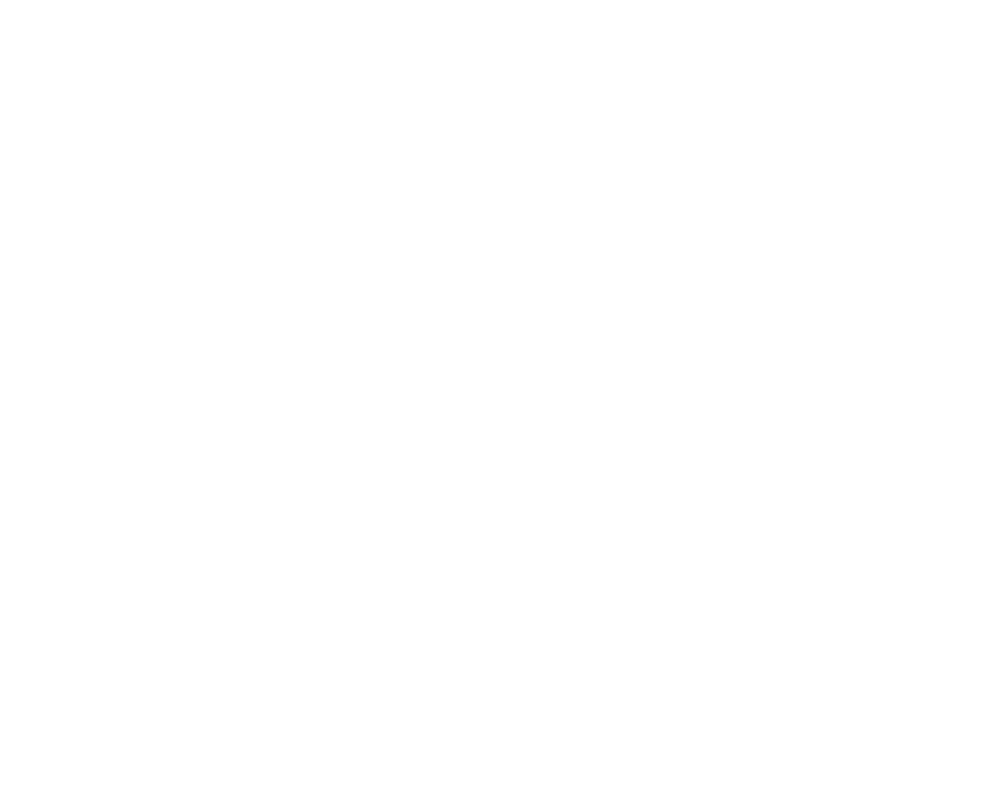

<IPython.core.display.Javascript object>


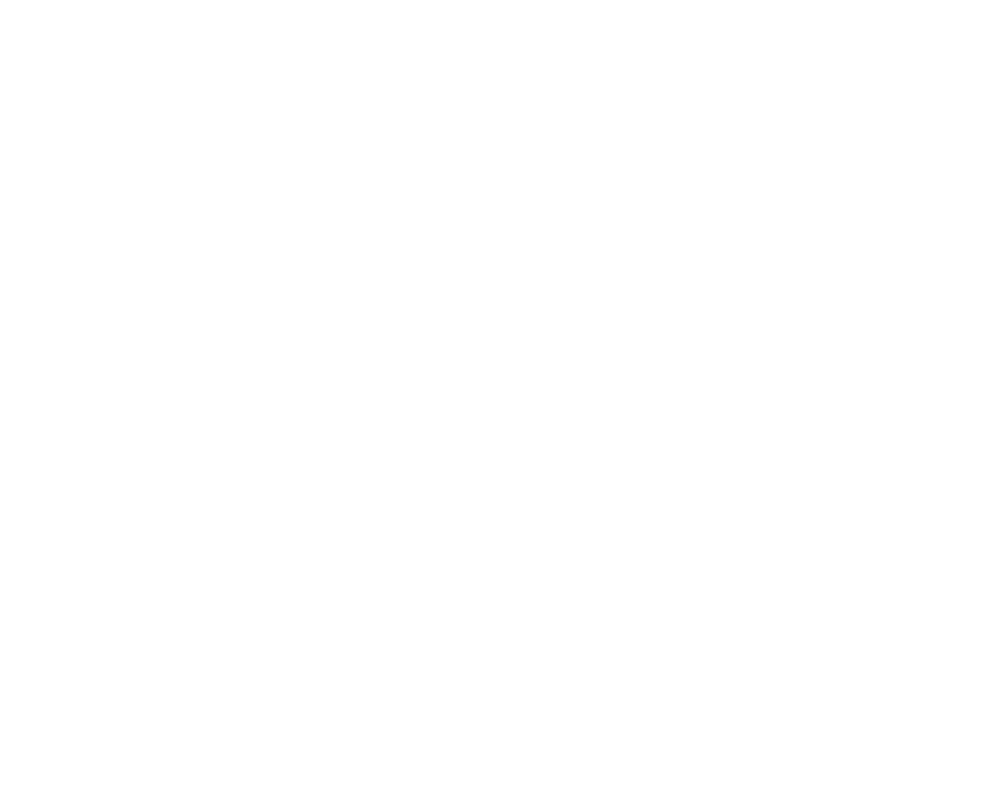

C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This figure was saved with matplotlib version 3.1.1 and is unlikely to function correctly.
  


<IPython.core.display.Javascript object>


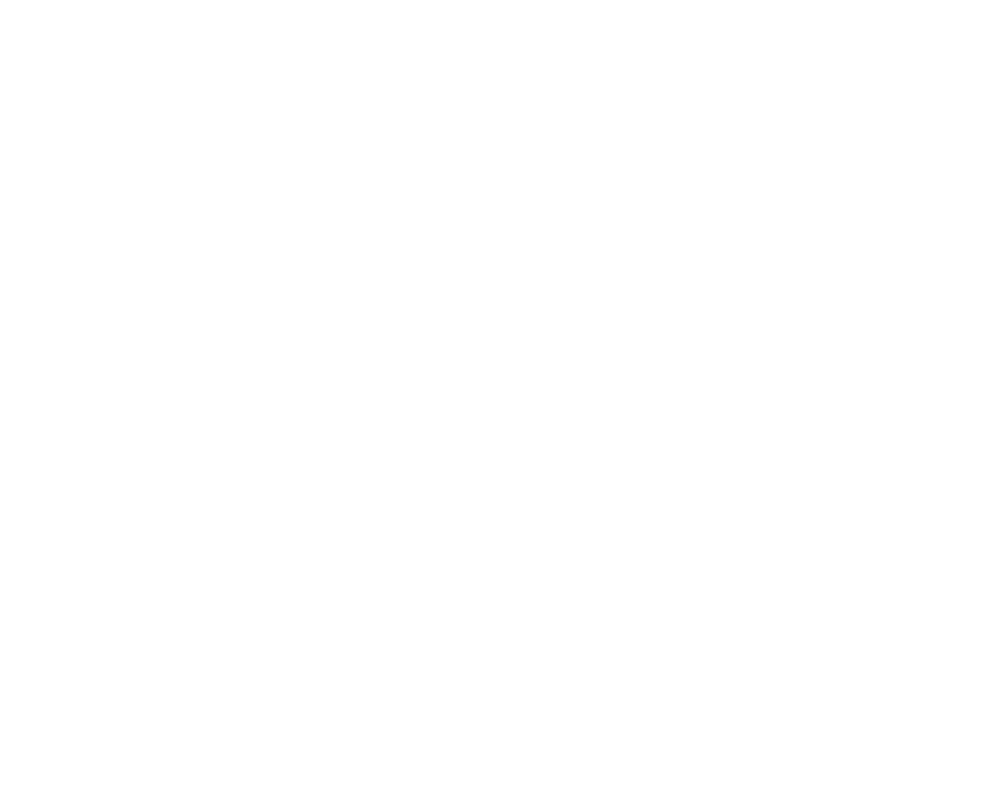

<IPython.core.display.Javascript object>


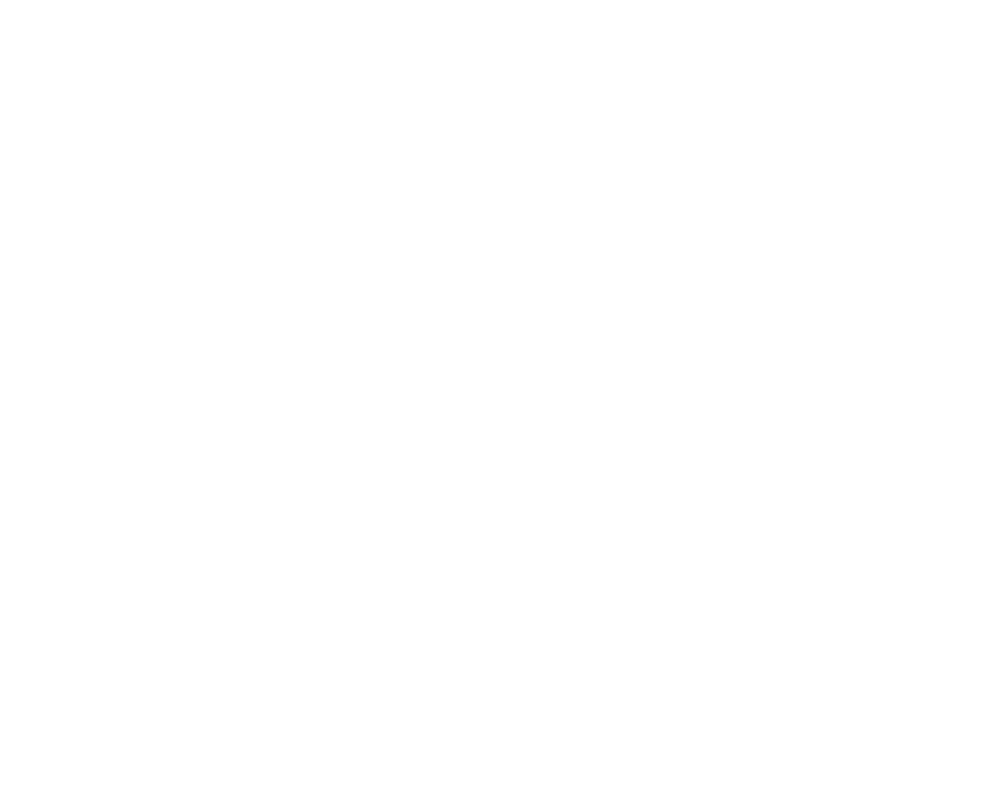

C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:7: UserWarning: This figure was saved with matplotlib version 3.1.1 and is unlikely to function correctly.
  import sys


<IPython.core.display.Javascript object>


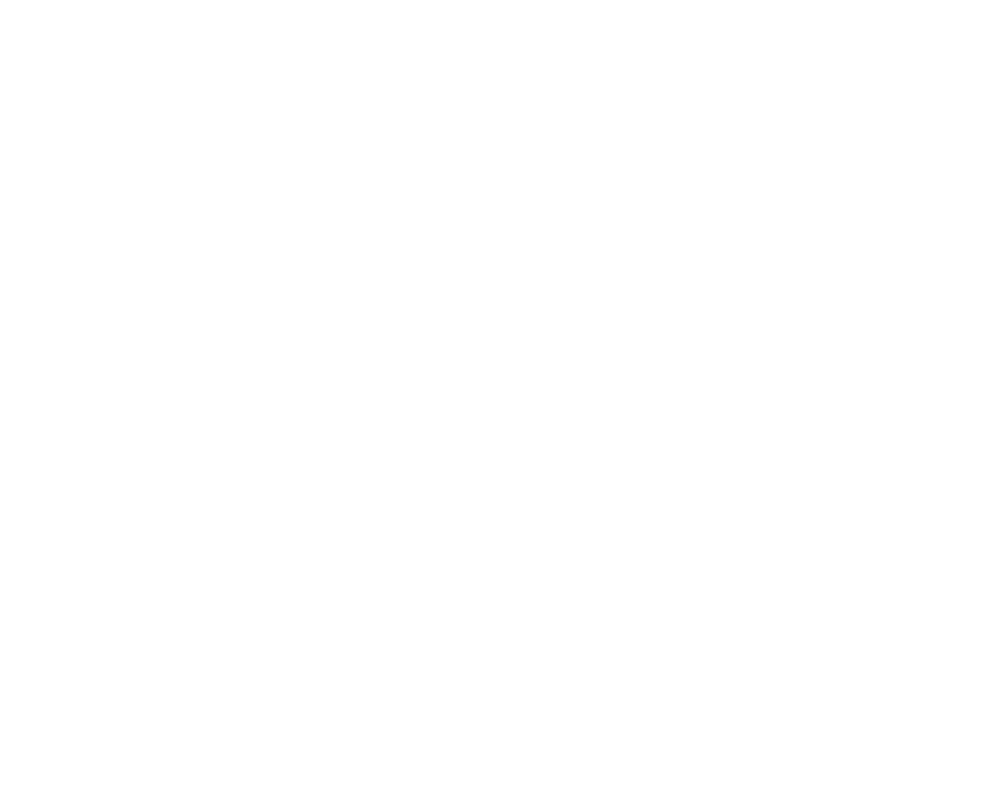

<IPython.core.display.Javascript object>


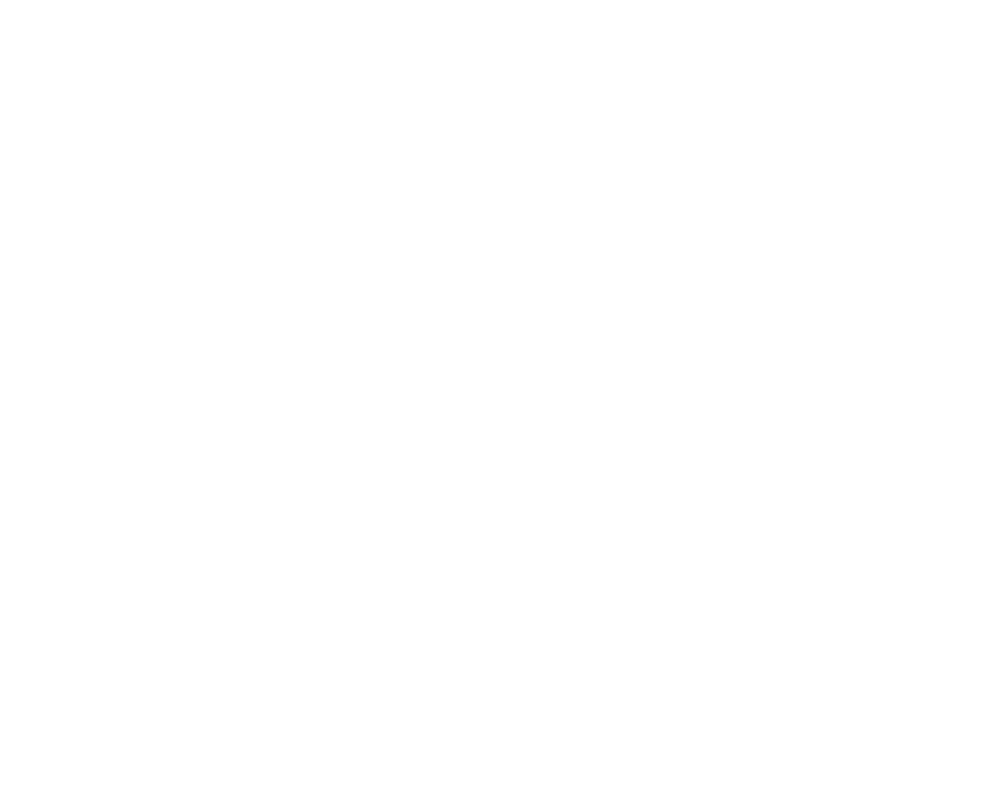

C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:9: UserWarning: This figure was saved with matplotlib version 3.1.1 and is unlikely to function correctly.
  if __name__ == '__main__':


<IPython.core.display.Javascript object>


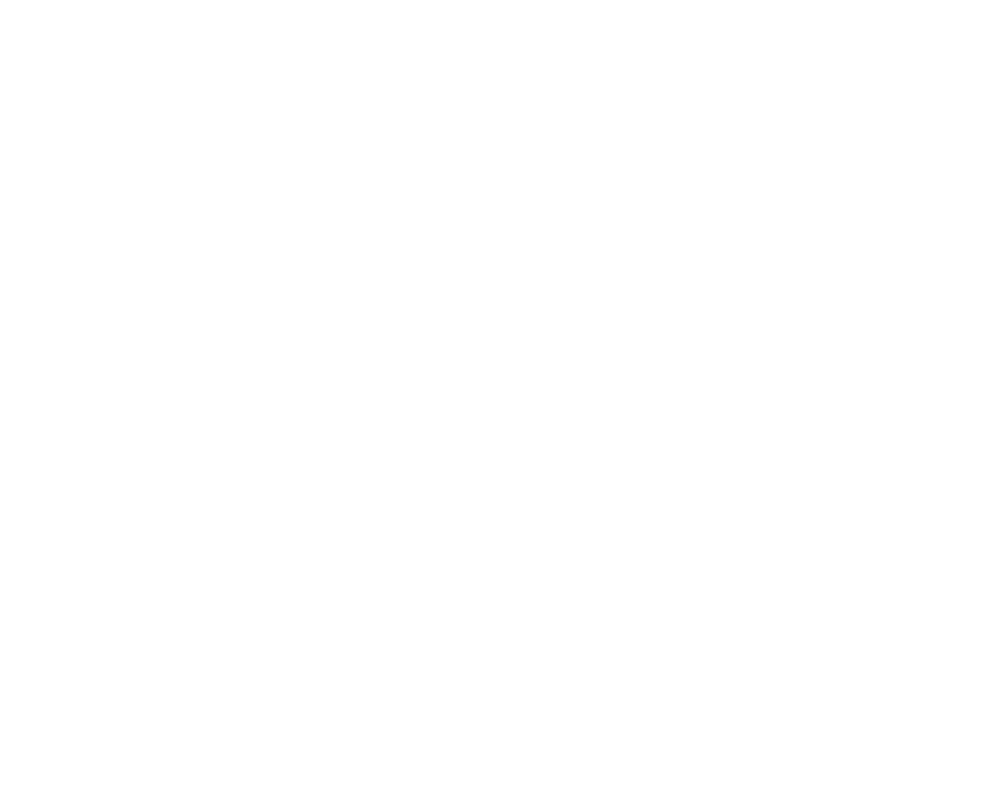

<IPython.core.display.Javascript object>


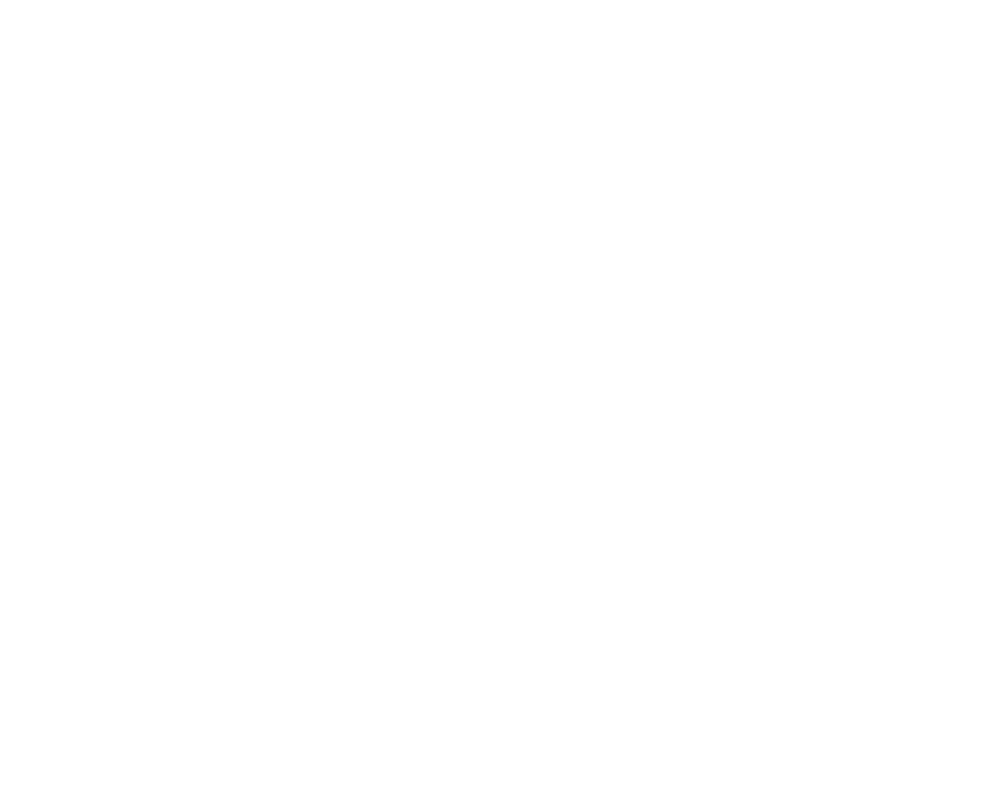

C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:10: UserWarning: This figure was saved with matplotlib version 3.1.1 and is unlikely to function correctly.
  # Remove the CWD from sys.path while we load stuff.


<IPython.core.display.Javascript object>


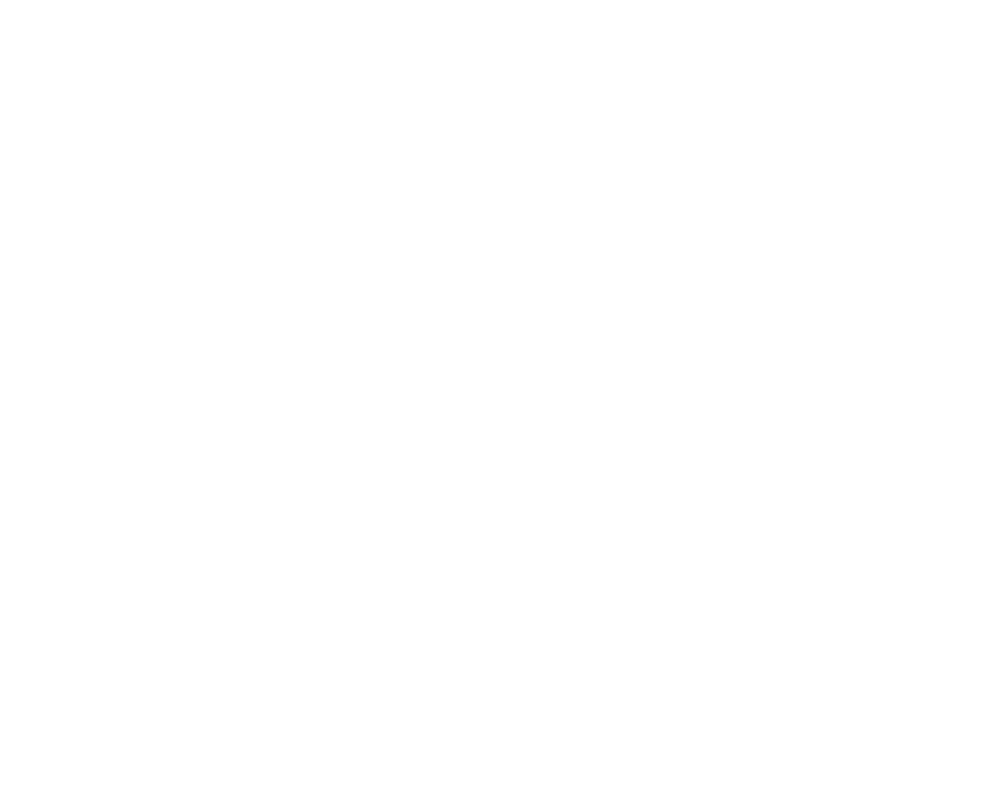

<IPython.core.display.Javascript object>


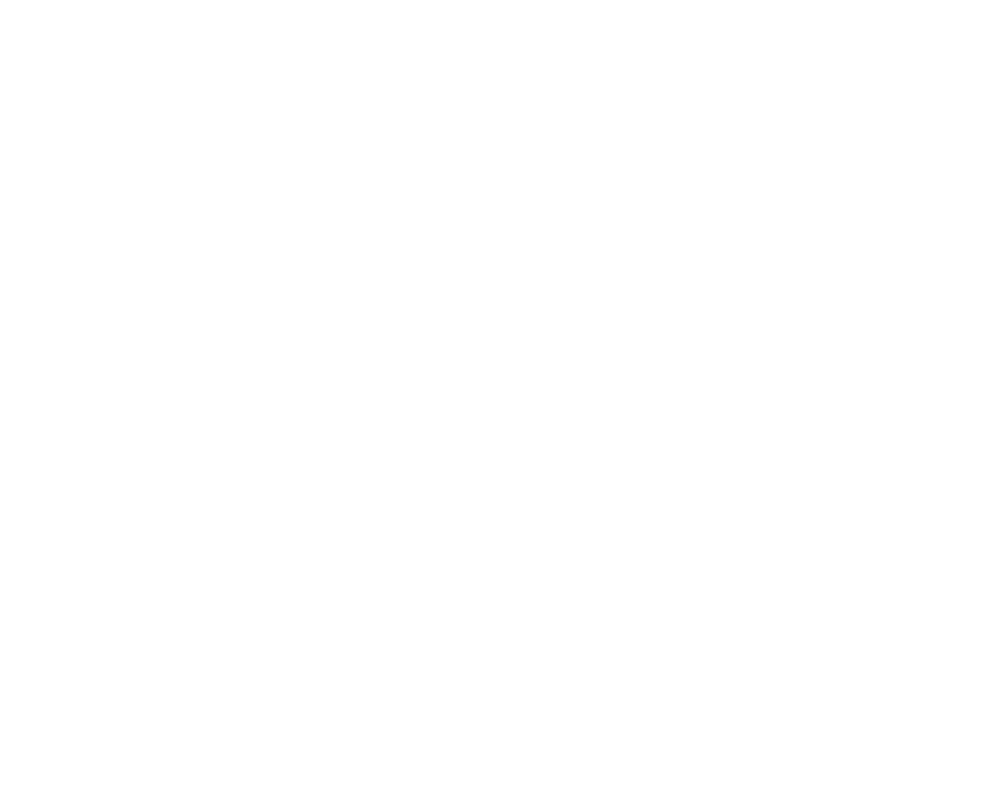

C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:11: UserWarning: This figure was saved with matplotlib version 3.1.1 and is unlikely to function correctly.
  # This is added back by InteractiveShellApp.init_path()


<IPython.core.display.Javascript object>


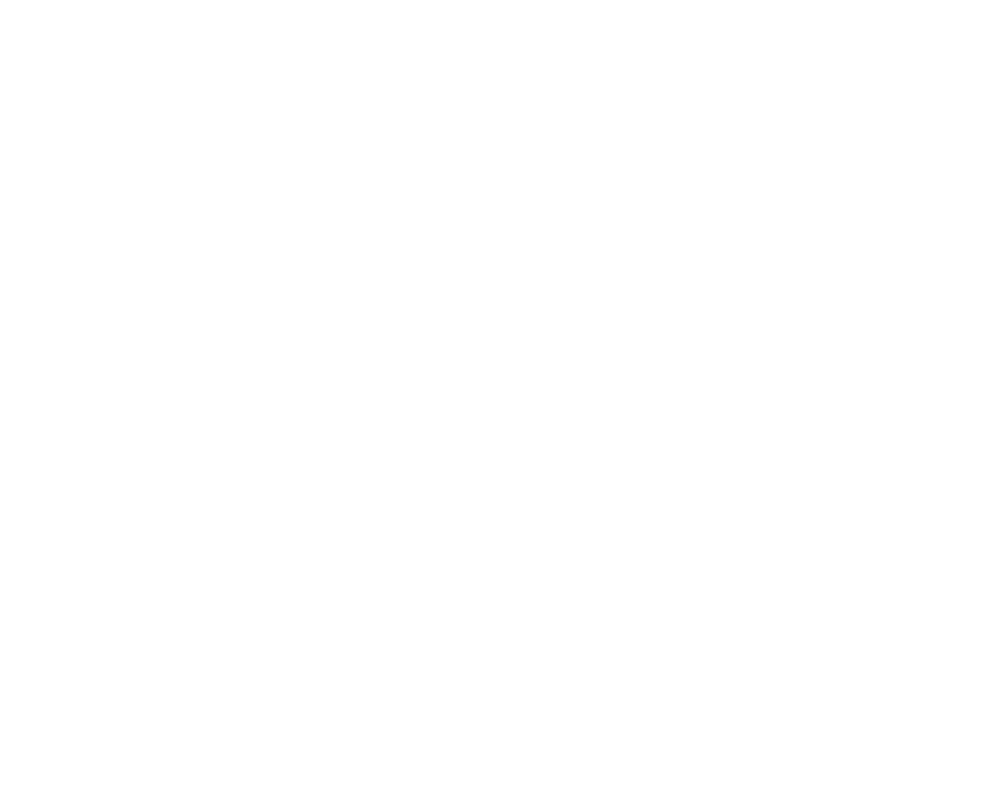

<IPython.core.display.Javascript object>


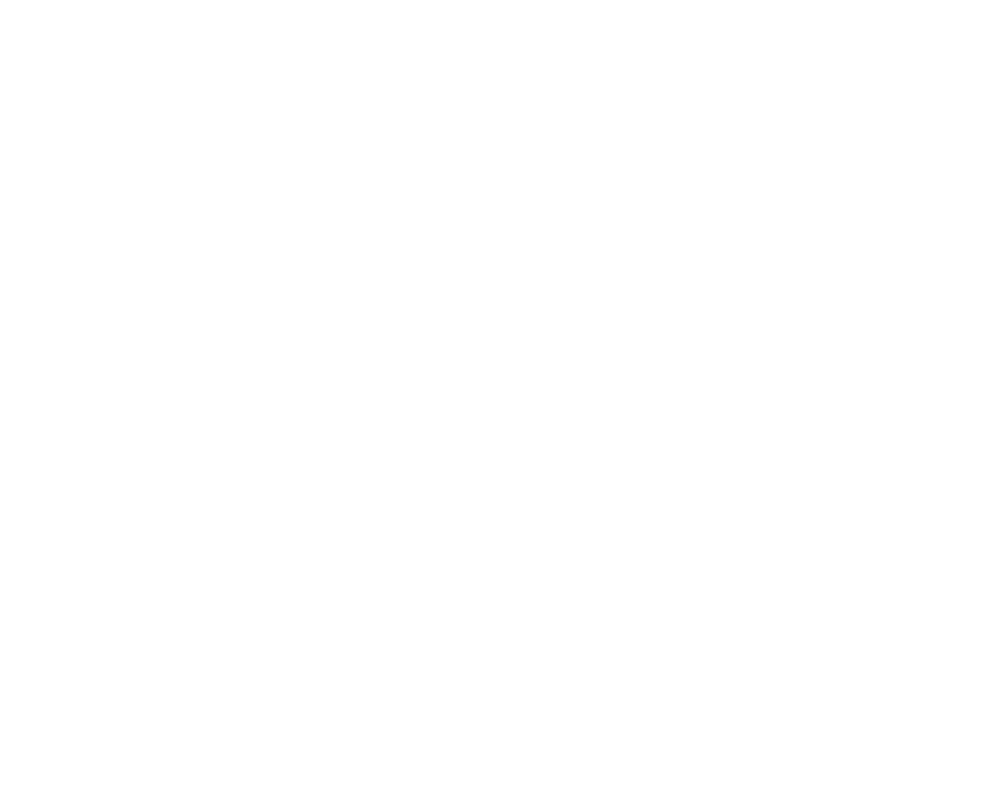

C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:12: UserWarning: This figure was saved with matplotlib version 3.1.1 and is unlikely to function correctly.
  if sys.path[0] == '':


<IPython.core.display.Javascript object>


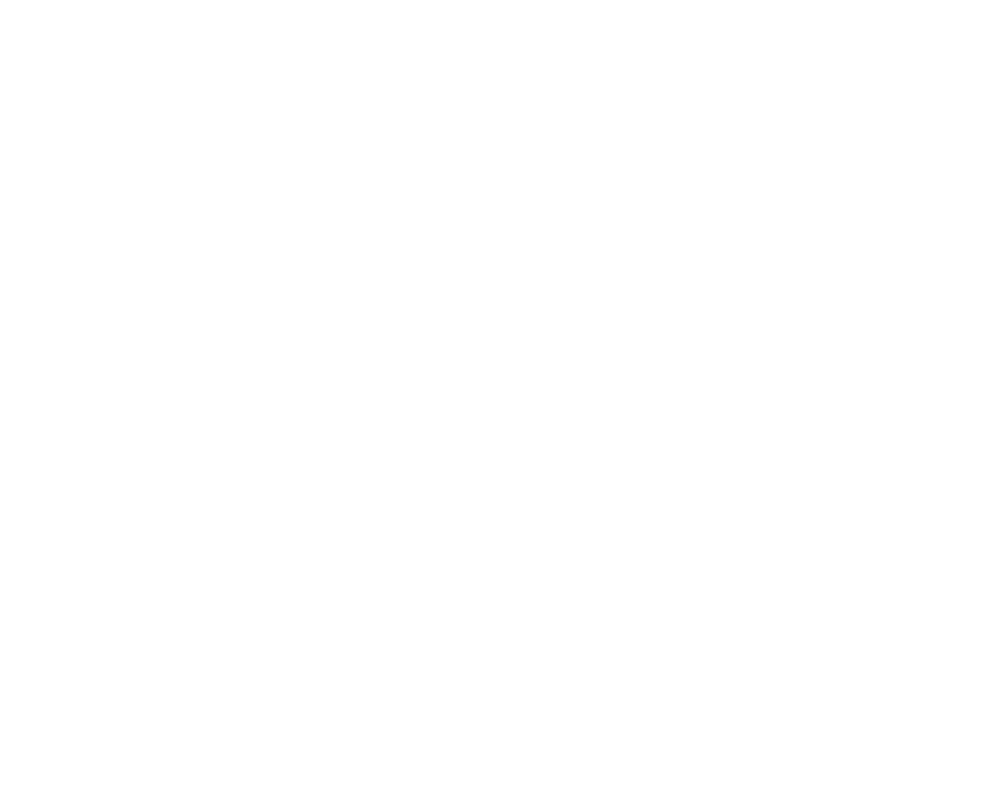

<IPython.core.display.Javascript object>


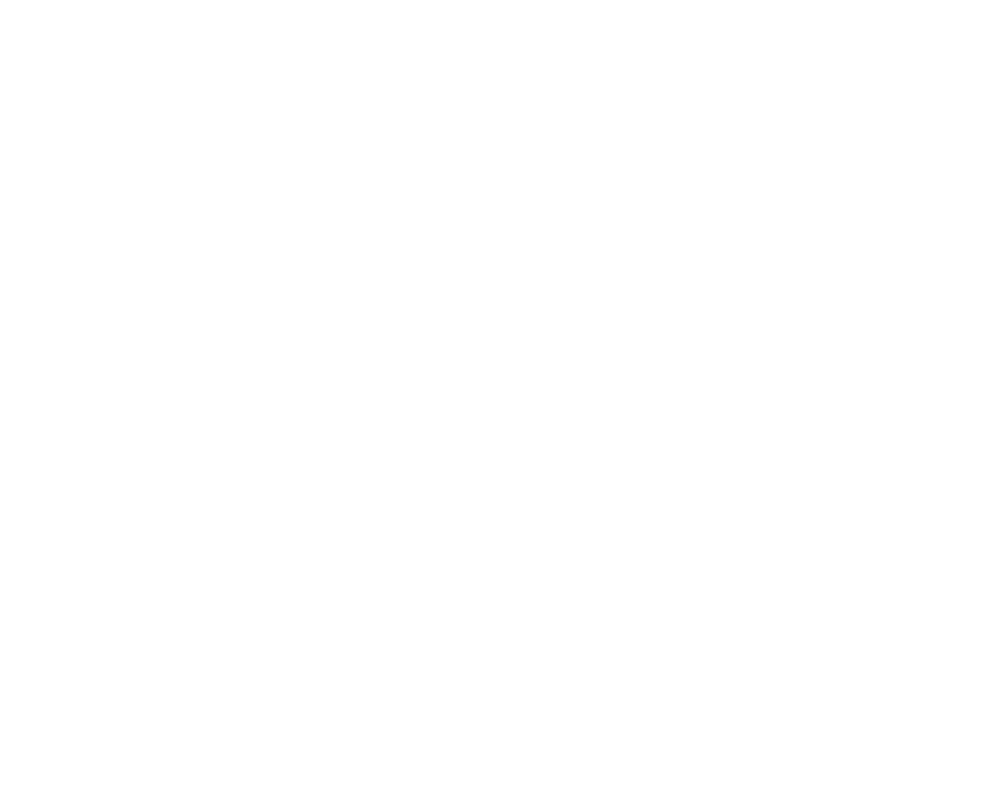

In [64]:
linear_svc_data = load_pickles('SVM')

In [65]:
for key, item in linear_svc_data.items():
    print(key + " | Test Results: " + str(item['test_results']['acc']))

movie | Test Results: 0.88048
movie_binary | Test Results: 0.8846
movie_ngrams | Test Results: 0.89516
movie_binary_ngrams | Test Results: 0.90392
news | Test Results: 0.6865374402549124
news_binary | Test Results: 0.6902549123738715
news_ngrams | Test Results: 0.6895910780669146
news_binary_ngrams | Test Results: 0.6929102496016994


In [51]:
linear_svc_data['movie_binary_ngrams']['grid'].best_params_

{'C': 0.5455594781168519, 'loss': 'squared_hinge', 'penalty': 'l2'}

In [52]:
linear_svc_data['news_binary_ngrams']['grid'].best_params_

{'C': 0.33598182862837817, 'loss': 'squared_hinge', 'penalty': 'l2'}

In [66]:
from sklearn.svm import LinearSVC
linear_svc = LinearSVC(dual=True, penalty = 'l2', loss='hinge', C = 1, max_iter=10000, random_state=42)

linear_svc_param_movie = { #Params for gridsearch
    'C': [0.5, 0.52, 0.54, 0.56, 0.58, 0.60],
    'penalty': ['l2'],
    'loss': ['squared_hinge']
}

linear_svc_grid_movie = GridSearchCV(estimator=linear_svc, param_grid=linear_svc_param_movie, n_jobs=-1,
                                cv=5, refit=True, verbose=2, return_train_score = True) #Tune Parameters


Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:    8.5s finished
C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\sklearn\utils\validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


<IPython.core.display.Javascript object>


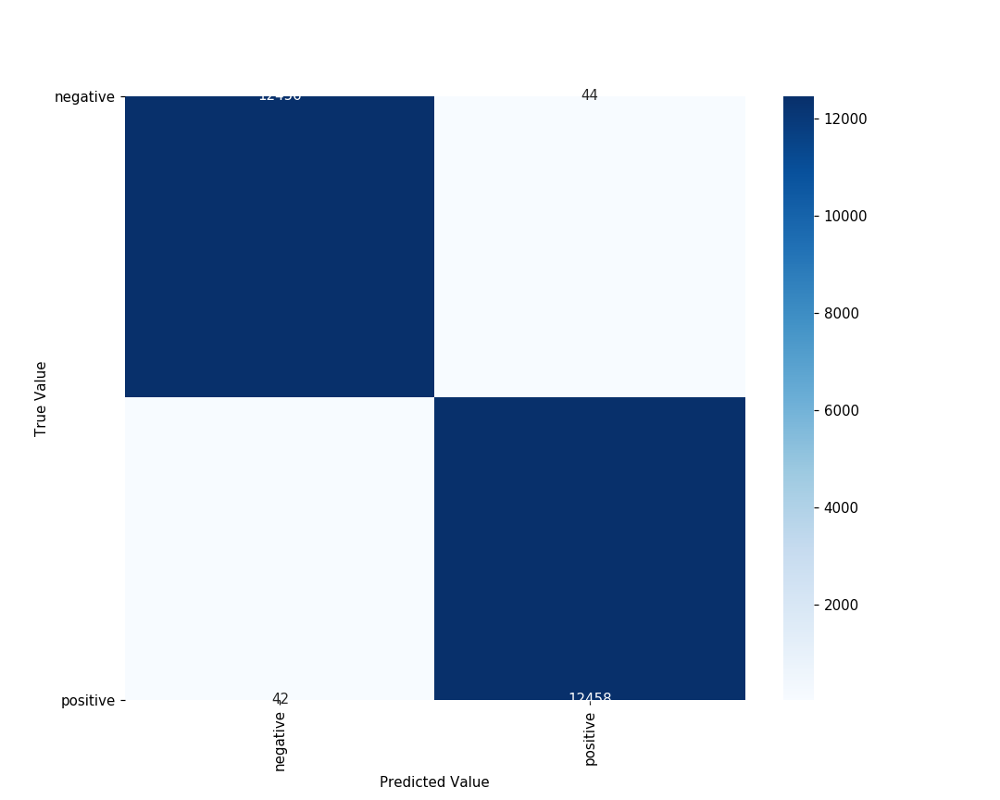

<IPython.core.display.Javascript object>


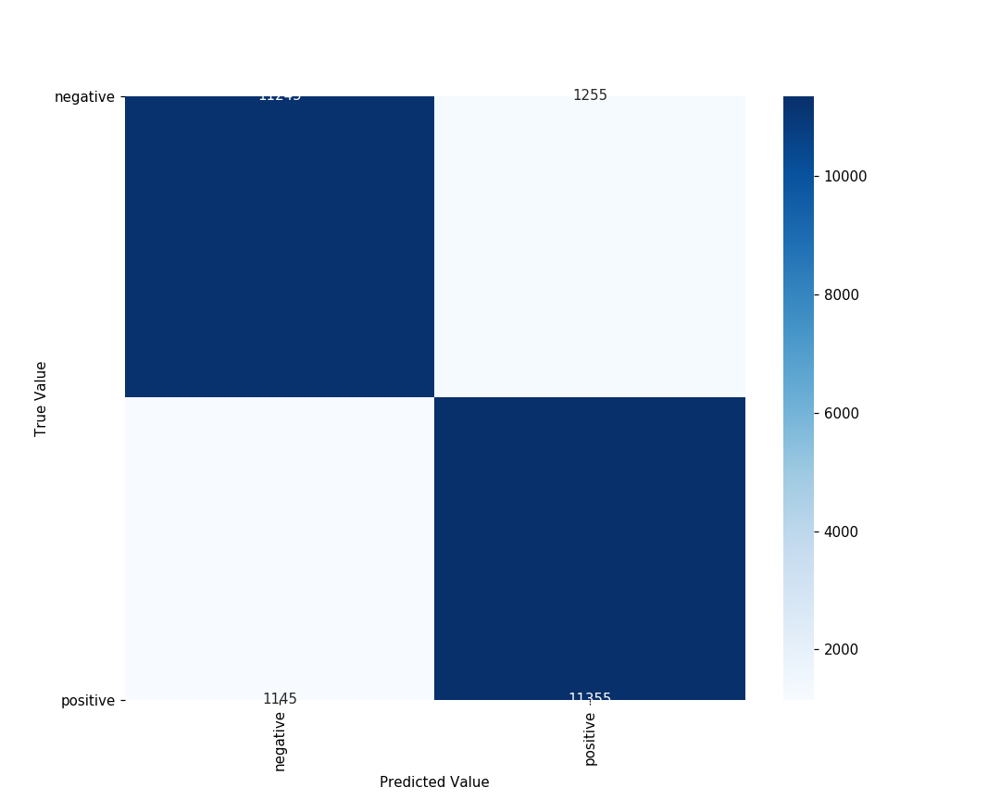

In [97]:
movie_binary_ngrams_results_linear_svc_fine = cv_eval_save("movie_binary_ngrams_results_linear_svc_fine.pkl", linear_svc_grid_movie, movie['movie_binary_ngrams']['X_train'], movie['movie_binary_ngrams']['y_train'],
             movie['movie_binary_ngrams']['X_test'], movie['movie_binary_ngrams']['y_test'], movie_labels,'binary')

In [98]:
movie_binary_ngrams_results_linear_svc_fine

{'grid': GridSearchCV(cv=5, error_score=nan,
              estimator=LinearSVC(C=1, class_weight=None, dual=True,
                                  fit_intercept=True, intercept_scaling=1,
                                  loss='hinge', max_iter=10000,
                                  multi_class='ovr', penalty='l2',
                                  random_state=42, tol=0.0001, verbose=0),
              iid='deprecated', n_jobs=-1,
              param_grid={'C': [0.5, 0.52, 0.54, 0.56, 0.58, 0.6],
                          'loss': ['squared_hinge'], 'penalty': ['l2']},
              pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
              scoring=None, verbose=2),
 'val_acc': 0.90296,
 'val_std': 0.0059805016511995214,
 'train_acc': 0.9975400000000001,
 'train_std': 0.00013928388277186413,
 'train_results': {'acc': 0.99656,
  'f1': 0.9965602751779857,
  'conf_matrix': array([[12456,    44],
         [   42, 12458]], dtype=int64),
  'conf_matrix_plot': <Figure size 

In [99]:
movie_binary_ngrams_results_linear_svc_fine['grid'].best_params_

{'C': 0.54, 'loss': 'squared_hinge', 'penalty': 'l2'}

In [55]:
linear_svc_param_news = { #Params for gridsearch
    'C': [0.27, 0.29, 0.31, 0.33, 0.35, 0.37, 0.39, 0.41, 0.43, 0.45],
    'penalty': ['l2'],
    'loss': ['squared_hinge']
}

linear_svc_grid_news = GridSearchCV(estimator=linear_svc, param_grid=linear_svc_param_news, n_jobs=-1,
                                cv=5, refit=True, verbose=2, return_train_score = True) #Tune Parameters


Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   11.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   18.3s finished
C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\sklearn\utils\validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


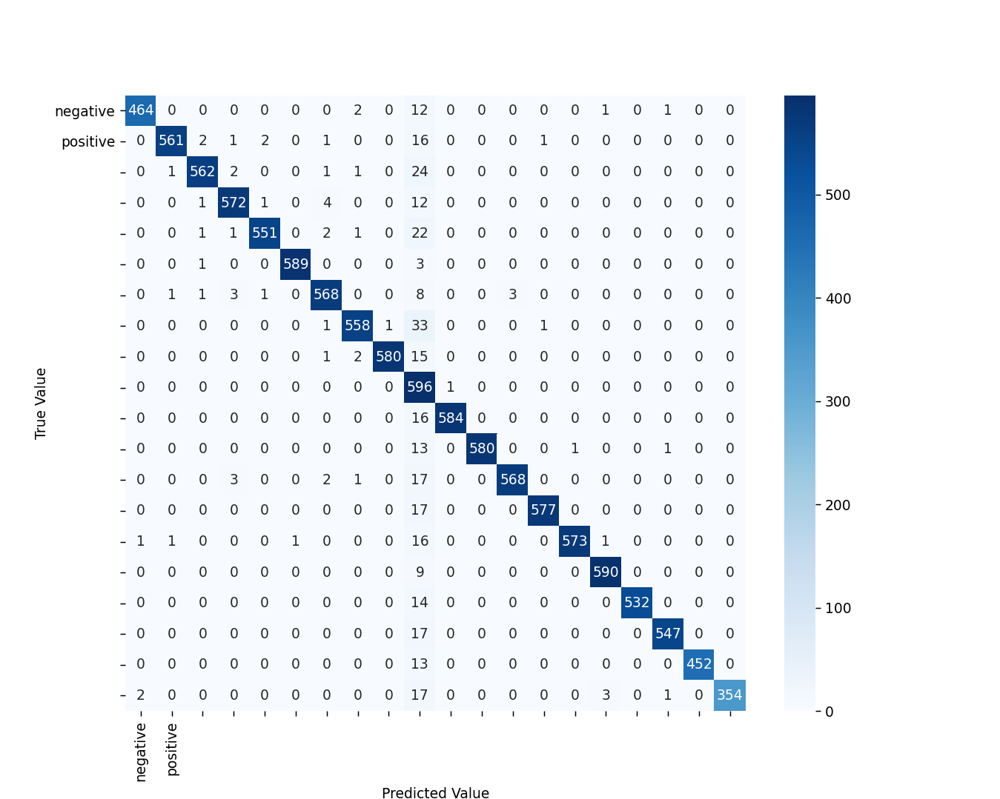

<IPython.core.display.Javascript object>


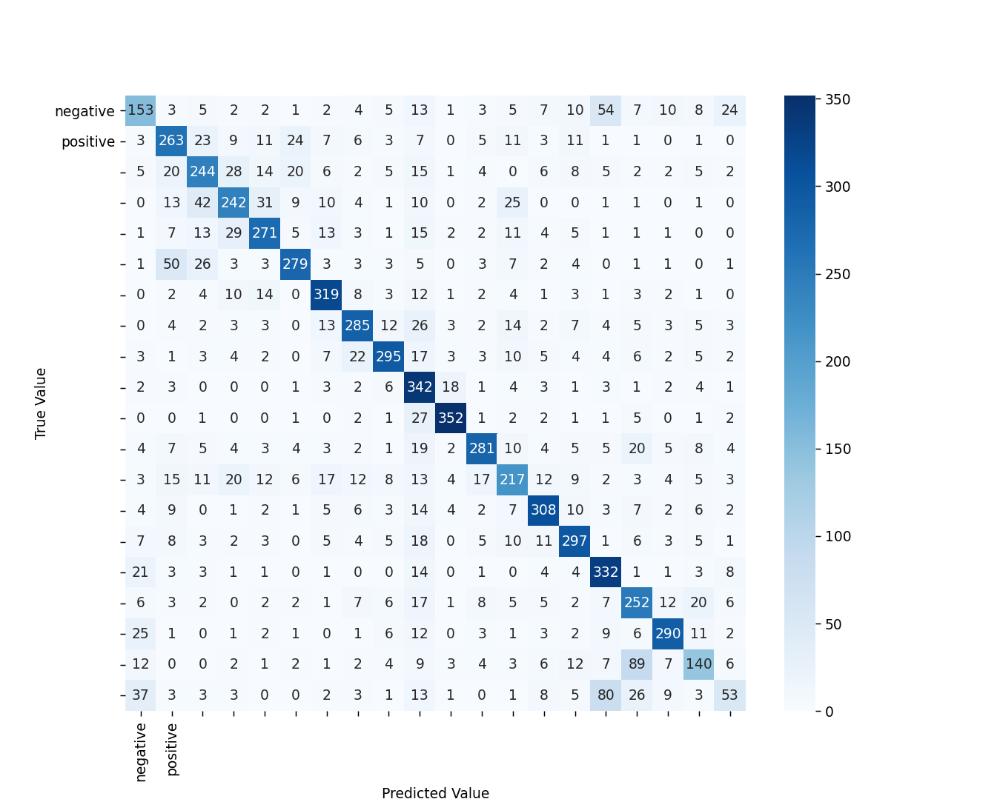

In [56]:
news_binary_ngrams_results_linear_svc_fine = cv_eval_save("news_binary_ngrams_results_linear_svc_fine.pkl", linear_svc_grid_news, news['news_binary_ngrams']['X_train'], news['news_binary_ngrams']['y_train'],
             news['news_binary_ngrams']['X_test'], news['news_binary_ngrams']['y_test'], movie_labels,'micro')

In [57]:
news_binary_ngrams_results_linear_svc_fine

{'grid': GridSearchCV(cv=5, error_score=nan,
              estimator=LinearSVC(C=1, class_weight=None, dual=True,
                                  fit_intercept=True, intercept_scaling=1,
                                  loss='hinge', max_iter=10000,
                                  multi_class='ovr', penalty='l2',
                                  random_state=42, tol=0.0001, verbose=0),
              iid='deprecated', n_jobs=-1,
              param_grid={'C': [0.27, 0.29, 0.31, 0.33, 0.35, 0.37, 0.39, 0.41,
                                0.43, 0.45],
                          'loss': ['squared_hinge'], 'penalty': ['l2']},
              pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
              scoring=None, verbose=2),
 'val_acc': 0.7494251310729284,
 'val_std': 0.005185911785537019,
 'train_acc': 0.9699487433438627,
 'train_std': 0.00038848791869880797,
 'train_results': {'acc': 0.9685345589535089,
  'f1': 0.9685345589535089,
  'conf_matrix': array([[464,   0,  

In [58]:
news_binary_ngrams_results_linear_svc_fine['grid'].best_params_

{'C': 0.39, 'loss': 'squared_hinge', 'penalty': 'l2'}

In [69]:
linear_svc_data['movie']['grid'].best_params_

{'C': 0.33598182862837817, 'loss': 'squared_hinge', 'penalty': 'l2'}

In [70]:
linear_svc_param_news = { #Params for gridsearch
    'C': [0.27, 0.29, 0.31, 0.33, 0.35, 0.37, 0.39, 0.41, 0.43, 0.45],
    'penalty': ['l2'],
    'loss': ['squared_hinge']
}

linear_svc_grid_news = GridSearchCV(estimator=linear_svc, param_grid=linear_svc_param_news, n_jobs=-1,
                                cv=5, refit=True, verbose=2, return_train_score = True) #Tune Parameters


Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   10.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   16.6s finished
C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\sklearn\utils\validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


<IPython.core.display.Javascript object>


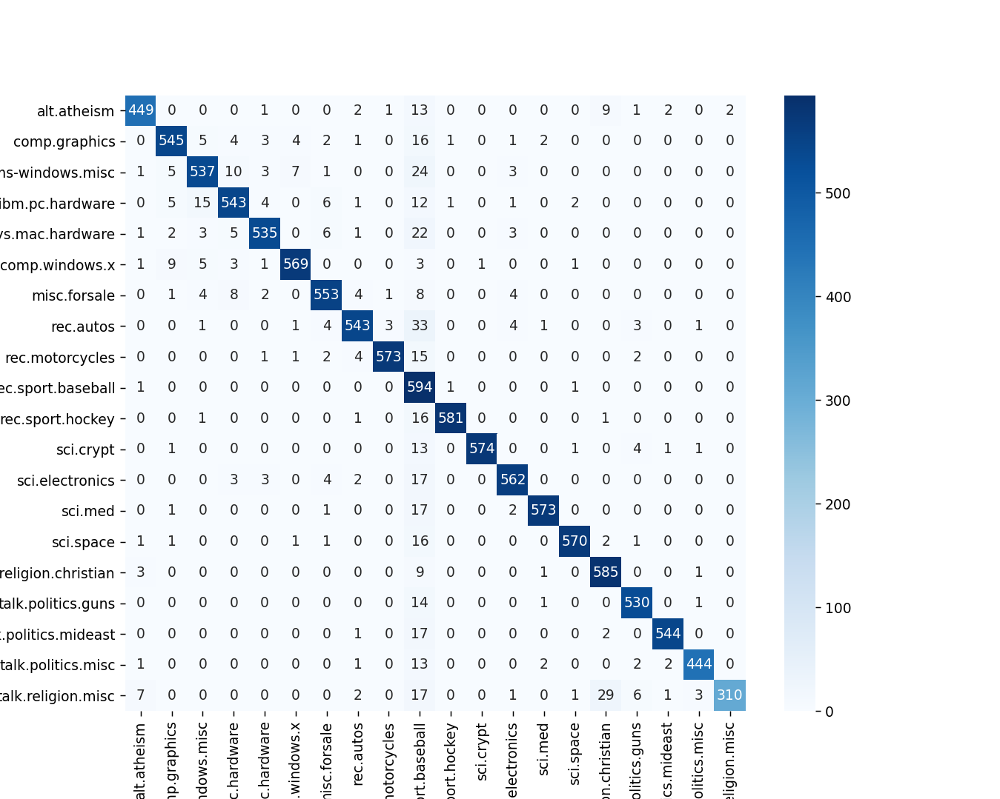

<IPython.core.display.Javascript object>


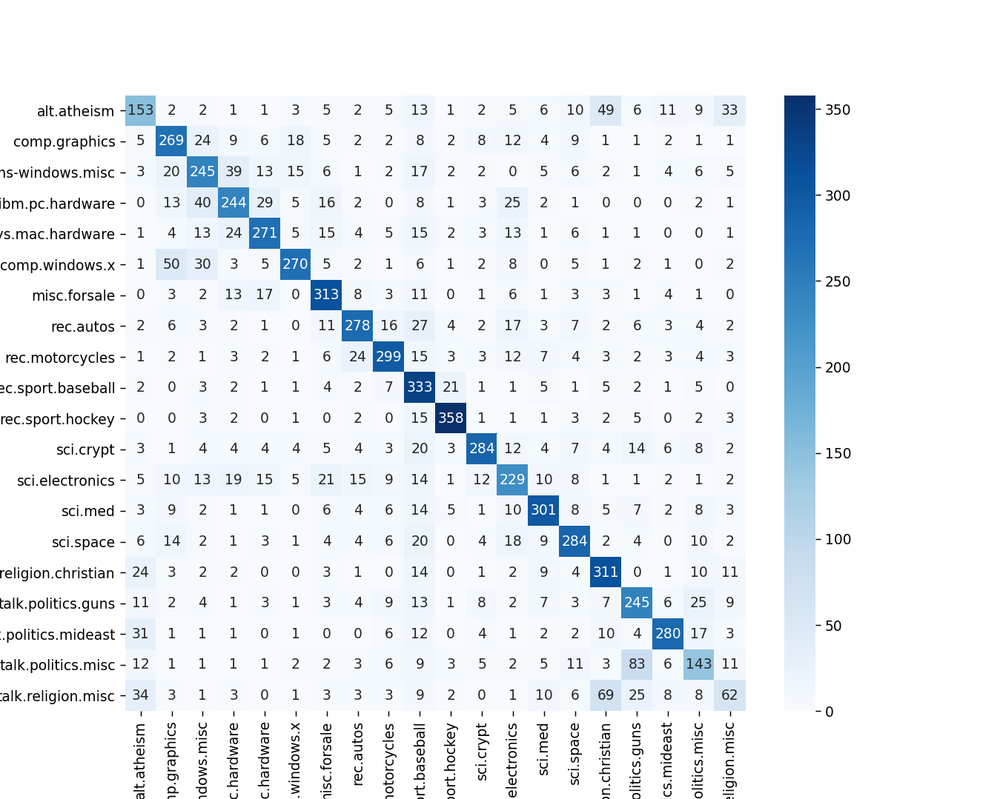

In [71]:
news_results_linear_svc_fine = cv_eval_save("news_results_linear_svc_fine.pkl", linear_svc_grid_news, news['news']['X_train'], news['news']['y_train'],
             news['news']['X_test'], news['news']['y_test'], news_labels,'micro')

In [72]:
news_results_linear_svc_fine

{'grid': GridSearchCV(cv=5, error_score=nan,
              estimator=LinearSVC(C=1, class_weight=None, dual=True,
                                  fit_intercept=True, intercept_scaling=1,
                                  loss='hinge', max_iter=10000,
                                  multi_class='ovr', penalty='l2',
                                  random_state=42, tol=0.0001, verbose=0),
              iid='deprecated', n_jobs=-1,
              param_grid={'C': [0.27, 0.29, 0.31, 0.33, 0.35, 0.37, 0.39, 0.41,
                                0.43, 0.45],
                          'loss': ['squared_hinge'], 'penalty': ['l2']},
              pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
              scoring=None, verbose=2),
 'val_acc': 0.7451823885806851,
 'val_std': 0.007417403784462079,
 'train_acc': 0.9511003903690447,
 'train_std': 0.0006699396188903631,
 'train_results': {'acc': 0.9469683577868128,
  'f1': 0.9469683577868129,
  'conf_matrix': array([[449,   0,   

# Decision Tree

<IPython.core.display.Javascript object>


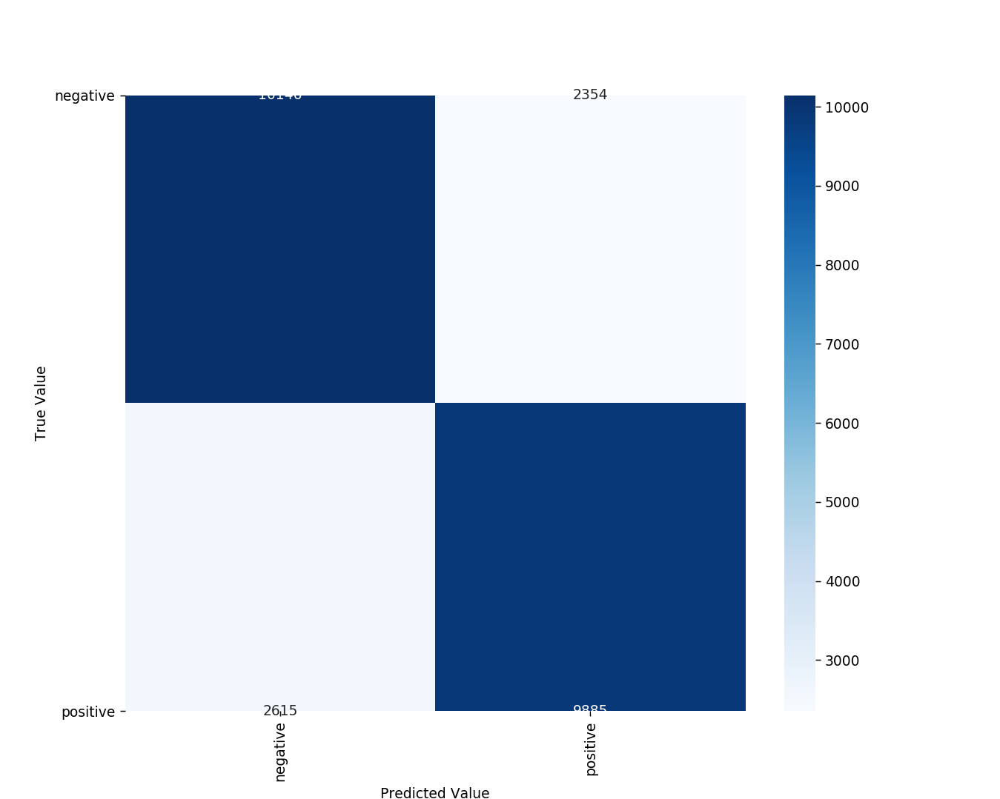

<IPython.core.display.Javascript object>


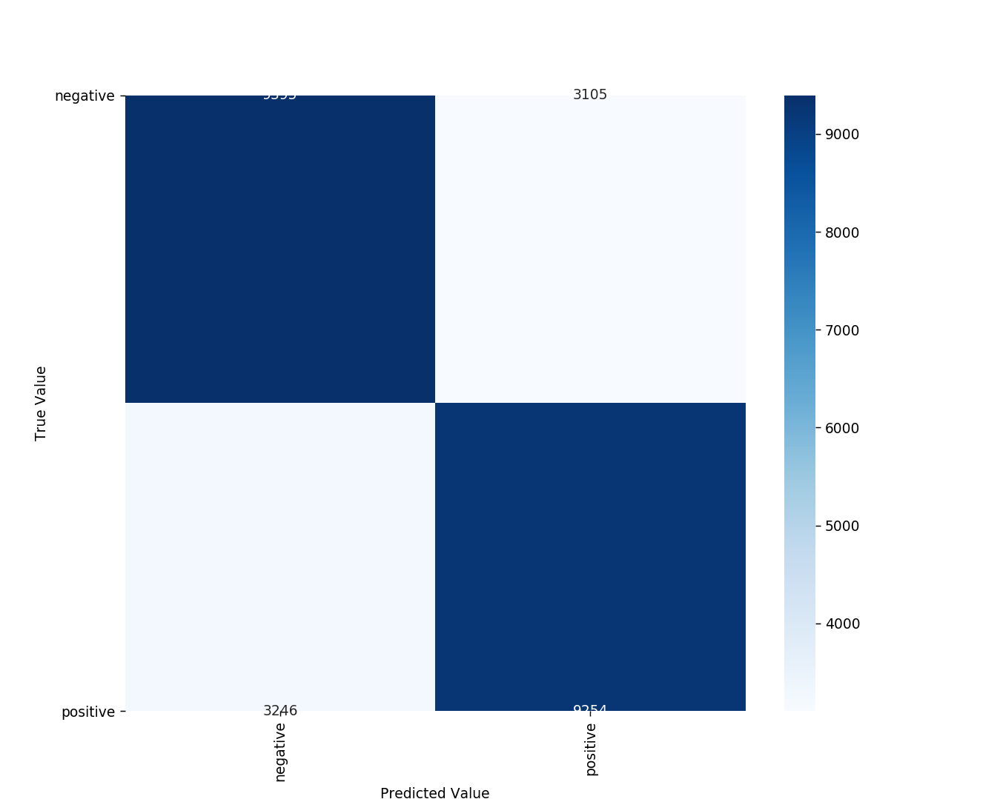

<IPython.core.display.Javascript object>


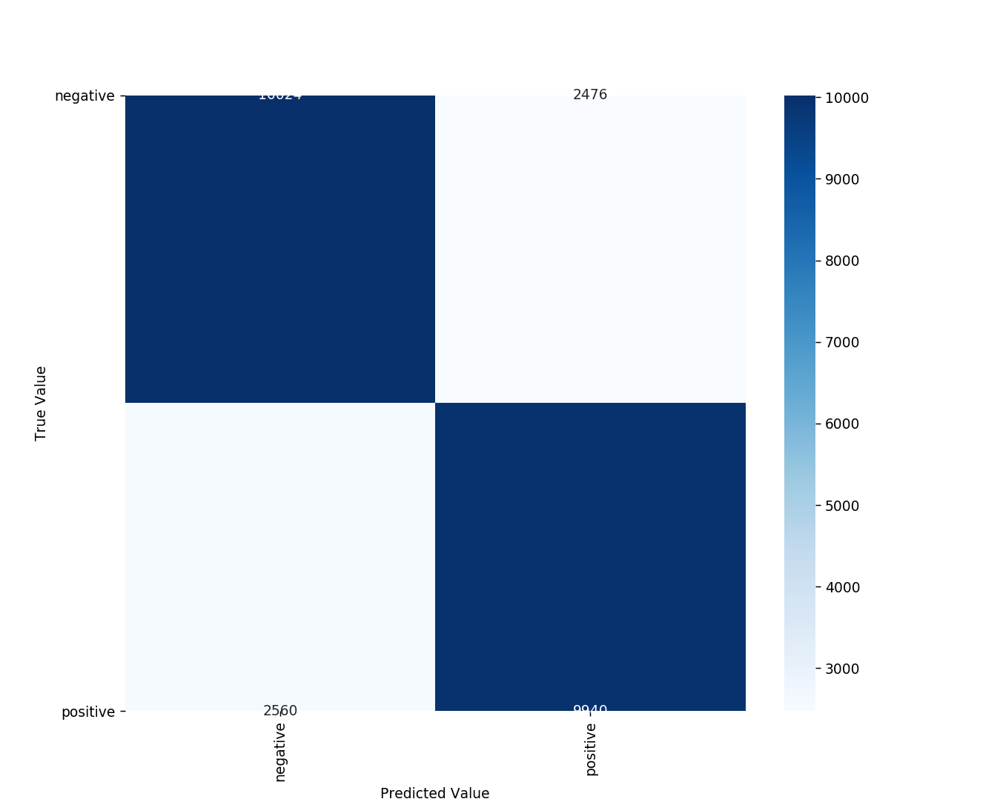

<IPython.core.display.Javascript object>


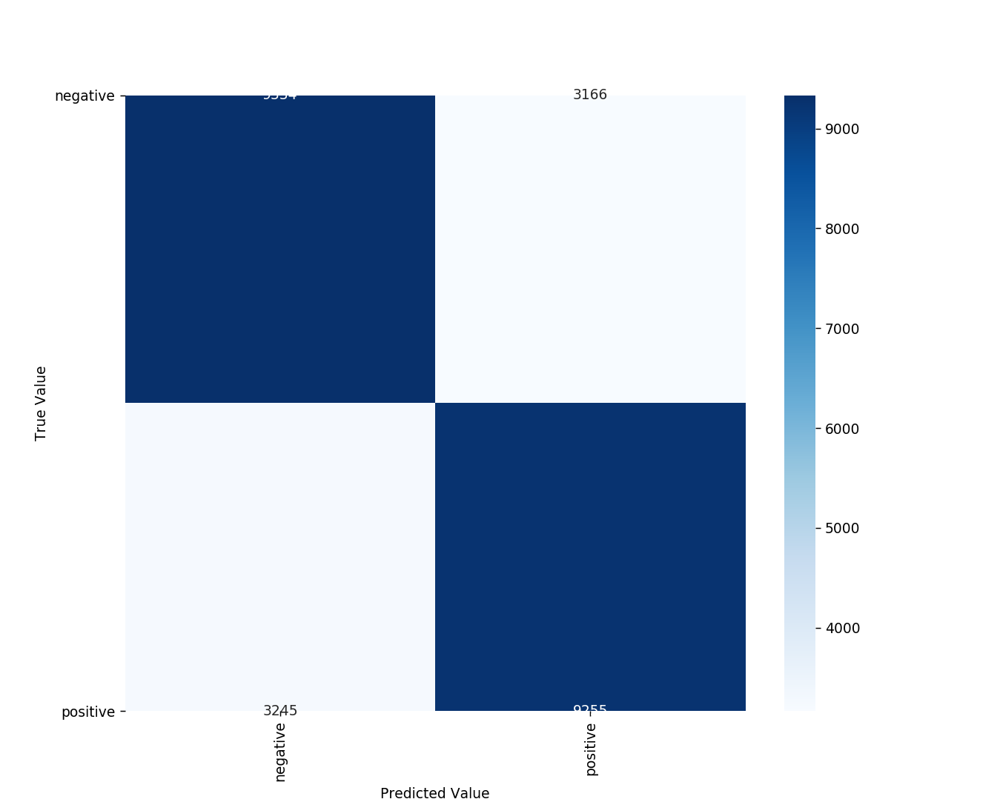

<IPython.core.display.Javascript object>


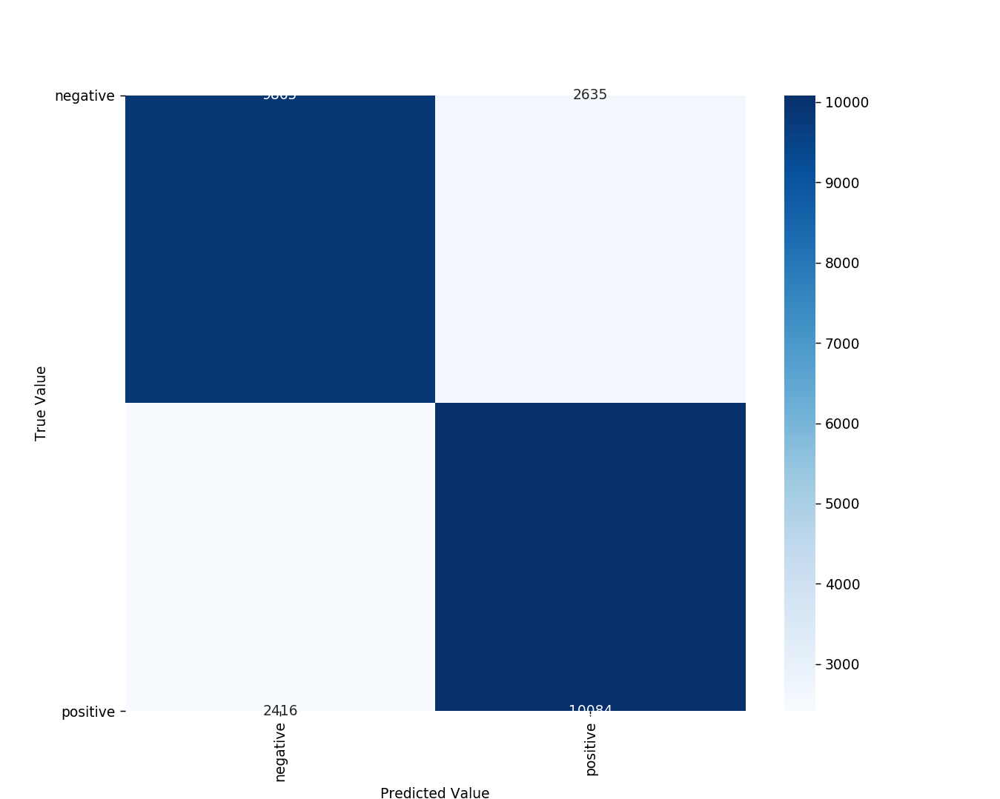

<IPython.core.display.Javascript object>


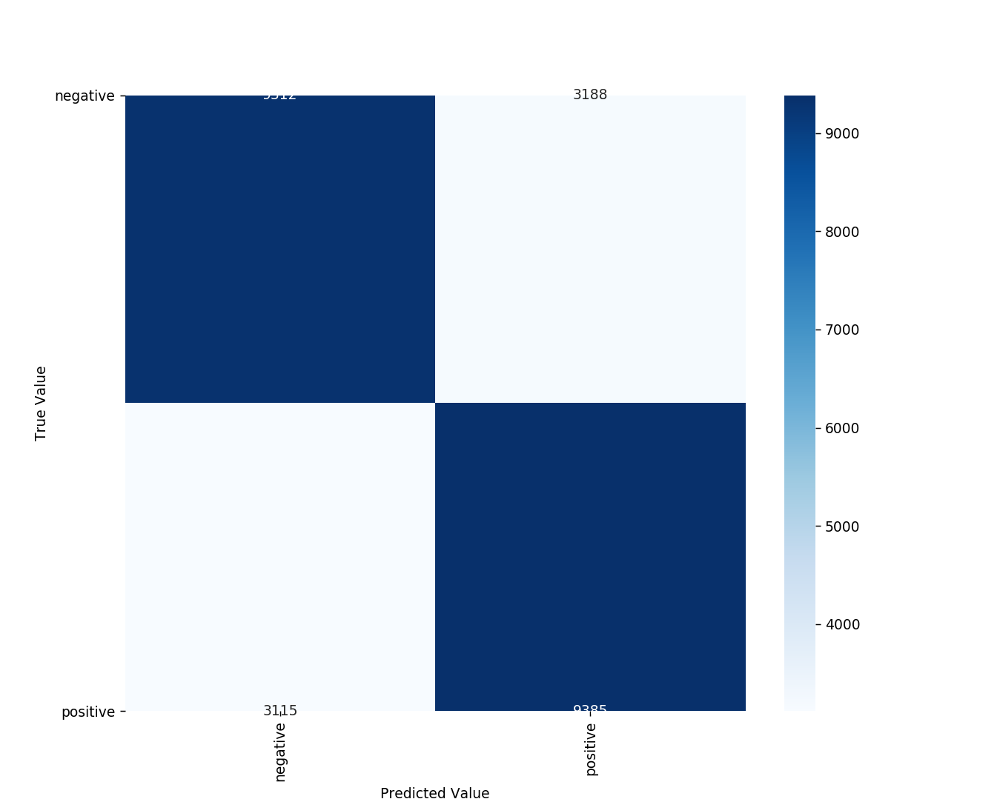

<IPython.core.display.Javascript object>


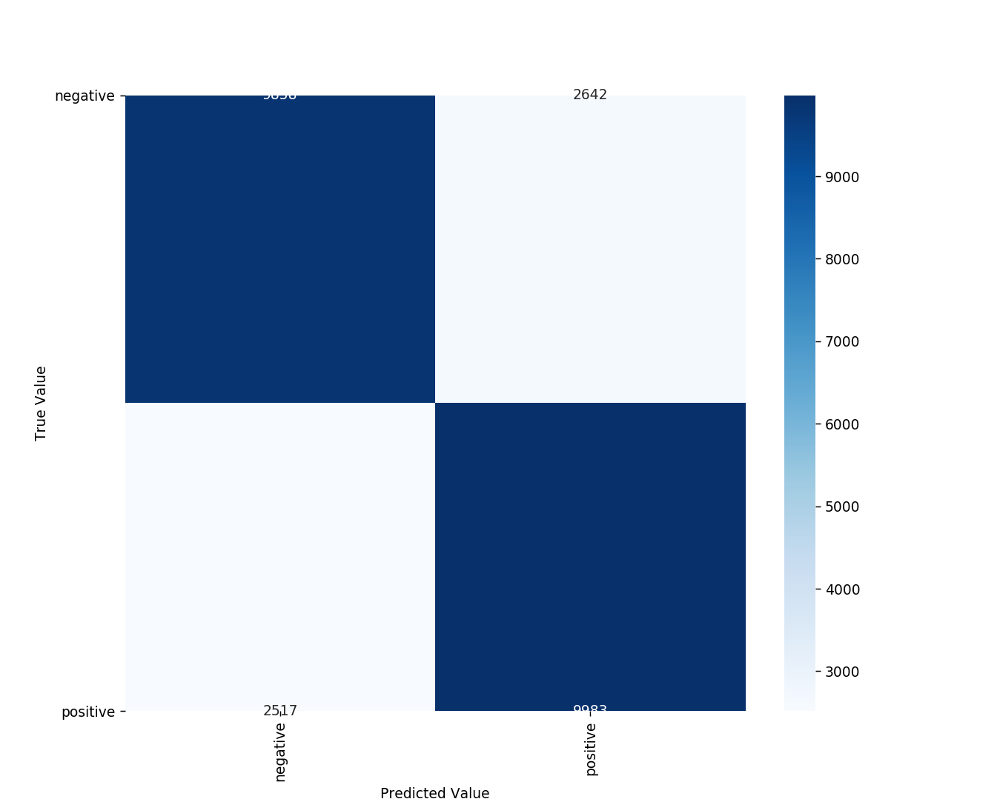

<IPython.core.display.Javascript object>


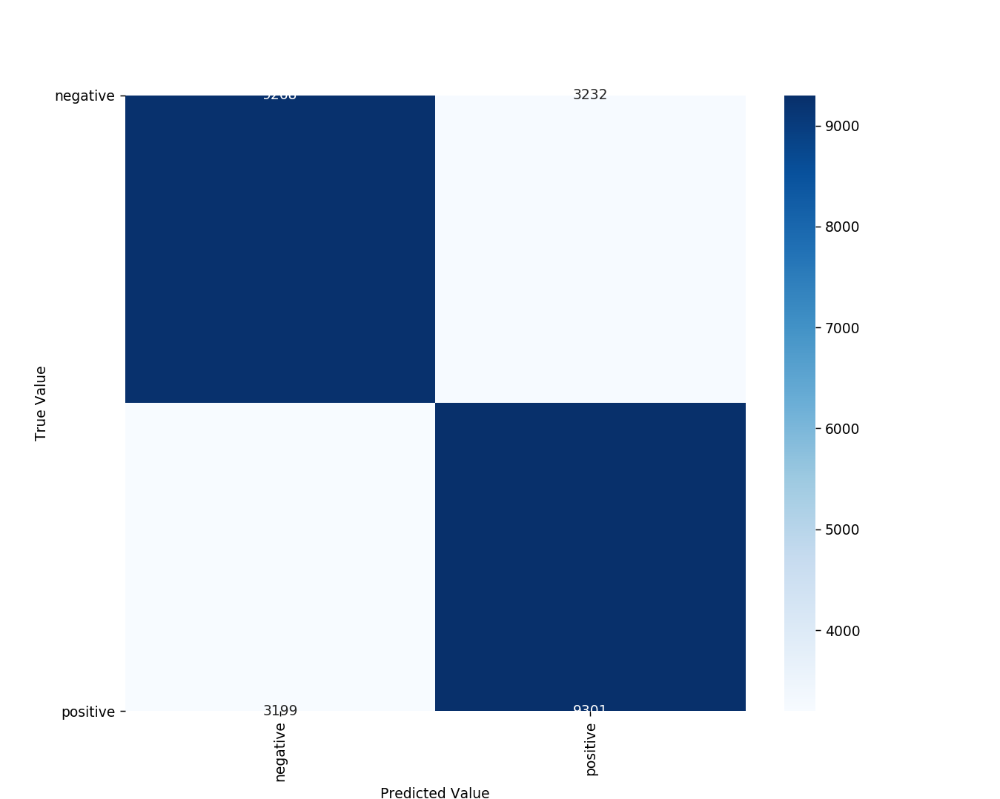

<IPython.core.display.Javascript object>


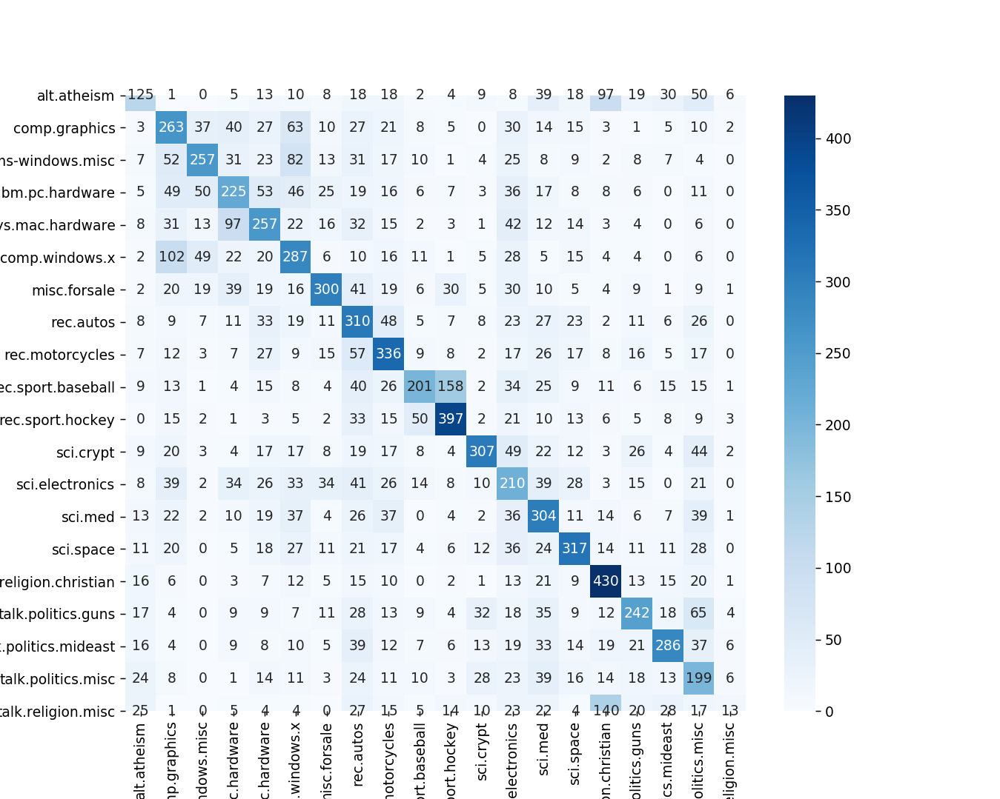

<IPython.core.display.Javascript object>


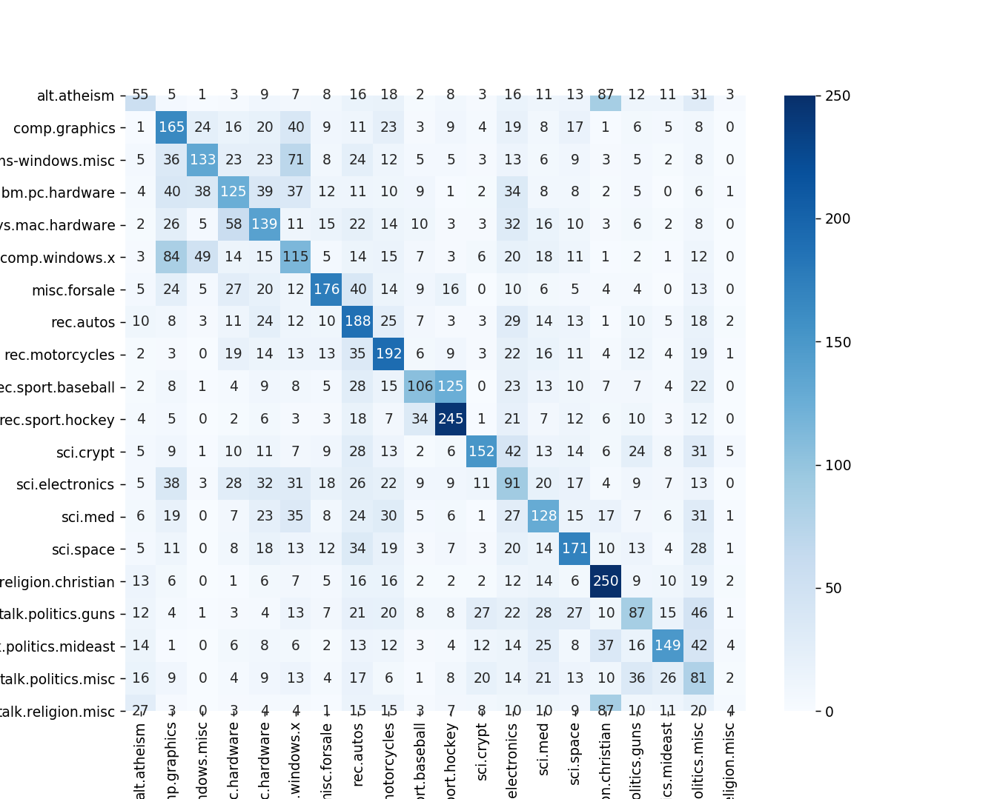

<IPython.core.display.Javascript object>


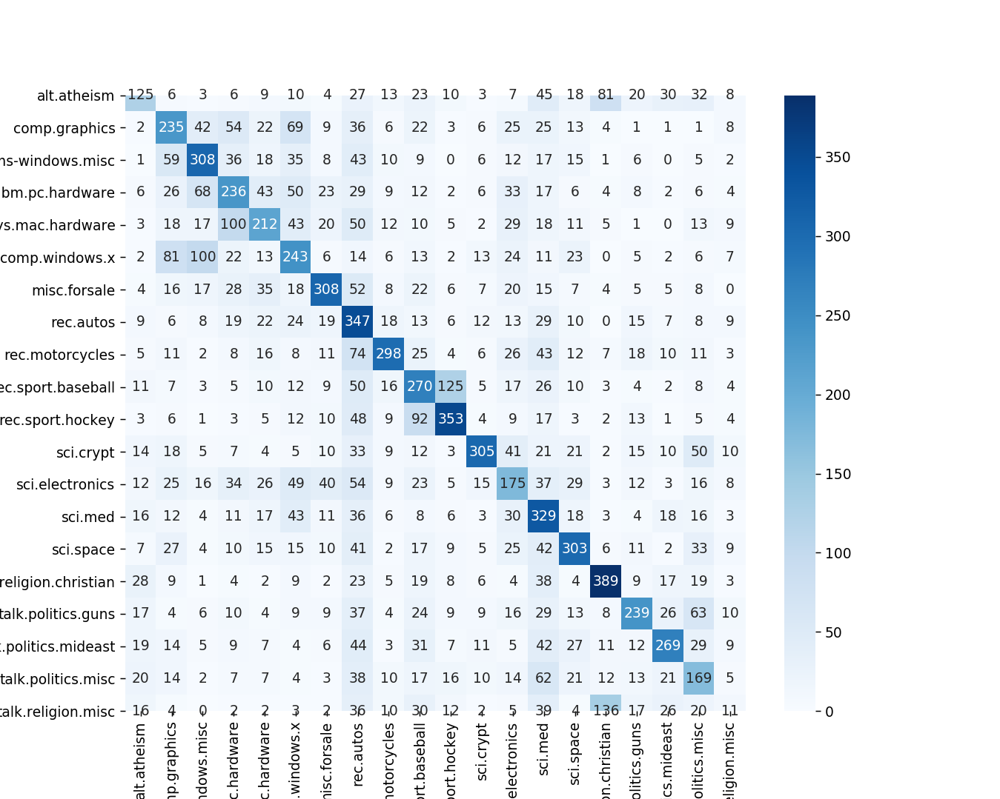

<IPython.core.display.Javascript object>


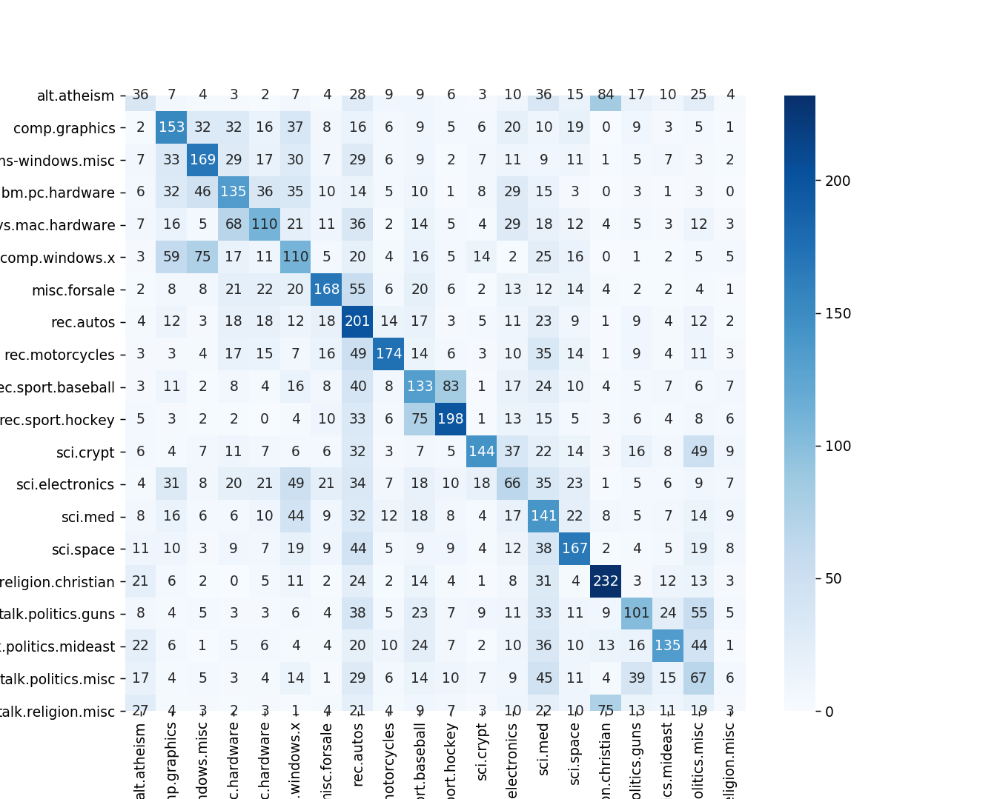

<IPython.core.display.Javascript object>


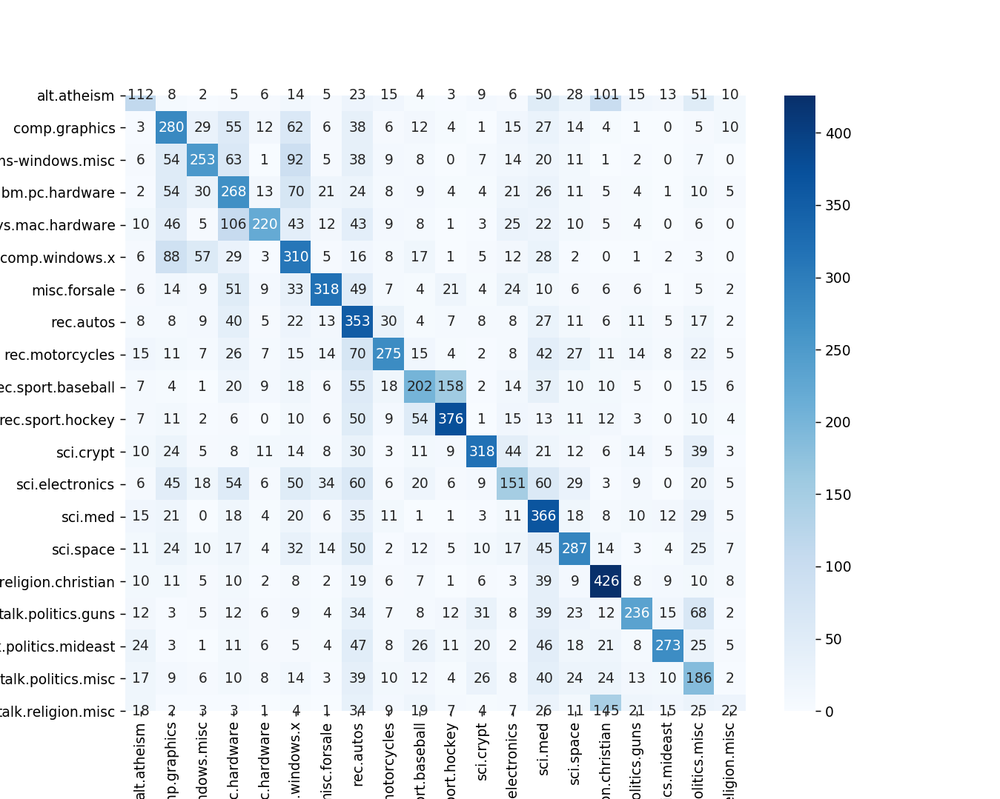

<IPython.core.display.Javascript object>


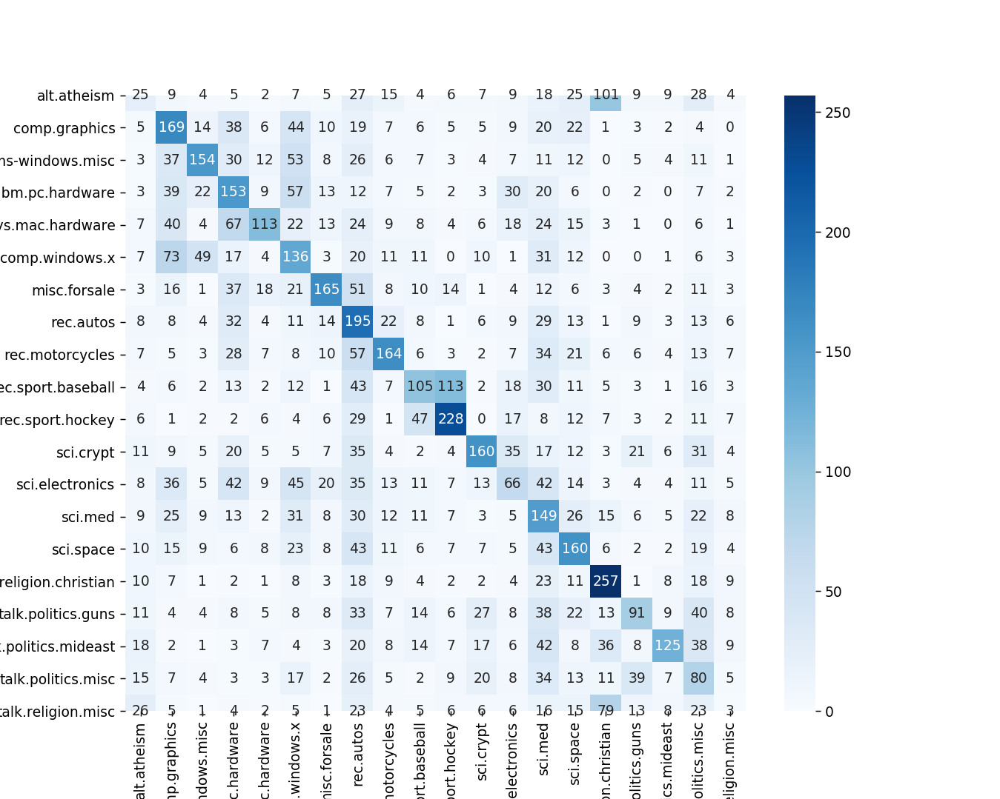

<IPython.core.display.Javascript object>


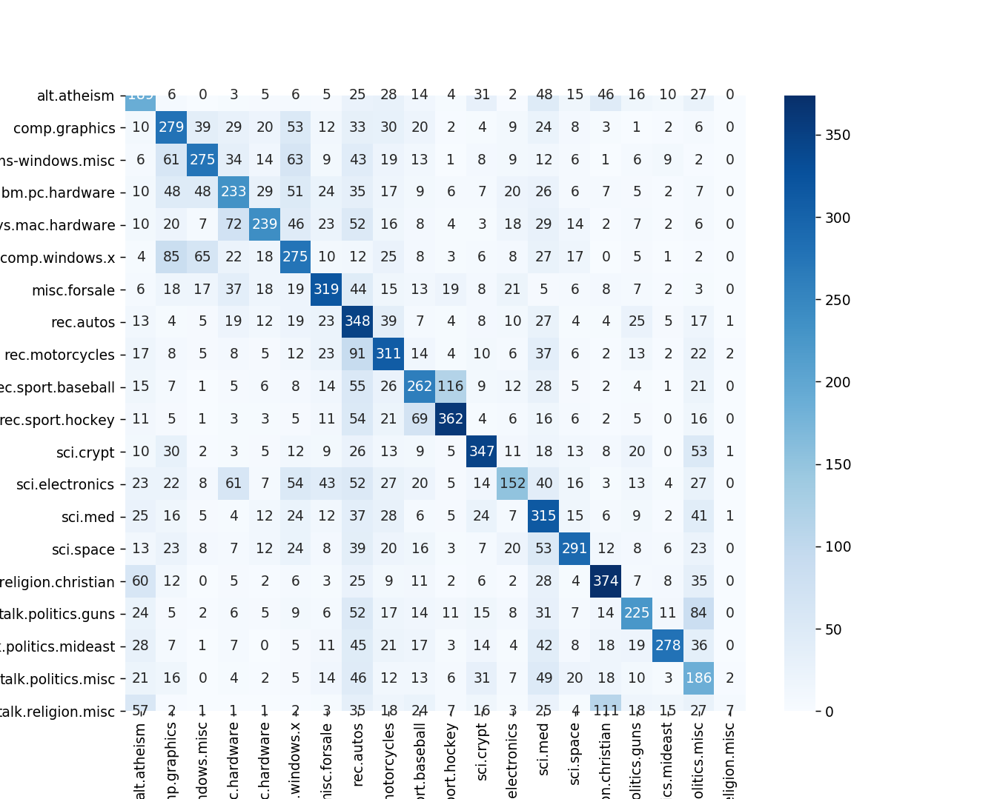

<IPython.core.display.Javascript object>


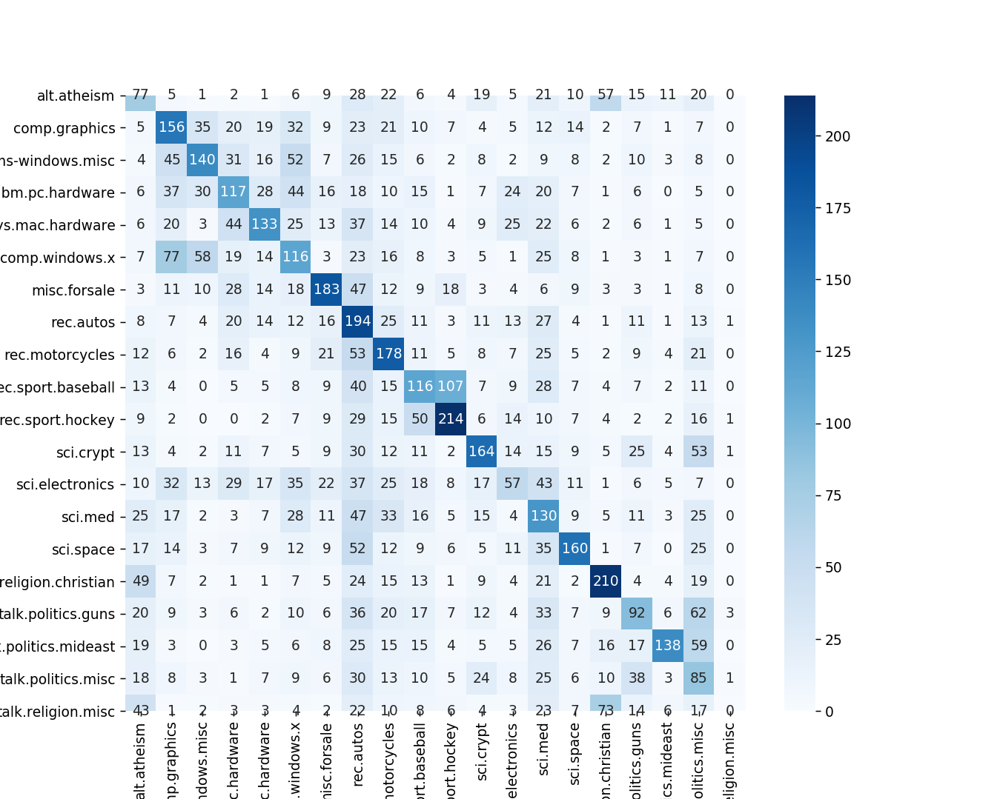

In [37]:
dec_tree_data = load_pickles('dec_tree')

In [110]:
for key, item in dec_tree.items():
    print(key + " | Test Results: " + str(item['test_results']['acc']))

movie | Test Results: 0.74596
movie_binary | Test Results: 0.74356
movie_ngrams | Test Results: 0.74788
movie_binary_ngrams | Test Results: 0.74276
news | Test Results: 0.36537440254912373
news_binary | Test Results: 0.3509028146574615
news_ngrams | Test Results: 0.3582049920339883
news_binary_ngrams | Test Results: 0.35315985130111527


In [36]:
dec_tree_data['movie_binary_ngrams']['grid'].best_params_

{'max_depth': 10000,
 'max_features': 0.4,
 'min_samples_leaf': 16,
 'min_samples_split': 256}

In [112]:
dec_tree_data['news']['grid'].best_params_

{'max_depth': 1000,
 'max_features': 0.75,
 'min_samples_leaf': 4,
 'min_samples_split': 128}

In [41]:
dec_tree = DecisionTreeClassifier(criterion='entropy',splitter='best', random_state=42)

dec_tree_param_movie = { #Params for gridsearch
    'max_depth': [250000, 500000, 750000],
    'max_features': [0.2, 0.25, 0.30],
    'min_samples_leaf': [8, 16, 24],
    'min_samples_split': [256, 320, 384]
    
}

dec_tree_grid_movie = GridSearchCV(estimator=dec_tree, param_grid=dec_tree_param_movie, n_jobs=-1,
                                cv=5, refit=True, verbose=2, return_train_score = True) #Tune Parameters


Fitting 5 folds for each of 81 candidates, totalling 405 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   23.7s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 405 out of 405 | elapsed:  6.0min finished
C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


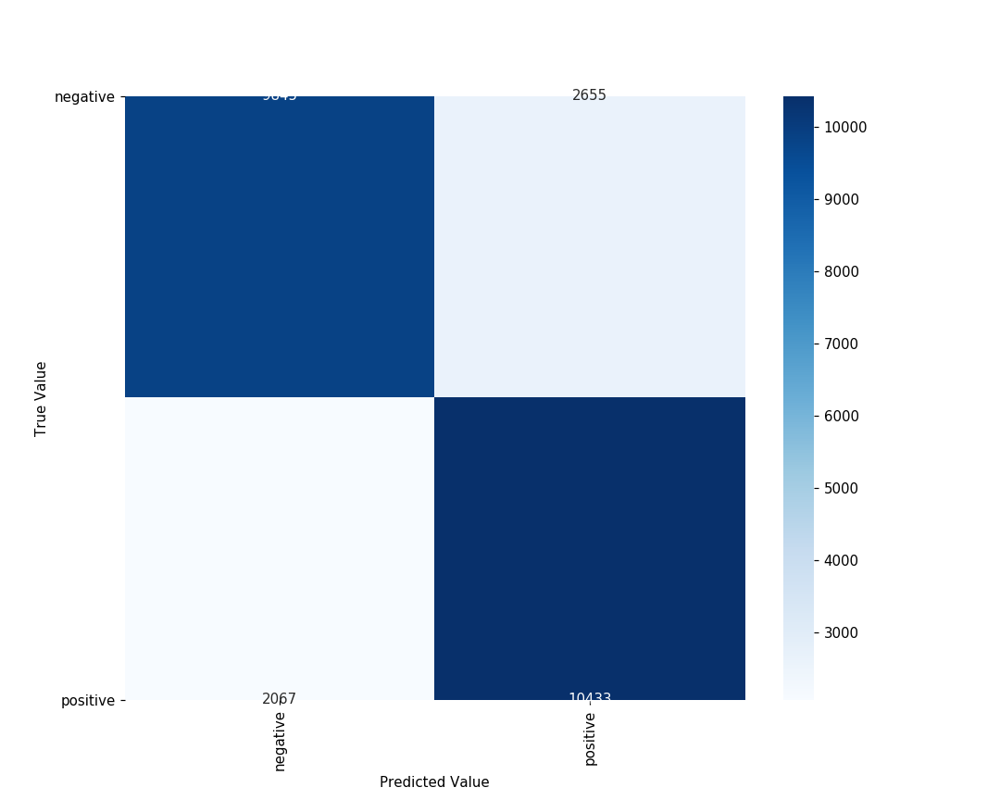

<IPython.core.display.Javascript object>


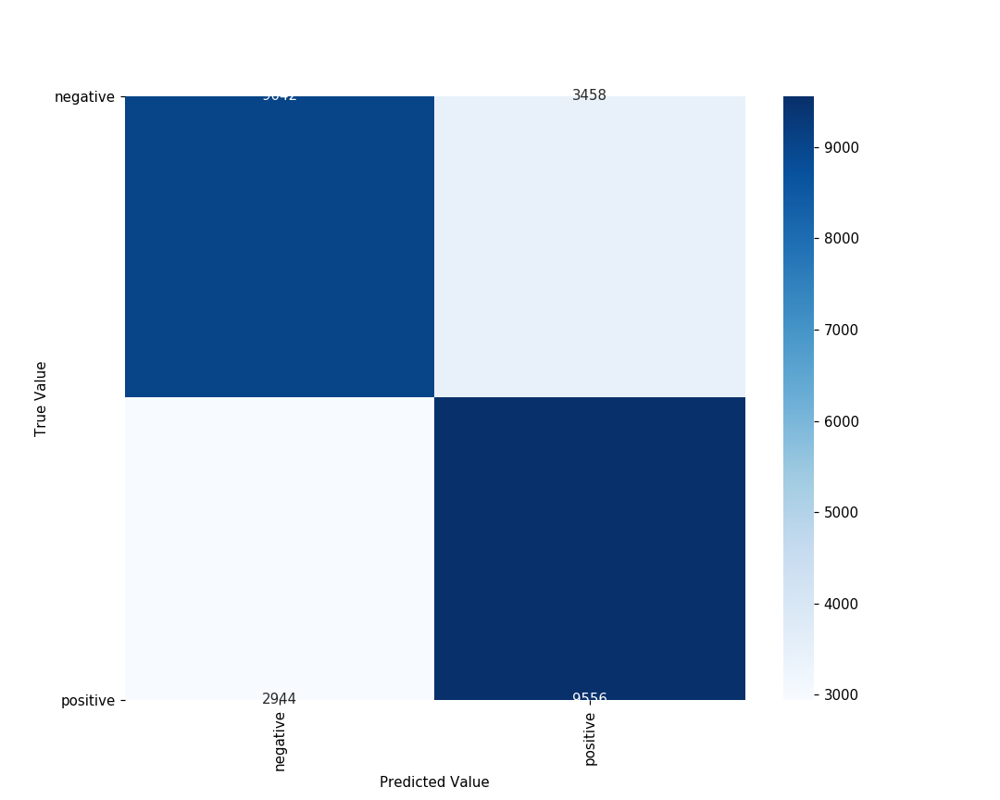

In [126]:
movie_ngrams_results_dec_tree_fine = cv_eval_save("movie_ngrams_results_dec_tree_fine.pkl", dec_tree_grid_movie, movie['movie_ngrams']['X_train'], movie['movie_ngrams']['y_train'],
             movie['movie_ngrams']['X_test'], movie['movie_ngrams']['y_test'], movie_labels,'binary')

In [127]:
movie_ngrams_results_dec_tree_fine

{'grid': GridSearchCV(cv=5, error_score=nan,
              estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                               criterion='entropy',
                                               max_depth=None, max_features=None,
                                               max_leaf_nodes=None,
                                               min_impurity_decrease=0.0,
                                               min_impurity_split=None,
                                               min_samples_leaf=1,
                                               min_samples_split=2,
                                               min_weight_fraction_leaf=0.0,
                                               presort='deprecated',
                                               random_state=42,
                                               splitter='best'),
              iid='deprecated', n_jobs=-1,
              param_grid={'max_depth': [750000, 1000000, 

In [128]:
movie_ngrams_results_dec_tree_fine['grid'].best_params_

{'max_depth': 750000,
 'max_features': 0.25,
 'min_samples_leaf': 16,
 'min_samples_split': 320}

In [46]:
dec_tree_data['movie_binary_ngrams']['grid'].best_params_

{'max_depth': 10000,
 'max_features': 0.4,
 'min_samples_leaf': 16,
 'min_samples_split': 256}

In [47]:
dec_tree = DecisionTreeClassifier(criterion='entropy',splitter='best', random_state=42)

dec_tree_param_movie = { #Params for gridsearch
    'max_depth': [10000],
    'max_features': [0.4],
    'min_samples_leaf': [16],
    'min_samples_split': [256]
    
}

dec_tree_grid_movie = GridSearchCV(estimator=dec_tree, param_grid=dec_tree_param_movie, n_jobs=-1,
                                cv=5, refit=True, verbose=2, return_train_score = True) #Tune Parameters


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    9.9s remaining:   15.0s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   10.5s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   10.5s finished
C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


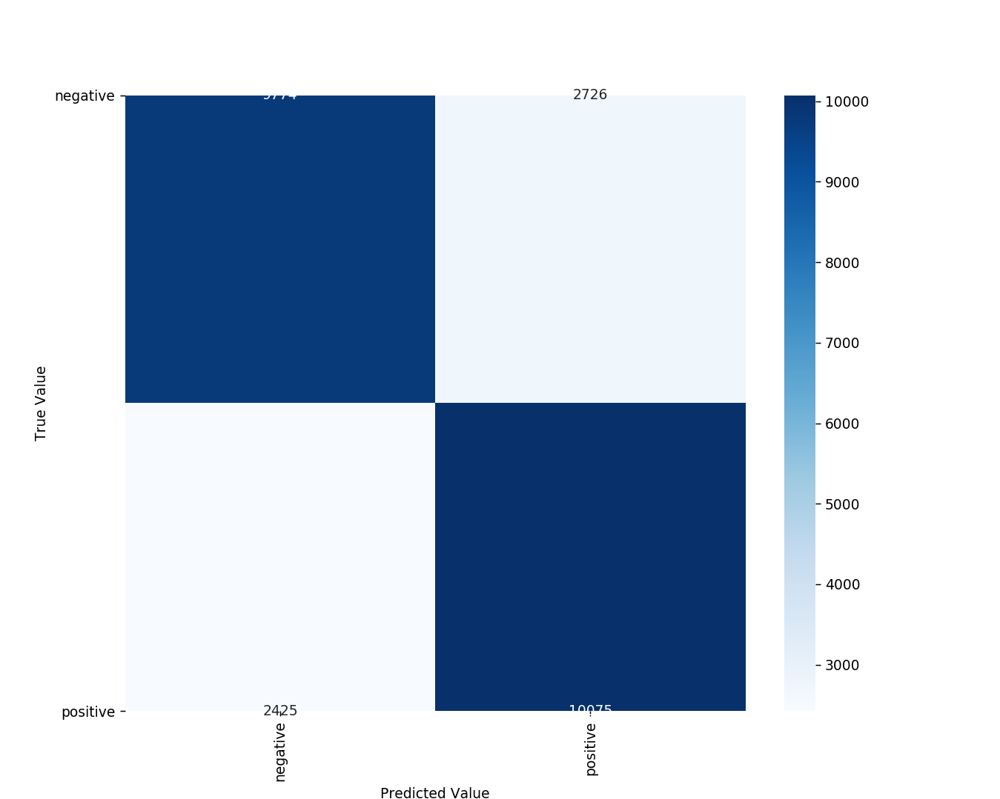

<IPython.core.display.Javascript object>


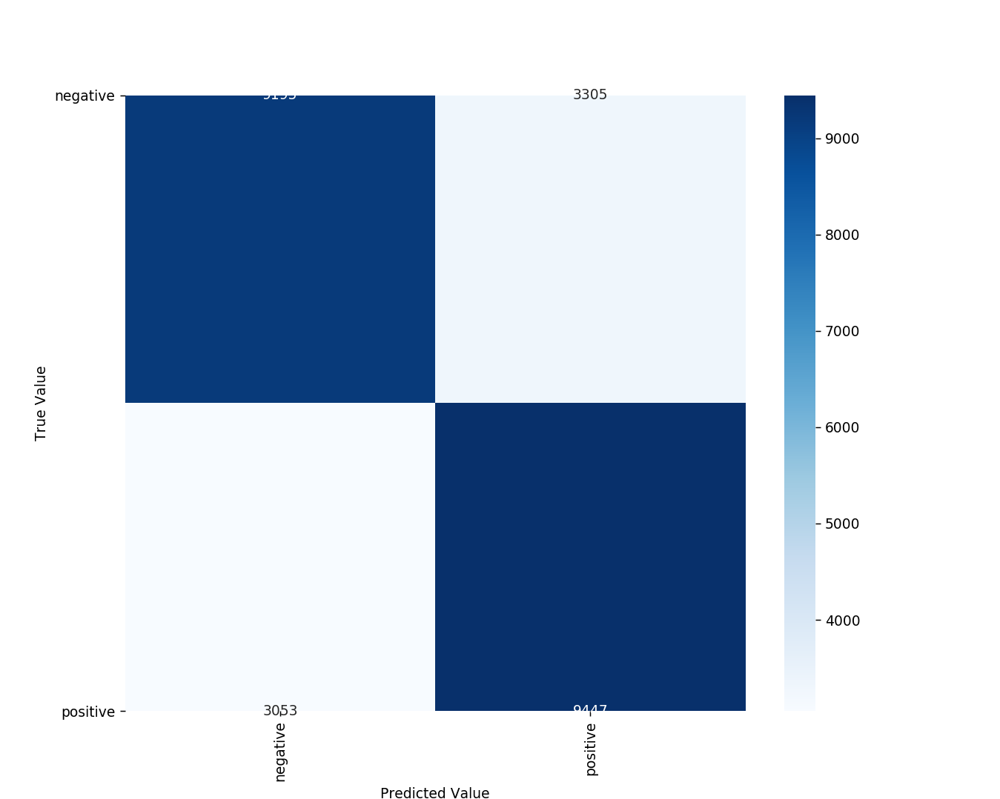

In [48]:
movie_binary_ngrams_results_dec_tree_fine = cv_eval_save("movie_binary_ngrams_results_dec_tree_fine.pkl", dec_tree_grid_movie, movie['movie_binary_ngrams']['X_train'], movie['movie_binary_ngrams']['y_train'],
             movie['movie_binary_ngrams']['X_test'], movie['movie_binary_ngrams']['y_test'], movie_labels,'binary')

In [49]:
movie_binary_ngrams_results_dec_tree_fine

{'grid': GridSearchCV(cv=5, error_score=nan,
              estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                               criterion='entropy',
                                               max_depth=None, max_features=None,
                                               max_leaf_nodes=None,
                                               min_impurity_decrease=0.0,
                                               min_impurity_split=None,
                                               min_samples_leaf=1,
                                               min_samples_split=2,
                                               min_weight_fraction_leaf=0.0,
                                               presort='deprecated',
                                               random_state=42,
                                               splitter='best'),
              iid='deprecated', n_jobs=-1,
              param_grid={'max_depth': [10000], 'max_feat

In [129]:
dec_tree_param_news = { #Params for gridsearch
    'max_depth': [500, 1000, 5000],
    'max_features': [0.65, 0.75, 0.85],
    'min_samples_leaf': [2, 4, 8],
    'min_samples_split': [64, 128, 192]
    
}

dec_tree_grid_news = GridSearchCV(estimator=dec_tree, param_grid=dec_tree_param_news, n_jobs=-1,
                                cv=5, refit=True, verbose=2, return_train_score = True) #Tune Parameters


In [133]:
news_results_dec_tree_fine = cv_eval_save("news_results_dec_tree_fine.pkl", dec_tree_grid_news, news['news']['X_train'], news['news']['y_train'],
             news['news']['X_test'], news['news']['y_test'], news_labels ,'micro')

Fitting 5 folds for each of 81 candidates, totalling 405 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   32.9s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed:  9.1min
[Parallel(n_jobs=-1)]: Done 405 out of 405 | elapsed: 10.7min finished
C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [136]:
news_results_dec_tree_fine

{'grid': GridSearchCV(cv=5, error_score=nan,
              estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                               criterion='entropy',
                                               max_depth=None, max_features=None,
                                               max_leaf_nodes=None,
                                               min_impurity_decrease=0.0,
                                               min_impurity_split=None,
                                               min_samples_leaf=1,
                                               min_samples_split=2,
                                               min_weight_fraction_leaf=0.0,
                                               presort='deprecated',
                                               random_state=42,
                                               splitter='best'),
              iid='deprecated', n_jobs=-1,
              param_grid={'max_depth': [500, 1000, 5000],

In [137]:
news_results_dec_tree_fine['grid'].best_params_

{'max_depth': 500,
 'max_features': 0.65,
 'min_samples_leaf': 2,
 'min_samples_split': 128}

In [39]:
dec_tree_data['news_binary_ngrams']['grid'].best_params_

{'max_depth': 10000,
 'max_features': 0.75,
 'min_samples_leaf': 4,
 'min_samples_split': 128}

In [42]:
dec_tree_param_news = { #Params for gridsearch
    'max_depth': [10000],
    'max_features': [0.75],
    'min_samples_leaf': [4],
    'min_samples_split': [128]
    
}

dec_tree_grid_news = GridSearchCV(estimator=dec_tree, param_grid=dec_tree_param_news, n_jobs=-1,
                                cv=5, refit=True, verbose=2, return_train_score = True) #Tune Parameters


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   11.8s remaining:   17.8s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   12.4s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   12.4s finished
C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


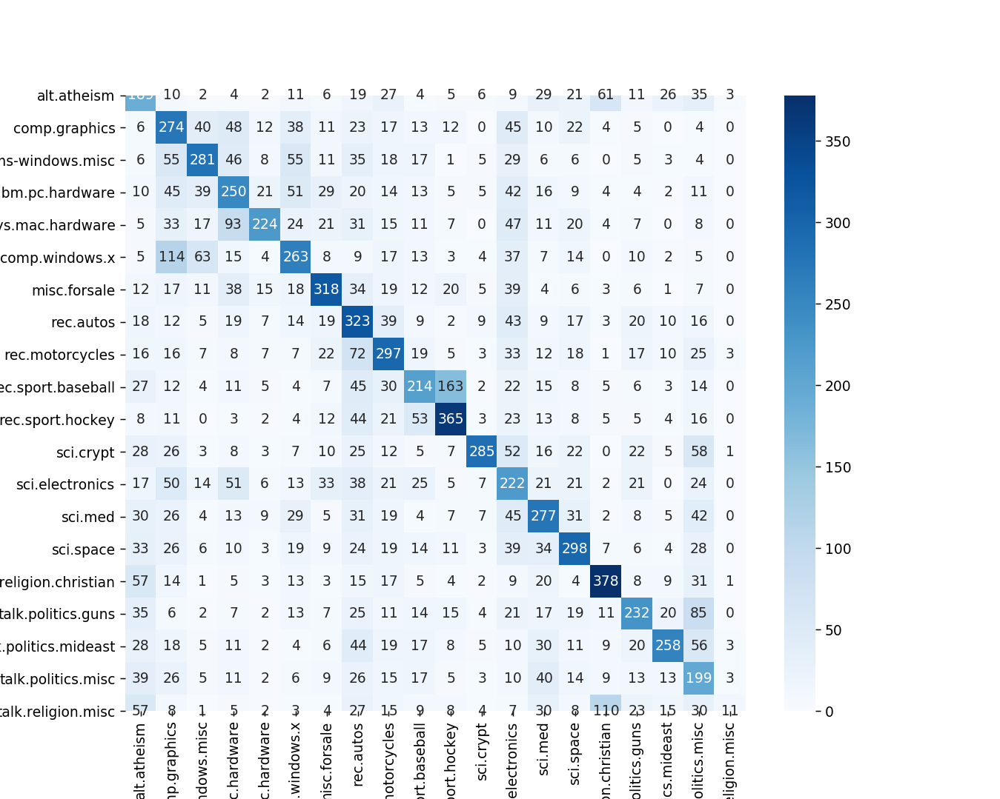

<IPython.core.display.Javascript object>


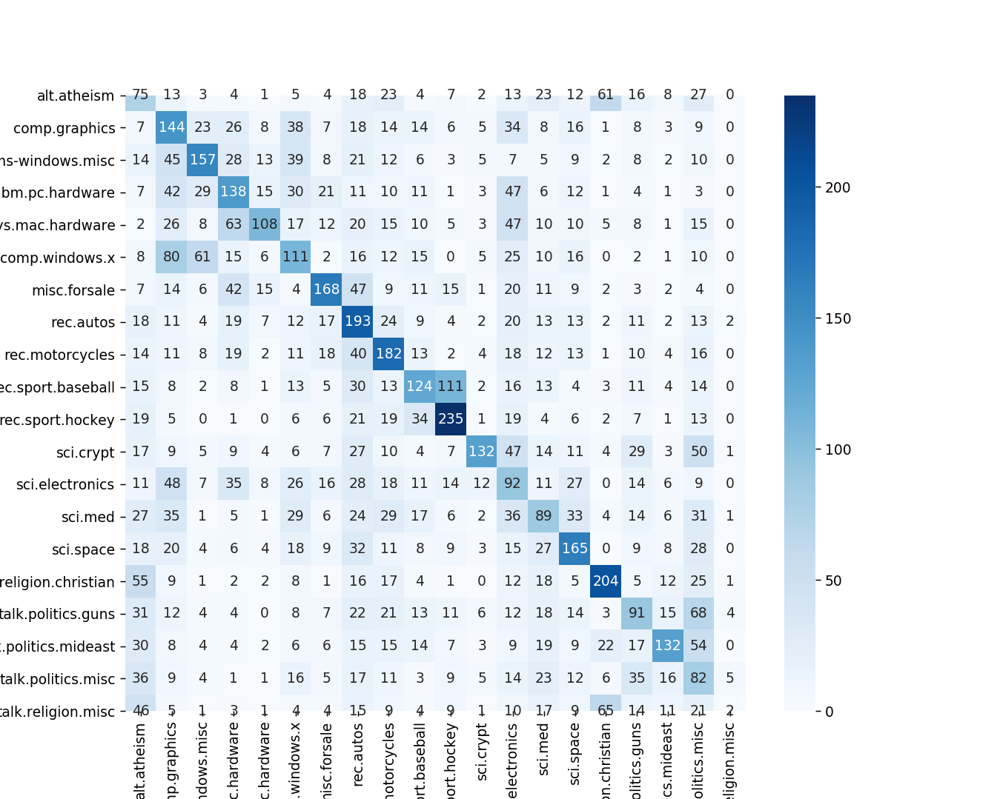

In [43]:
news_binary_ngrams_results_dec_tree_fine = cv_eval_save("news_binary_ngrams_results_dec_tree_fine.pkl", dec_tree_grid_news, news['news_binary_ngrams']['X_train'], news['news_binary_ngrams']['y_train'],
             news['news_binary_ngrams']['X_test'], news['news_binary_ngrams']['y_test'], news_labels ,'micro')

In [44]:
news_binary_ngrams_results_dec_tree_fine

{'grid': GridSearchCV(cv=5, error_score=nan,
              estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                               criterion='entropy',
                                               max_depth=None, max_features=None,
                                               max_leaf_nodes=None,
                                               min_impurity_decrease=0.0,
                                               min_impurity_split=None,
                                               min_samples_leaf=1,
                                               min_samples_split=2,
                                               min_weight_fraction_leaf=0.0,
                                               presort='deprecated',
                                               random_state=42,
                                               splitter='best'),
              iid='deprecated', n_jobs=-1,
              param_grid={'max_depth': [10000], 'max_feat

# Adaboost

C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This figure was saved with matplotlib version 3.1.3 and is unlikely to function correctly.
  after removing the cwd from sys.path.


<IPython.core.display.Javascript object>


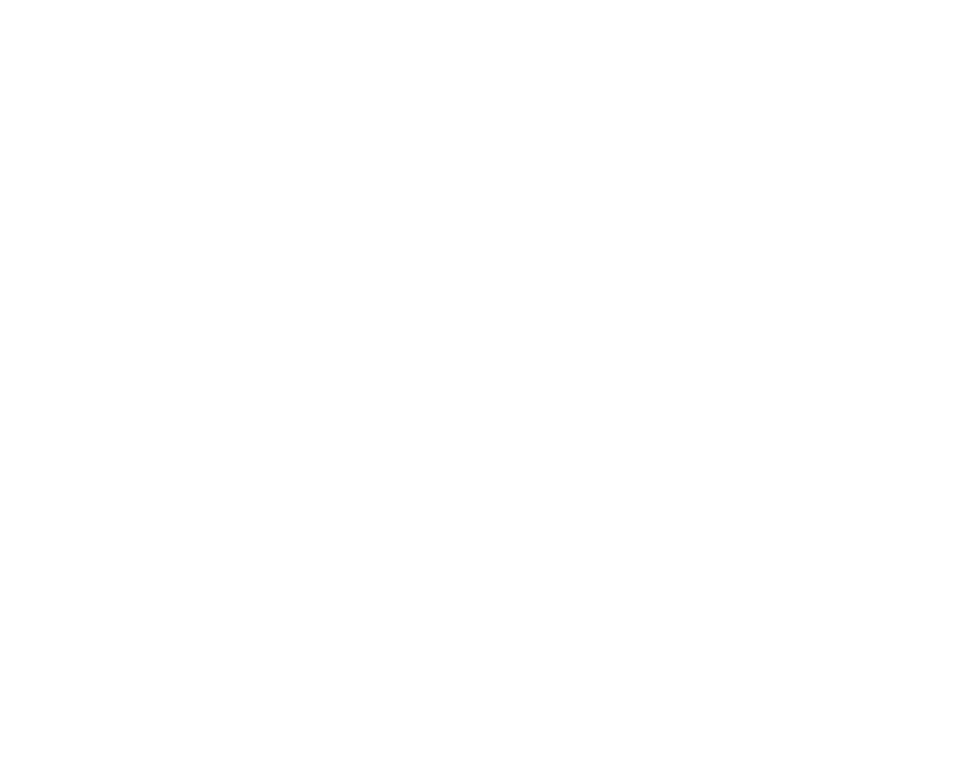

<IPython.core.display.Javascript object>


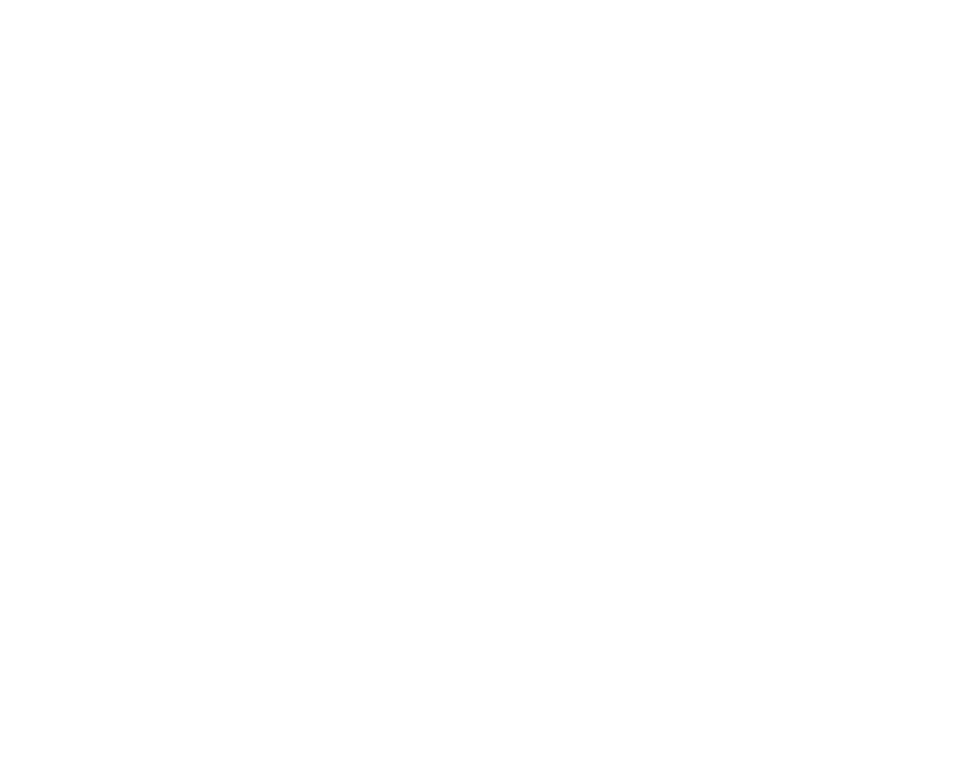

C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:5: UserWarning: This figure was saved with matplotlib version 3.1.3 and is unlikely to function correctly.
  """


<IPython.core.display.Javascript object>


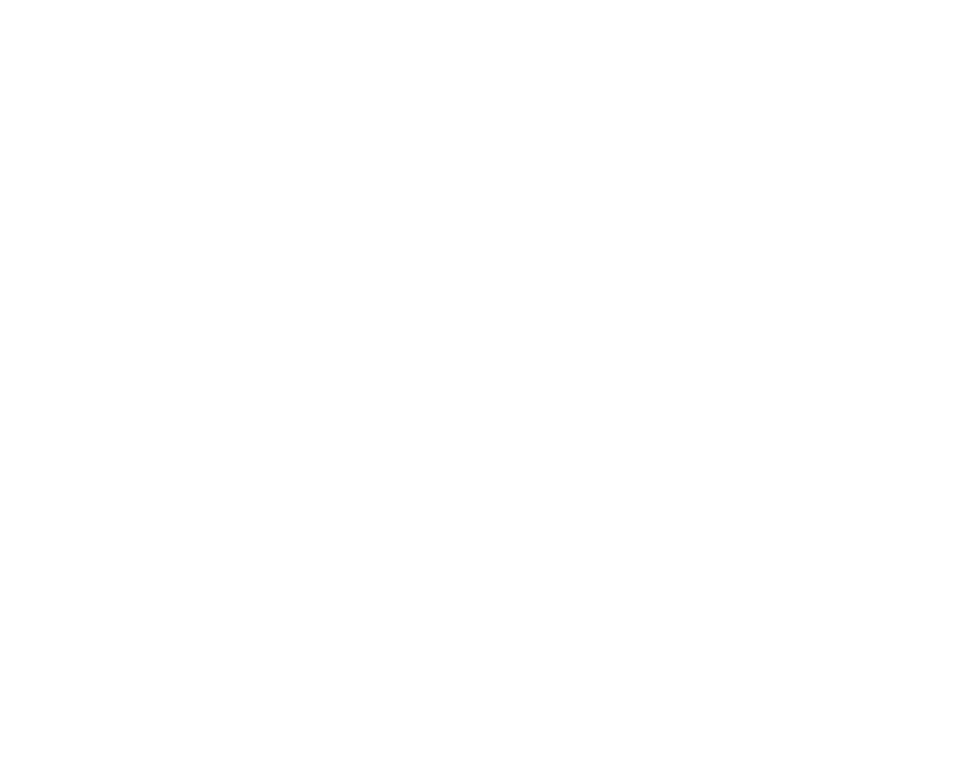

<IPython.core.display.Javascript object>


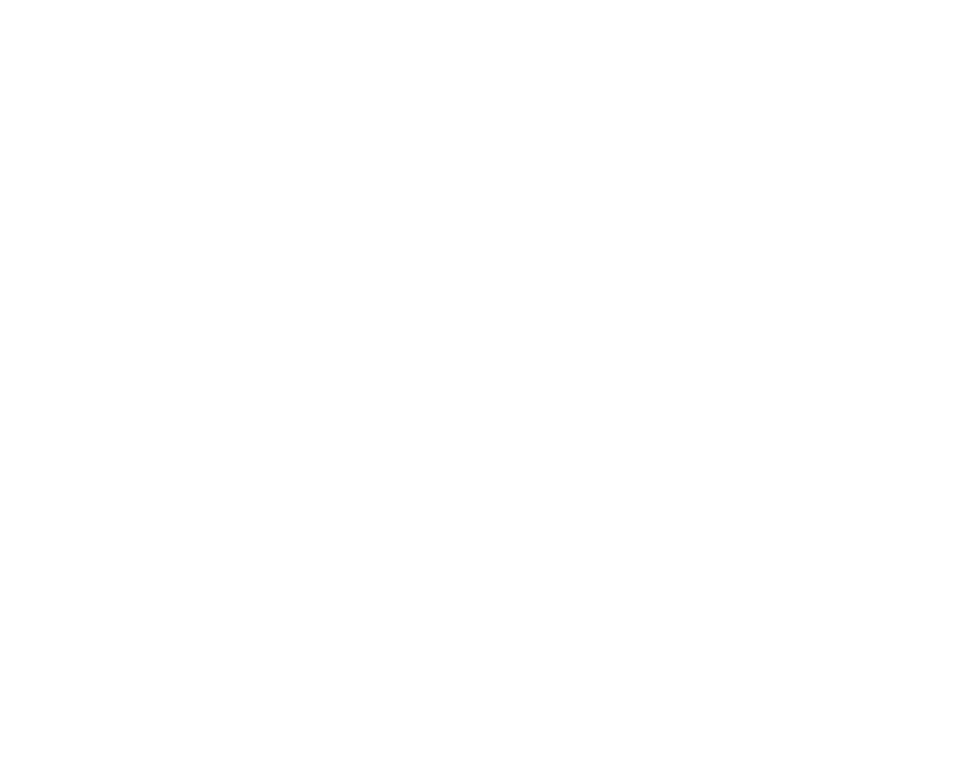

C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This figure was saved with matplotlib version 3.1.3 and is unlikely to function correctly.
  


<IPython.core.display.Javascript object>


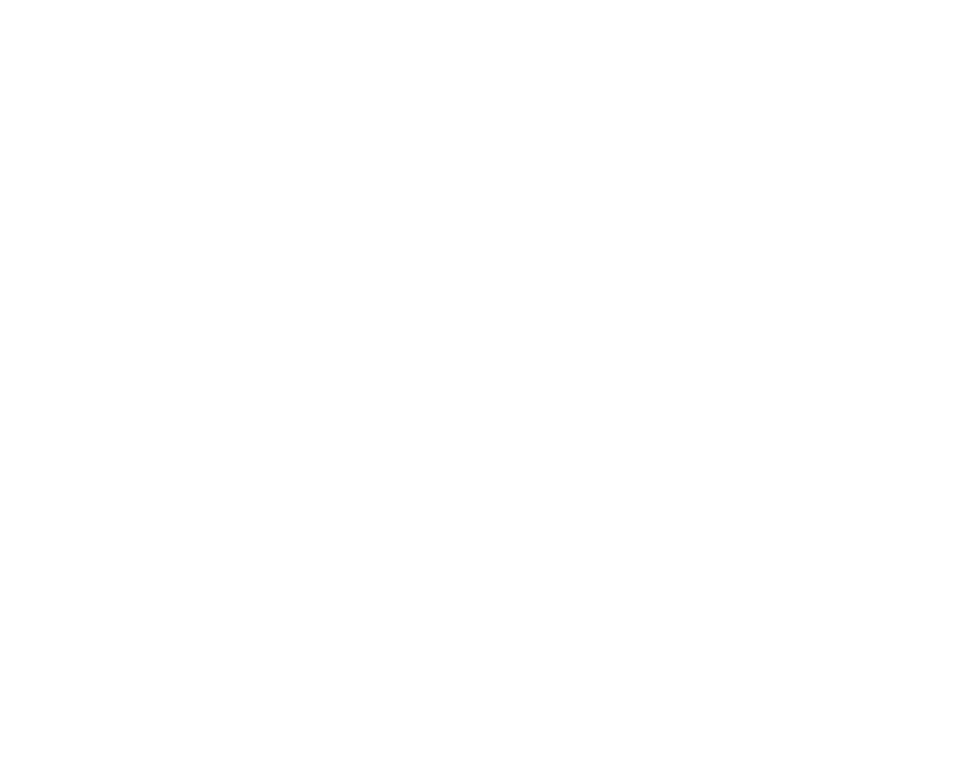

<IPython.core.display.Javascript object>


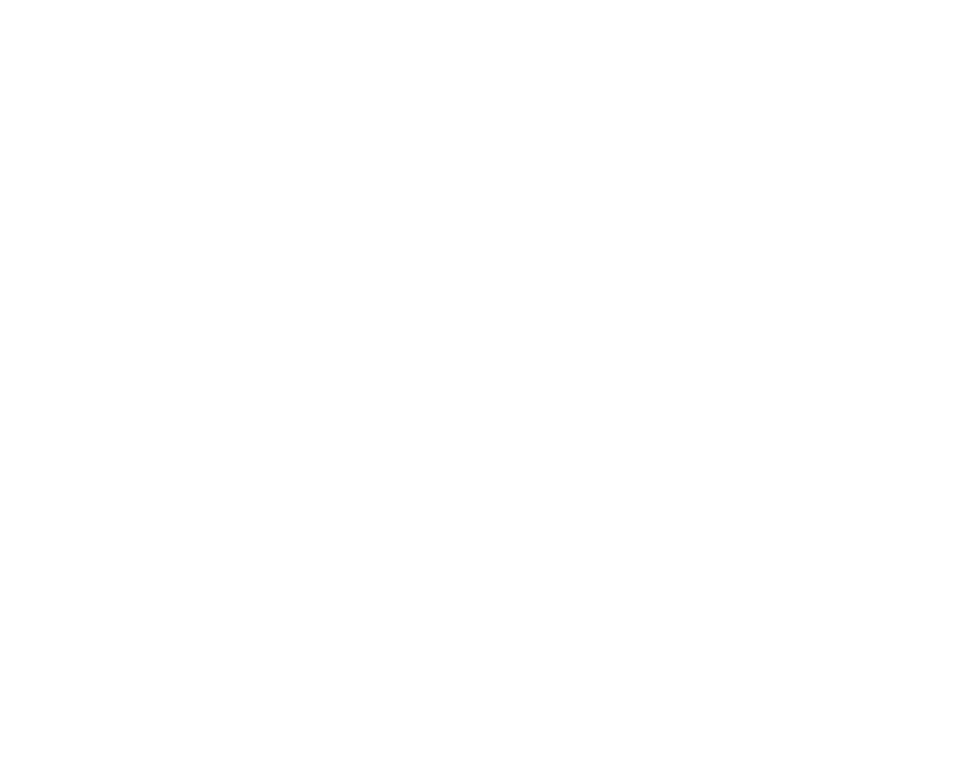

C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:7: UserWarning: This figure was saved with matplotlib version 3.1.3 and is unlikely to function correctly.
  import sys


<IPython.core.display.Javascript object>


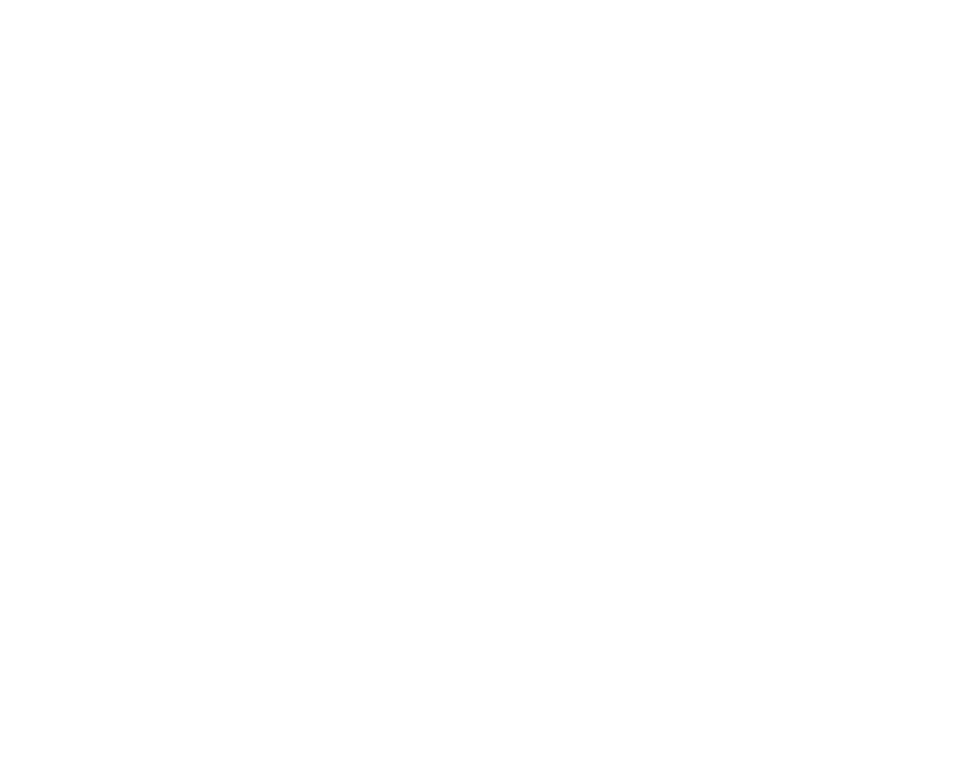

<IPython.core.display.Javascript object>


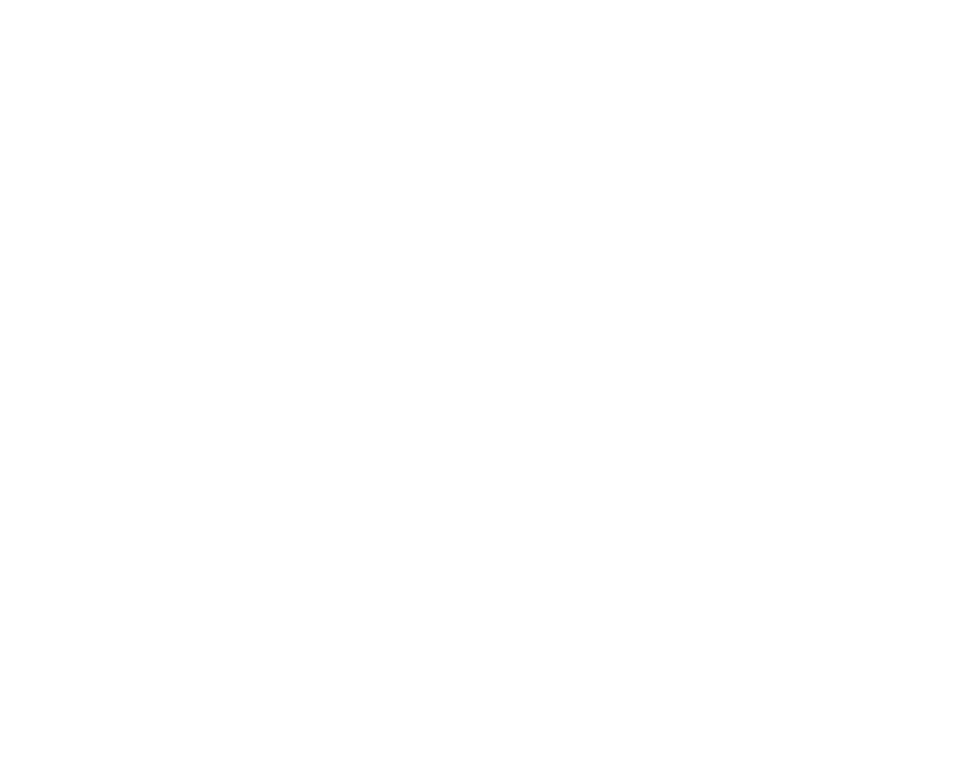

C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:9: UserWarning: This figure was saved with matplotlib version 3.1.3 and is unlikely to function correctly.
  if __name__ == '__main__':


<IPython.core.display.Javascript object>


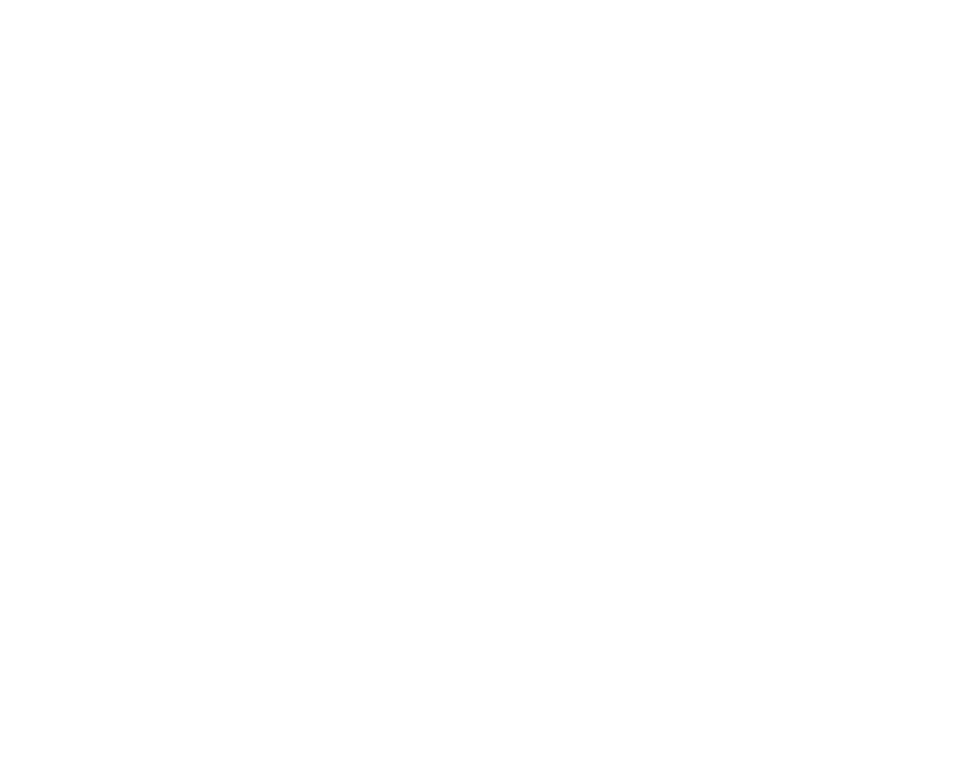

<IPython.core.display.Javascript object>


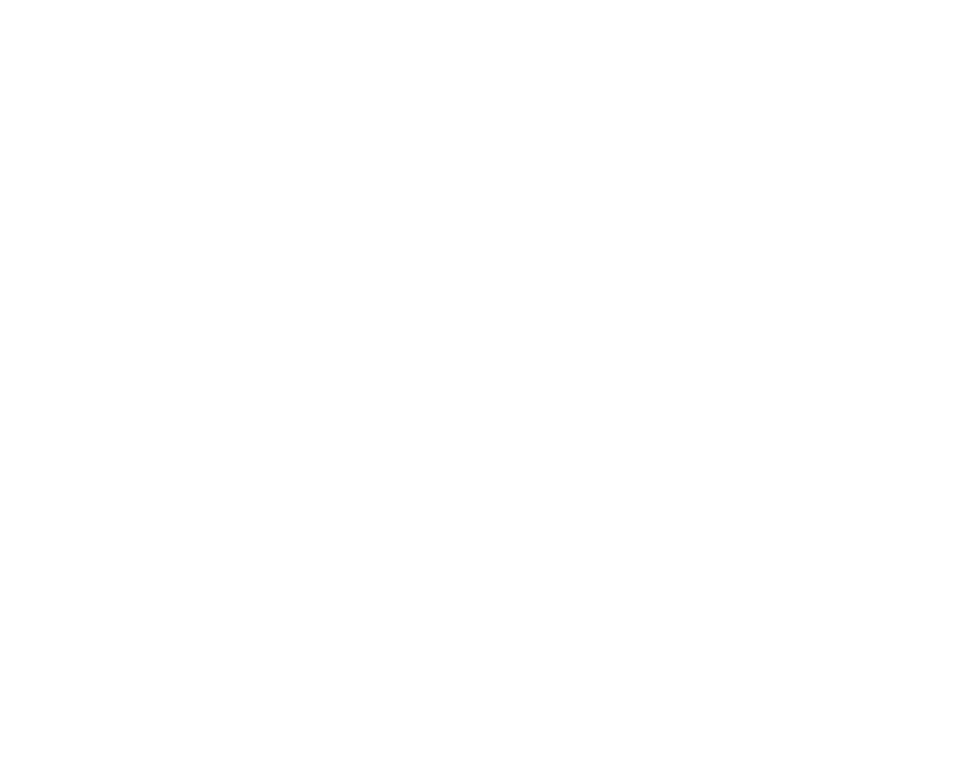

C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:10: UserWarning: This figure was saved with matplotlib version 3.1.3 and is unlikely to function correctly.
  # Remove the CWD from sys.path while we load stuff.


<IPython.core.display.Javascript object>


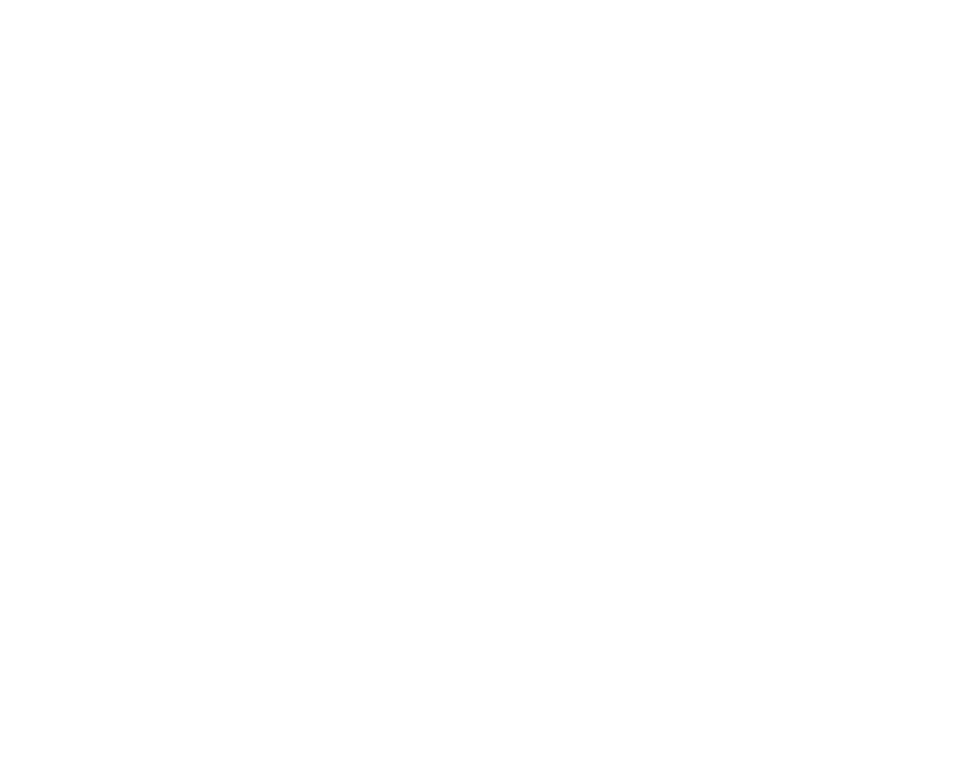

<IPython.core.display.Javascript object>


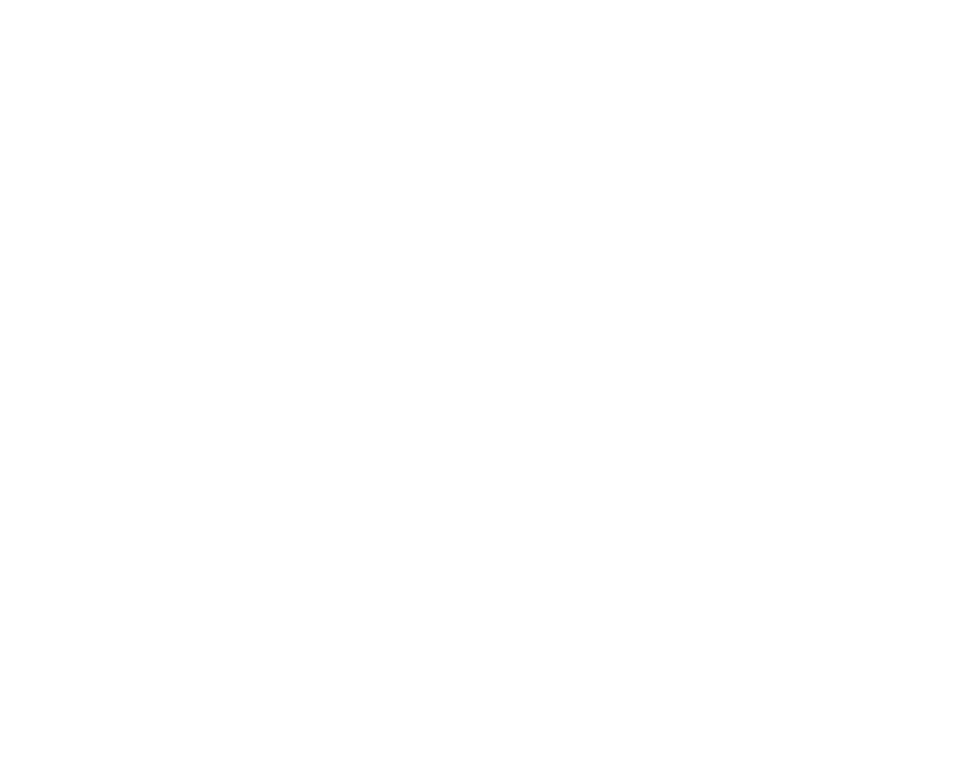

C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:11: UserWarning: This figure was saved with matplotlib version 3.1.3 and is unlikely to function correctly.
  # This is added back by InteractiveShellApp.init_path()


<IPython.core.display.Javascript object>


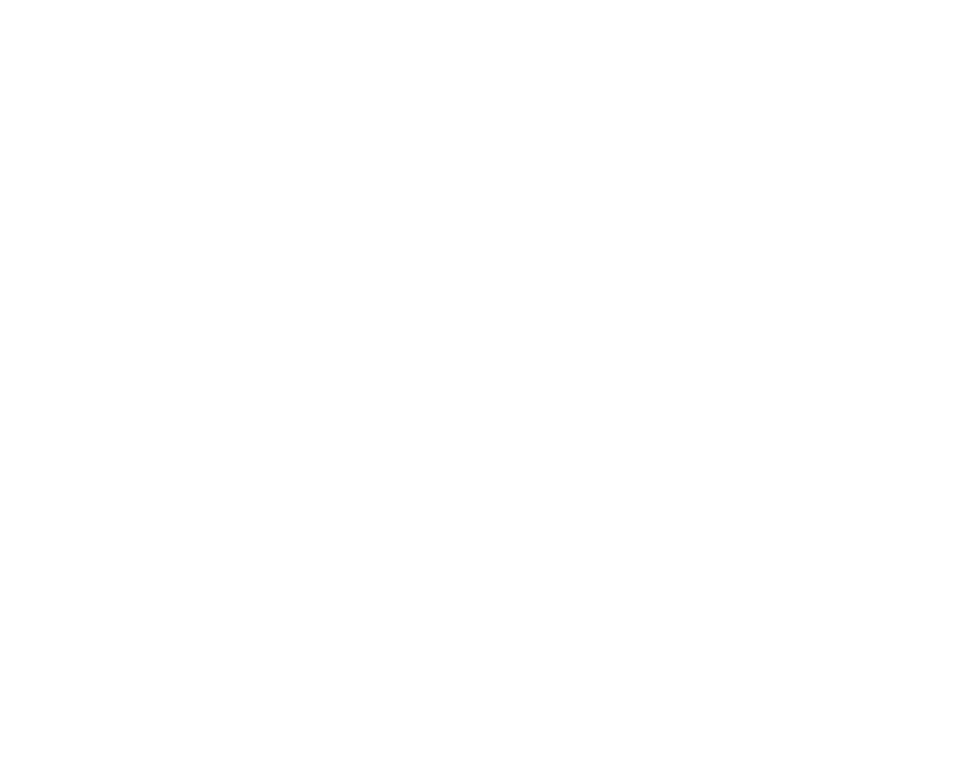

<IPython.core.display.Javascript object>


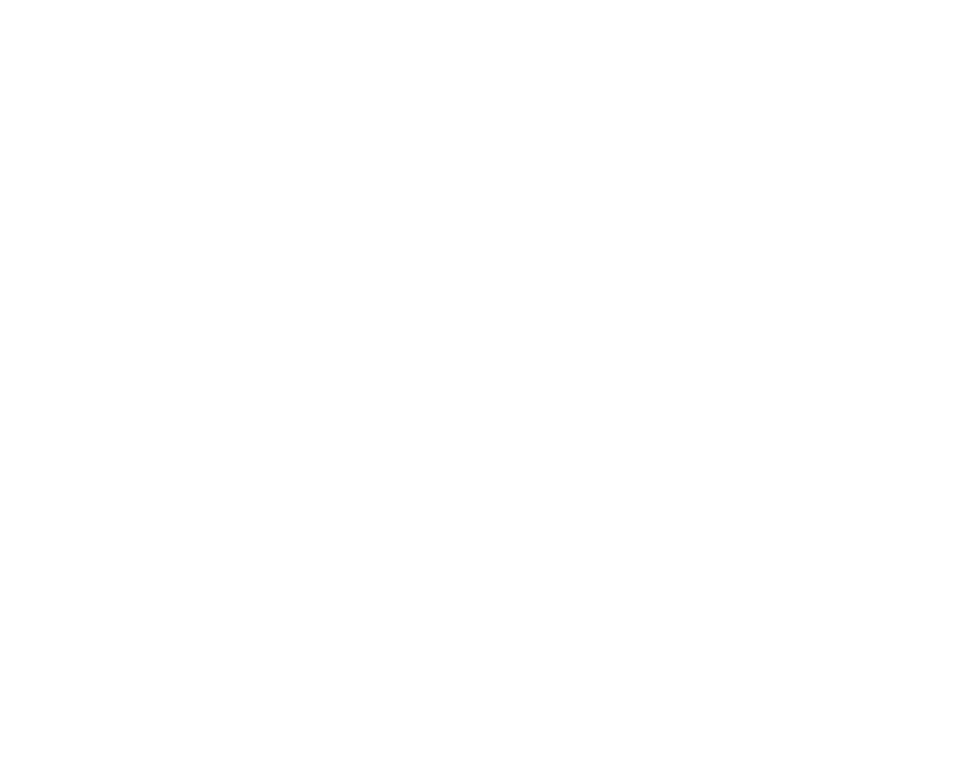

C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:12: UserWarning: This figure was saved with matplotlib version 3.1.3 and is unlikely to function correctly.
  if sys.path[0] == '':


<IPython.core.display.Javascript object>


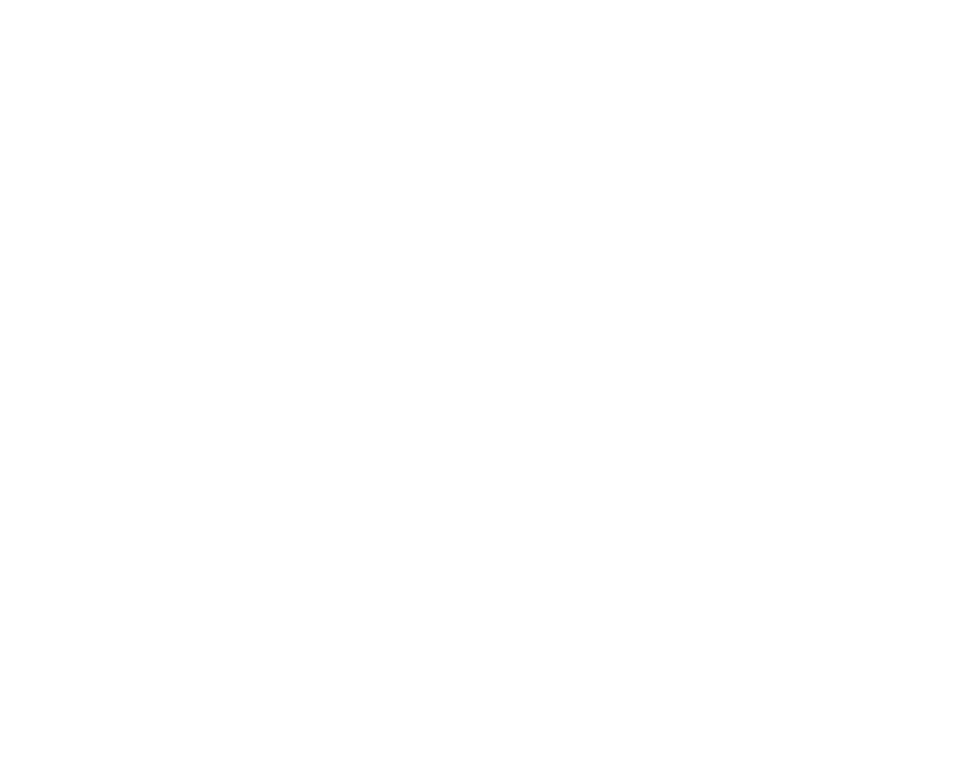

<IPython.core.display.Javascript object>


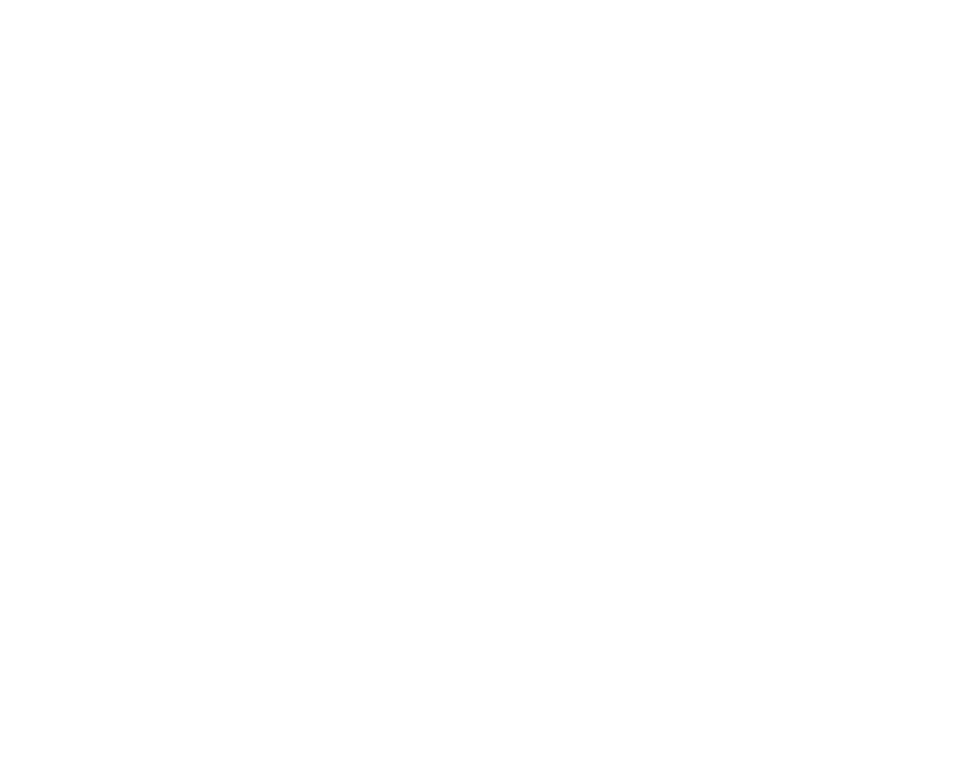

In [73]:
ada_data = load_pickles("ada")

In [74]:
for key, item in ada_data.items():
    print(key + " | Test Results: " + str(item['test_results']['acc']))

movie | Test Results: 0.80584
movie_binary | Test Results: 0.8084
movie_ngrams | Test Results: 0.80928
movie_binary_ngrams | Test Results: 0.8074
news | Test Results: 0.377854487519915
news_binary | Test Results: 0.3847583643122677
news_ngrams | Test Results: 0.38728093467870417
news_binary_ngrams | Test Results: 0.3777217206585236


In [8]:
ada_data['movie_ngrams']['grid'].best_params_

{'learning_rate': 1, 'n_estimators': 50}

In [9]:
ada_data['news_ngrams']['grid'].best_params_

{'learning_rate': 1, 'n_estimators': 50}

In [75]:
ada = AdaBoostClassifier(base_estimator= None, algorithm= 'SAMME.R', random_state=42)

ada_param_movie = { #Params for gridsearch
    'n_estimators': [100, 1000],
    'learning_rate': [0.1, 1]
}

ada_grid_movie = GridSearchCV(estimator=ada, param_grid=ada_param_movie, n_jobs=-1,
                                cv=2, refit=True, verbose=2, return_train_score = True) #Tune Parameters


Fitting 2 folds for each of 4 candidates, totalling 8 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   8 | elapsed:  1.7min remaining:  2.8min
[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed: 13.2min remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed: 13.2min finished
C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\sklearn\utils\validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


<IPython.core.display.Javascript object>


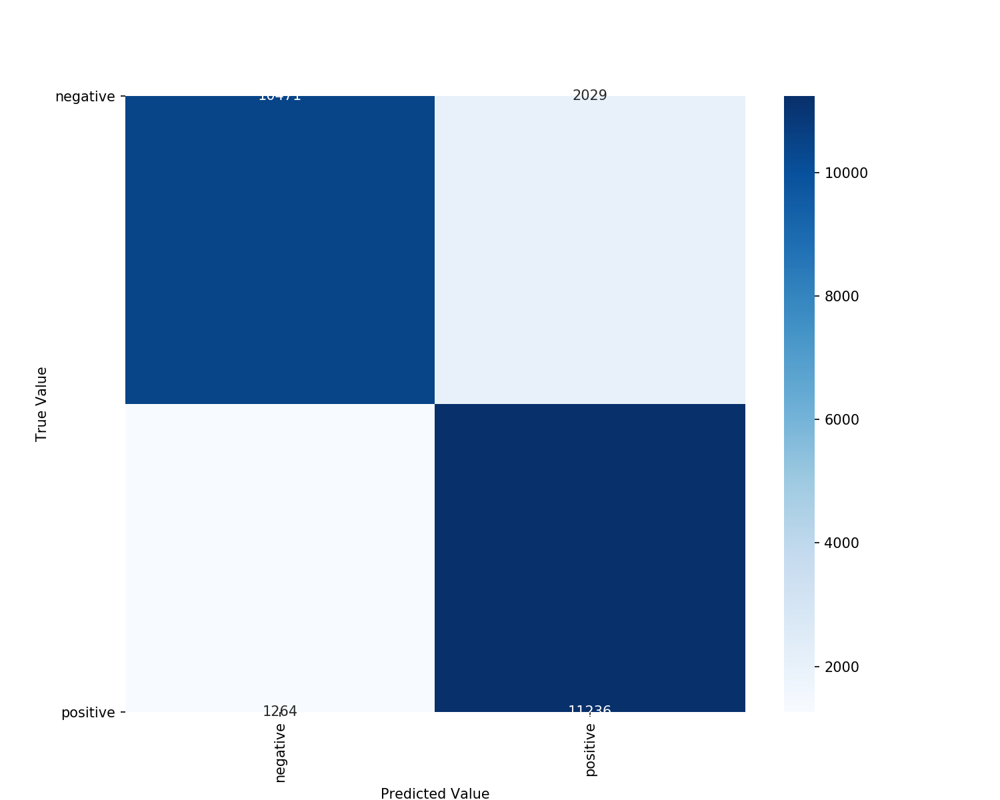

<IPython.core.display.Javascript object>


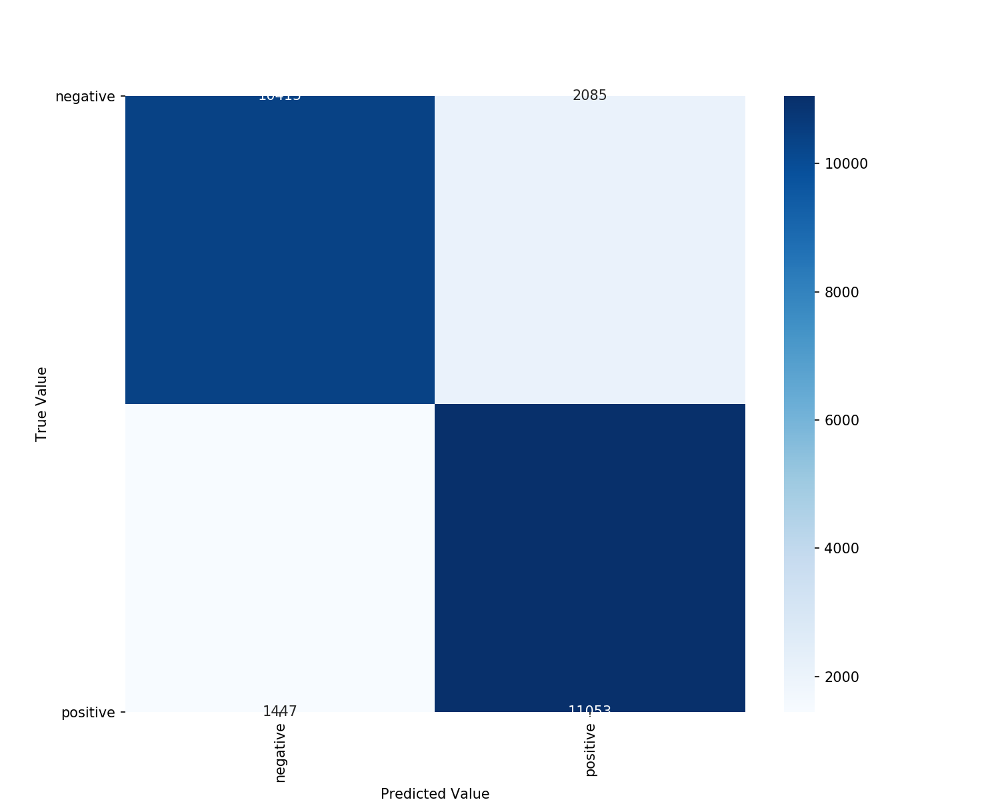

In [11]:
movie_binary_ngrams_results_ada_fine = cv_eval_save("movie_binary_ngrams_results_ada_fine.pkl", ada_grid_movie, movie['movie_binary_ngrams']['X_train'], movie['movie_binary_ngrams']['y_train'],
             movie['movie_binary_ngrams']['X_test'], movie['movie_binary_ngrams']['y_test'], movie_labels,'binary')

In [12]:
movie_binary_ngrams_results_ada_fine

{'grid': GridSearchCV(cv=2, error_score=nan,
              estimator=AdaBoostClassifier(algorithm='SAMME.R',
                                           base_estimator=None,
                                           learning_rate=1.0, n_estimators=50,
                                           random_state=42),
              iid='deprecated', n_jobs=-1,
              param_grid={'learning_rate': [0.1, 1],
                          'n_estimators': [100, 1000]},
              pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
              scoring=None, verbose=2),
 'val_acc': 0.8515600000000001,
 'val_std': 0.0022800000000000042,
 'train_acc': 0.87792,
 'train_std': 0.0010399999999999854,
 'train_results': {'acc': 0.86828,
  'f1': 0.8721909567242383,
  'conf_matrix': array([[10471,  2029],
         [ 1264, 11236]], dtype=int64),
  'conf_matrix_plot': <Figure size 1000x800 with 2 Axes>},
 'test_results': {'acc': 0.85872,
  'f1': 0.8622357438177705,
  'conf_matrix': array([[104

In [13]:
movie_binary_ngrams_results_ada_fine['grid'].best_params_

{'learning_rate': 0.1, 'n_estimators': 1000}

In [14]:
ada_param_news = { #Params for gridsearch
    'n_estimators': [100, 1000],
    'learning_rate': [0.1, 1]
}

ada_grid_news = GridSearchCV(estimator=ada, param_grid=ada_param_news, n_jobs=-1,
                                cv=2, refit=True, verbose=2, return_train_score = True) #Tune Parameters


Fitting 2 folds for each of 4 candidates, totalling 8 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   8 | elapsed:   27.9s remaining:   46.6s
[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:  3.4min remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:  3.4min finished
C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\sklearn\utils\validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


<IPython.core.display.Javascript object>


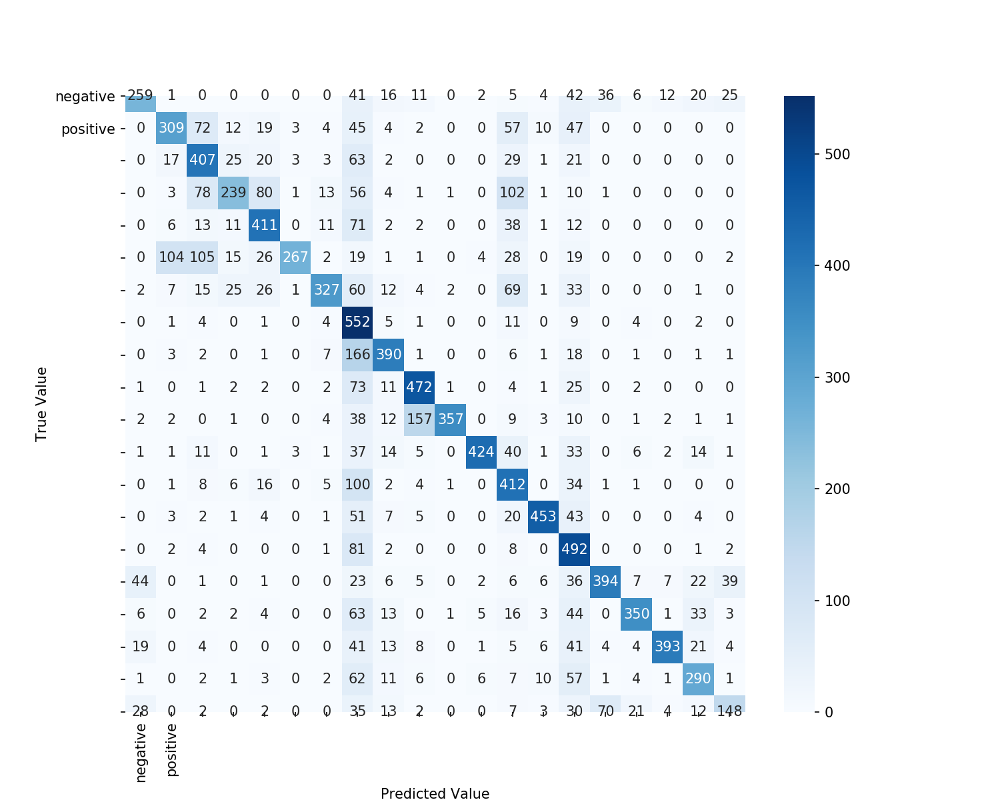

<IPython.core.display.Javascript object>


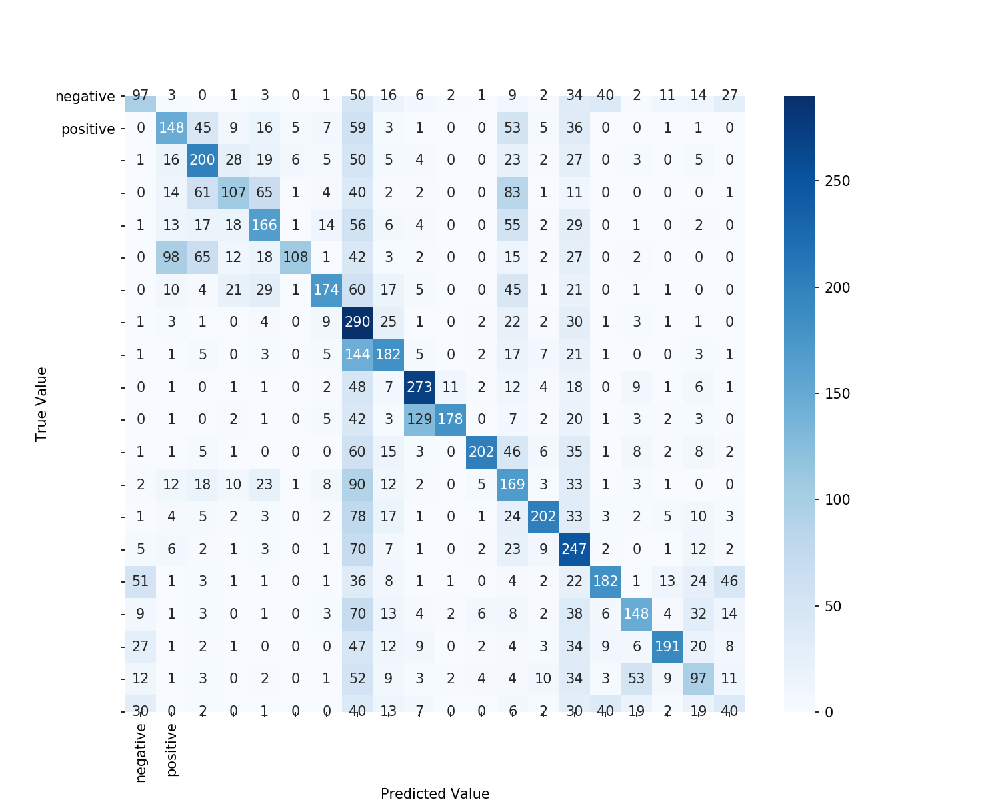

In [15]:
news_ngrams_results_ada_fine = cv_eval_save("news_ngrams_results_ada_fine.pkl", ada_grid_news, news['news_ngrams']['X_train'], news['news_ngrams']['y_train'],
             news['news_ngrams']['X_test'], news['news_ngrams']['y_test'], news_labels,'micro')

In [16]:
news_ngrams_results_ada_fine

{'grid': GridSearchCV(cv=2, error_score=nan,
              estimator=AdaBoostClassifier(algorithm='SAMME.R',
                                           base_estimator=None,
                                           learning_rate=1.0, n_estimators=50,
                                           random_state=42),
              iid='deprecated', n_jobs=-1,
              param_grid={'learning_rate': [0.1, 1],
                          'n_estimators': [100, 1000]},
              pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
              scoring=None, verbose=2),
 'val_acc': 0.4208060809616404,
 'val_std': 0.042867244122326315,
 'train_acc': 0.6571504330917448,
 'train_std': 0.12188439101997522,
 'train_results': {'acc': 0.649284072830122,
  'f1': 0.649284072830122,
  'conf_matrix': array([[259,   1,   0,   0,   0,   0,   0,  41,  16,  11,   0,   2,   5,
            4,  42,  36,   6,  12,  20,  25],
         [  0, 309,  72,  12,  19,   3,   4,  45,   4,   2,   0,   0,  57,
 

In [17]:
news_ngrams_results_ada_fine['grid'].best_params_

{'learning_rate': 0.1, 'n_estimators': 1000}

In [50]:
news_binary_ngrams_results_ada_fine = cv_eval_save("news_binary_ngrams_results_ada_fine.pkl", ada_grid_news, news['news_binary_ngrams']['X_train'], news['news_binary_ngrams']['y_train'],
             news['news_binary_ngrams']['X_test'], news['news_binary_ngrams']['y_test'], news_labels,'micro')

Fitting 2 folds for each of 4 candidates, totalling 8 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   8 | elapsed:   26.4s remaining:   44.0s
[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:  3.6min remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:  3.6min finished
C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\sklearn\utils\validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [51]:
news_binary_ngrams_results_ada_fine

{'grid': GridSearchCV(cv=2, error_score=nan,
              estimator=AdaBoostClassifier(algorithm='SAMME.R',
                                           base_estimator=None,
                                           learning_rate=1.0, n_estimators=50,
                                           random_state=42),
              iid='deprecated', n_jobs=-1,
              param_grid={'learning_rate': [0.1, 1],
                          'n_estimators': [100, 1000]},
              pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
              scoring=None, verbose=2),
 'val_acc': 0.4277885805197101,
 'val_std': 0.04366271875552413,
 'train_acc': 0.651847268870426,
 'train_std': 0.12648046667845148,
 'train_results': {'acc': 0.6429202757645395,
  'f1': 0.6429202757645395,
  'conf_matrix': array([[231,   0,   0,   0,   2,   0,   1,  58,  21,  14,   0,   2,   8,
           14,  19,  58,  11,   9,  13,  19],
         [  0, 343,  54,  16,  14,   4,   4,  45,   5,   4,   0,   1,  45,
 

In [76]:
ada_param_news = { #Params for gridsearch
    'n_estimators': [100, 1000],
    'learning_rate': [0.1, 1]
}

ada_grid_news = GridSearchCV(estimator=ada, param_grid=ada_param_news, n_jobs=-1,
                                cv=2, refit=True, verbose=2, return_train_score = True) #Tune Parameters


Fitting 2 folds for each of 4 candidates, totalling 8 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   8 | elapsed:   23.7s remaining:   39.5s
[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:  3.1min remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:  3.1min finished
C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\sklearn\utils\validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


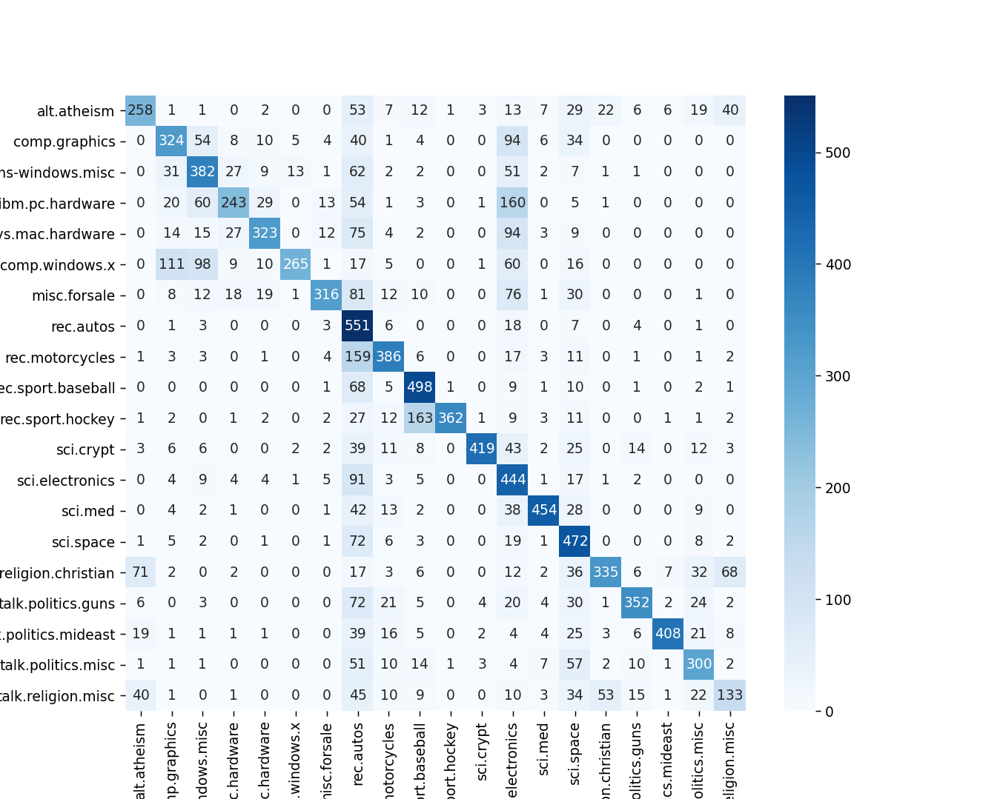

<IPython.core.display.Javascript object>


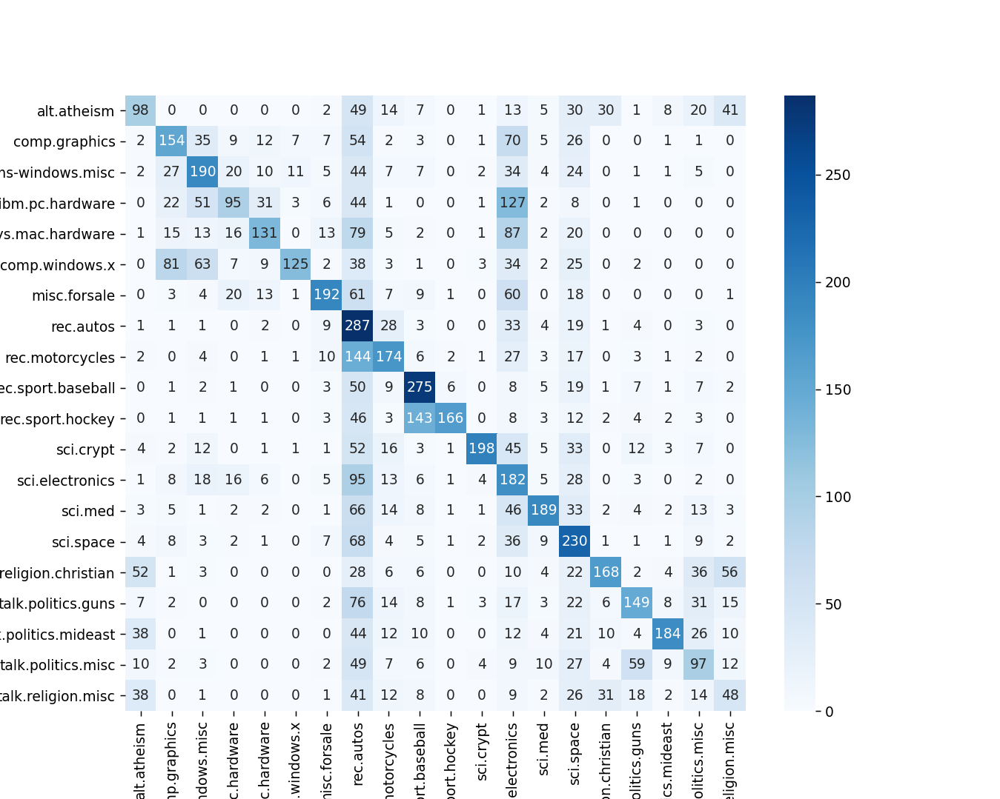

In [77]:
news_results_ada_fine = cv_eval_save("news_results_ada_fine.pkl", ada_grid_news, news['news']['X_train'], news['news']['y_train'],
             news['news']['X_test'], news['news']['y_test'], news_labels,'micro')

In [78]:
news_results_ada_fine

{'grid': GridSearchCV(cv=2, error_score=nan,
              estimator=AdaBoostClassifier(algorithm='SAMME.R',
                                           base_estimator=None,
                                           learning_rate=1.0, n_estimators=50,
                                           random_state=42),
              iid='deprecated', n_jobs=-1,
              param_grid={'learning_rate': [0.1, 1],
                          'n_estimators': [100, 1000]},
              pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
              scoring=None, verbose=2),
 'val_acc': 0.4790525013257911,
 'val_std': 0.0017677214071062375,
 'train_acc': 0.7697542867244123,
 'train_std': 0.009634081668729033,
 'train_results': {'acc': 0.6385893583171293,
  'f1': 0.6385893583171293,
  'conf_matrix': array([[258,   1,   1,   0,   2,   0,   0,  53,   7,  12,   1,   3,  13,
            7,  29,  22,   6,   6,  19,  40],
         [  0, 324,  54,   8,  10,   5,   4,  40,   1,   4,   0,   0,  9

# Naive Bayes Multinomial

C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This figure was saved with matplotlib version 3.1.1 and is unlikely to function correctly.
  after removing the cwd from sys.path.


<IPython.core.display.Javascript object>


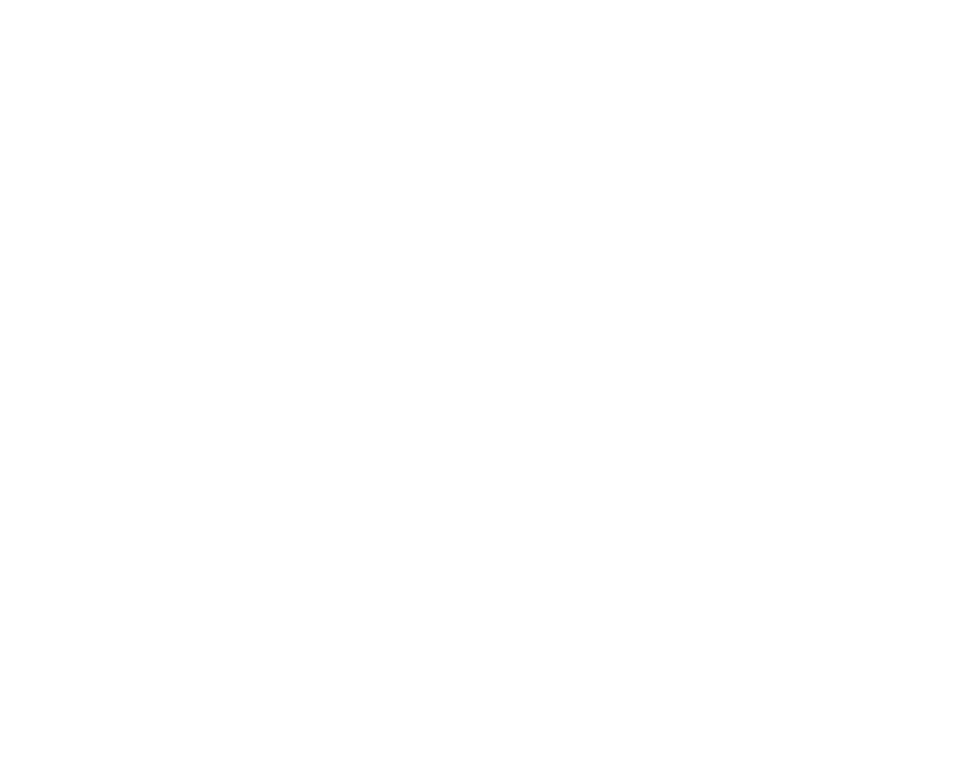

<IPython.core.display.Javascript object>


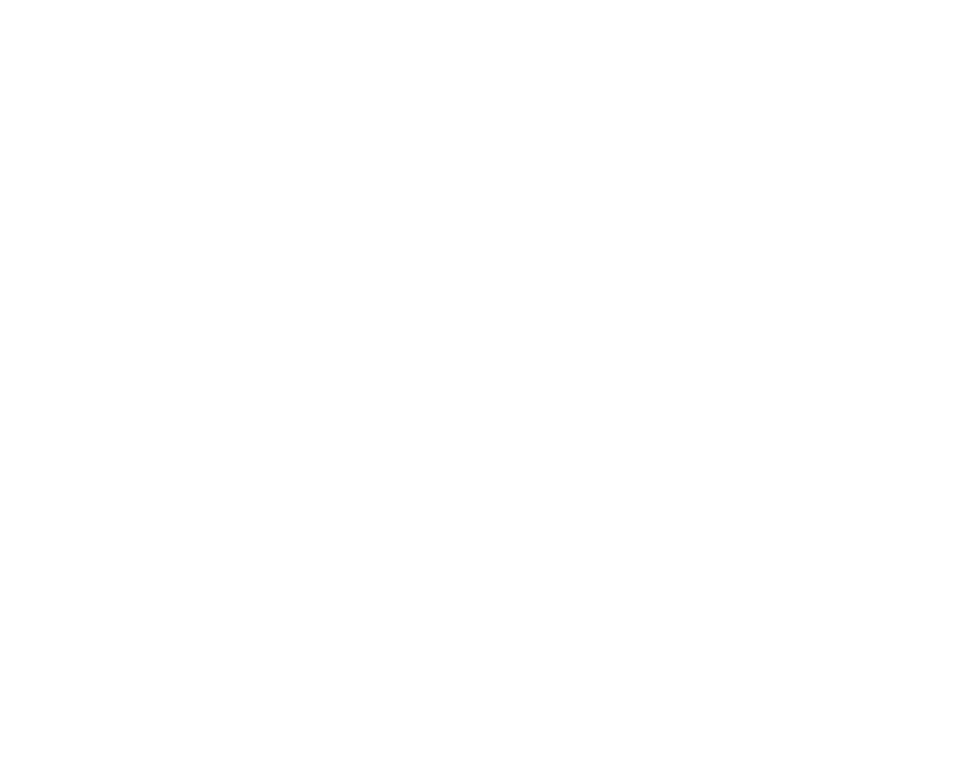

C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:5: UserWarning: This figure was saved with matplotlib version 3.1.1 and is unlikely to function correctly.
  """


<IPython.core.display.Javascript object>


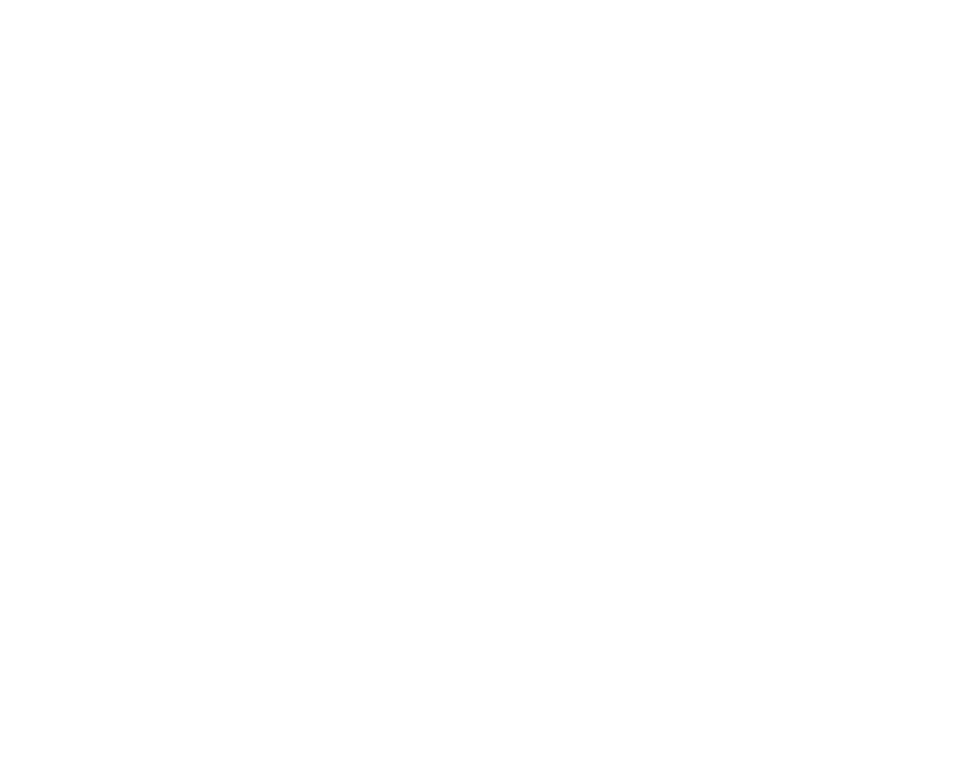

<IPython.core.display.Javascript object>


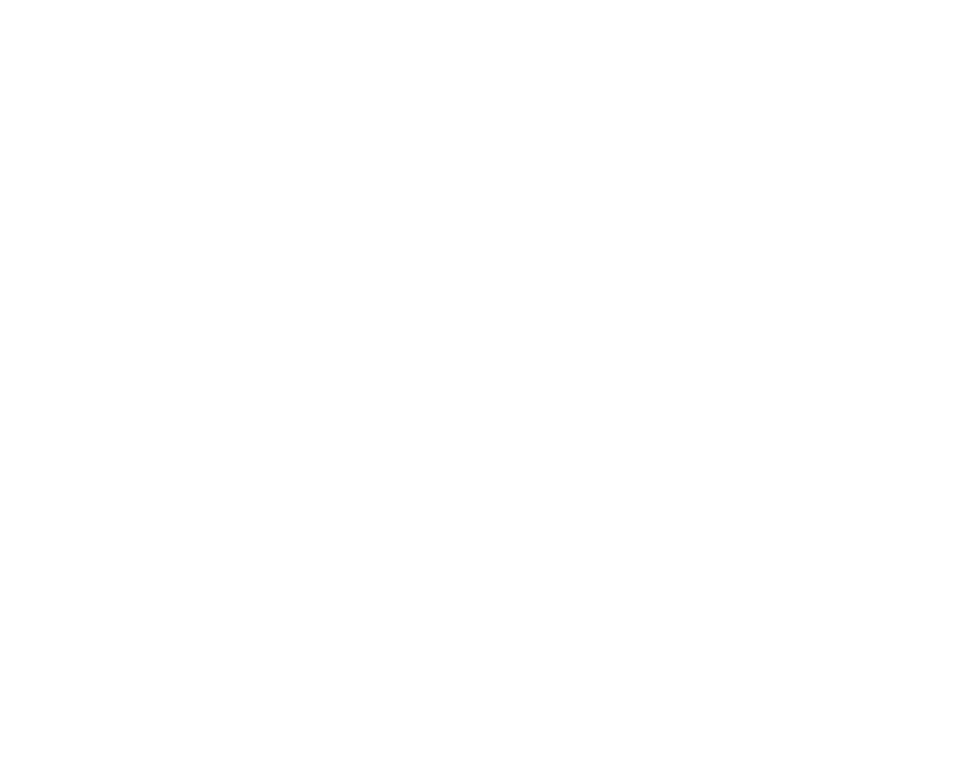

C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This figure was saved with matplotlib version 3.1.1 and is unlikely to function correctly.
  


<IPython.core.display.Javascript object>


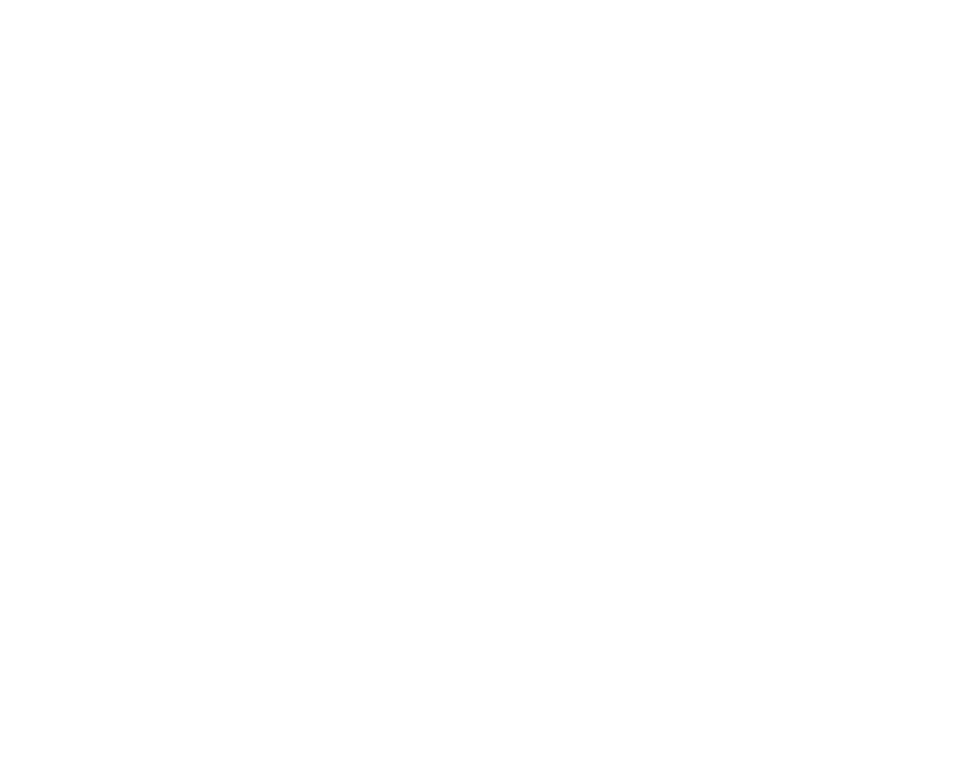

<IPython.core.display.Javascript object>


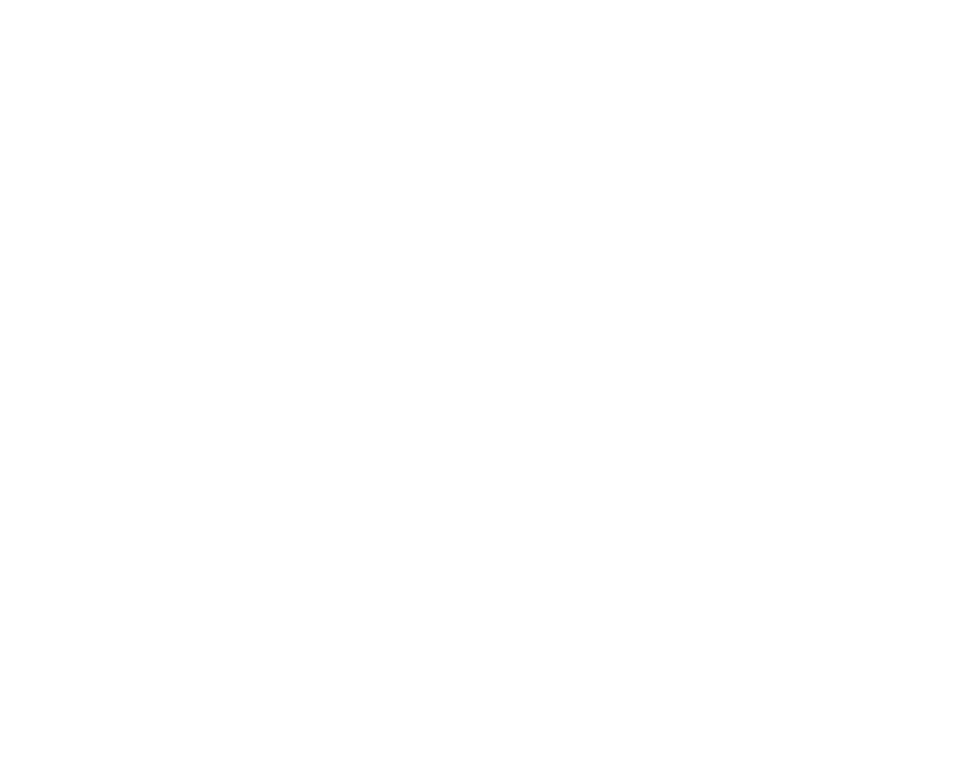

C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:7: UserWarning: This figure was saved with matplotlib version 3.1.1 and is unlikely to function correctly.
  import sys


<IPython.core.display.Javascript object>


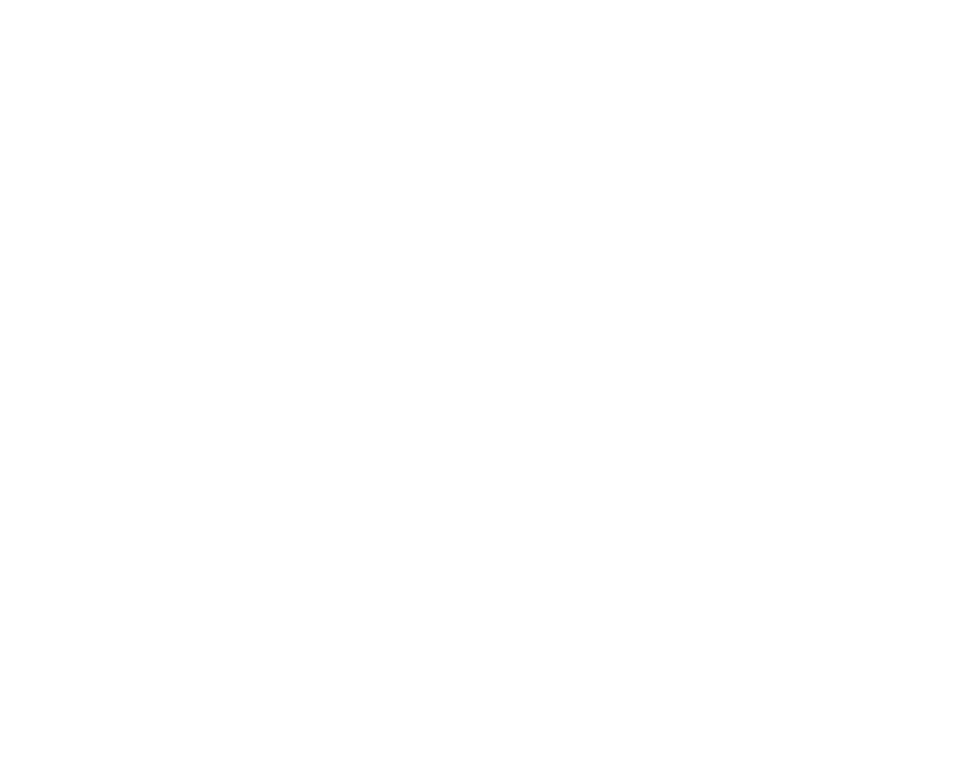

<IPython.core.display.Javascript object>


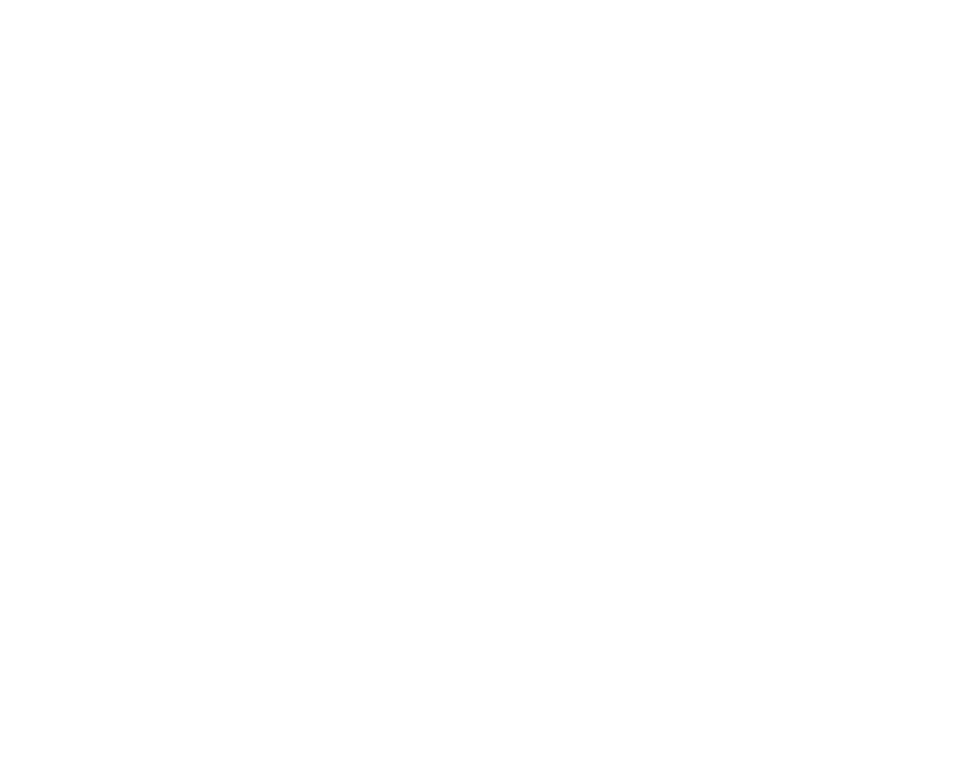

C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:9: UserWarning: This figure was saved with matplotlib version 3.1.1 and is unlikely to function correctly.
  if __name__ == '__main__':


<IPython.core.display.Javascript object>


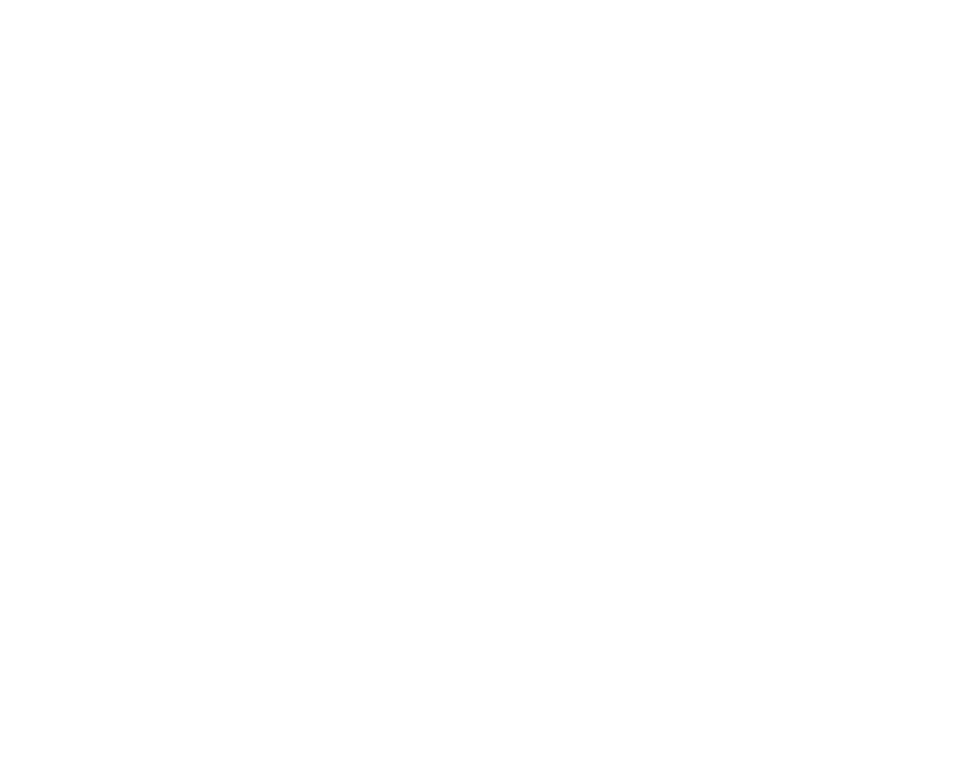

<IPython.core.display.Javascript object>


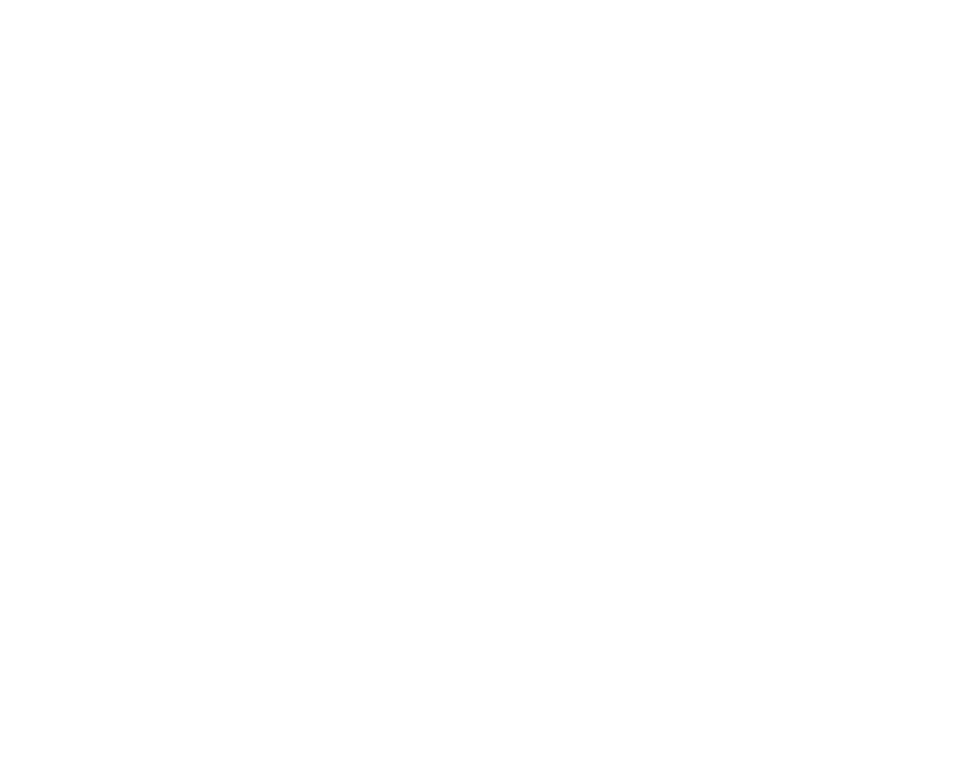

C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:10: UserWarning: This figure was saved with matplotlib version 3.1.1 and is unlikely to function correctly.
  # Remove the CWD from sys.path while we load stuff.


<IPython.core.display.Javascript object>


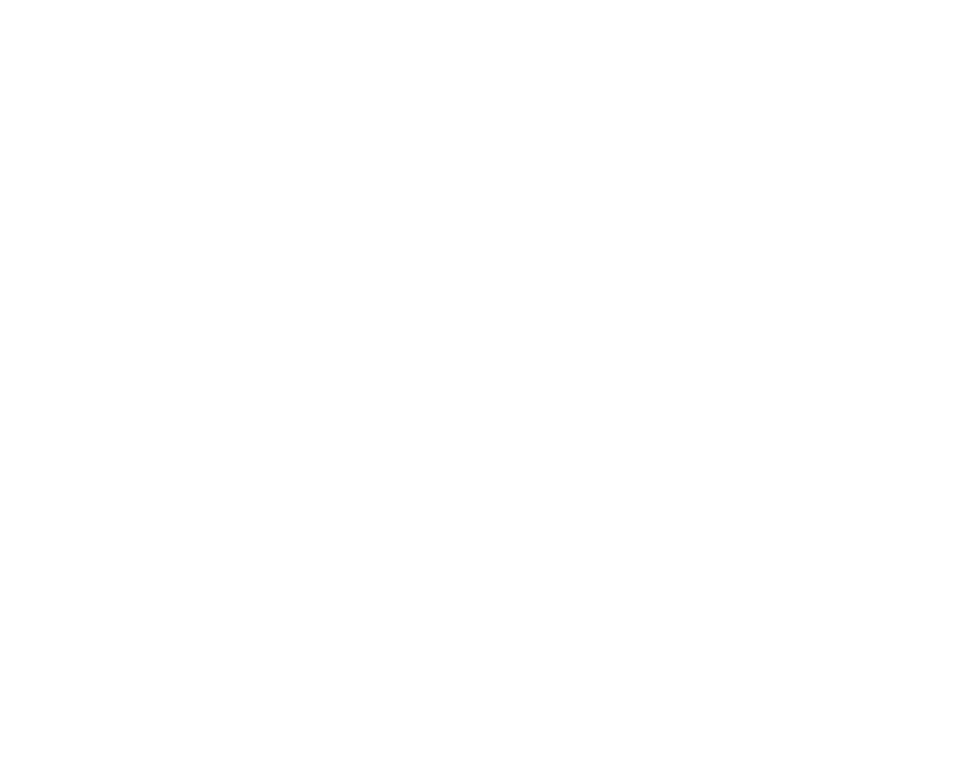

<IPython.core.display.Javascript object>


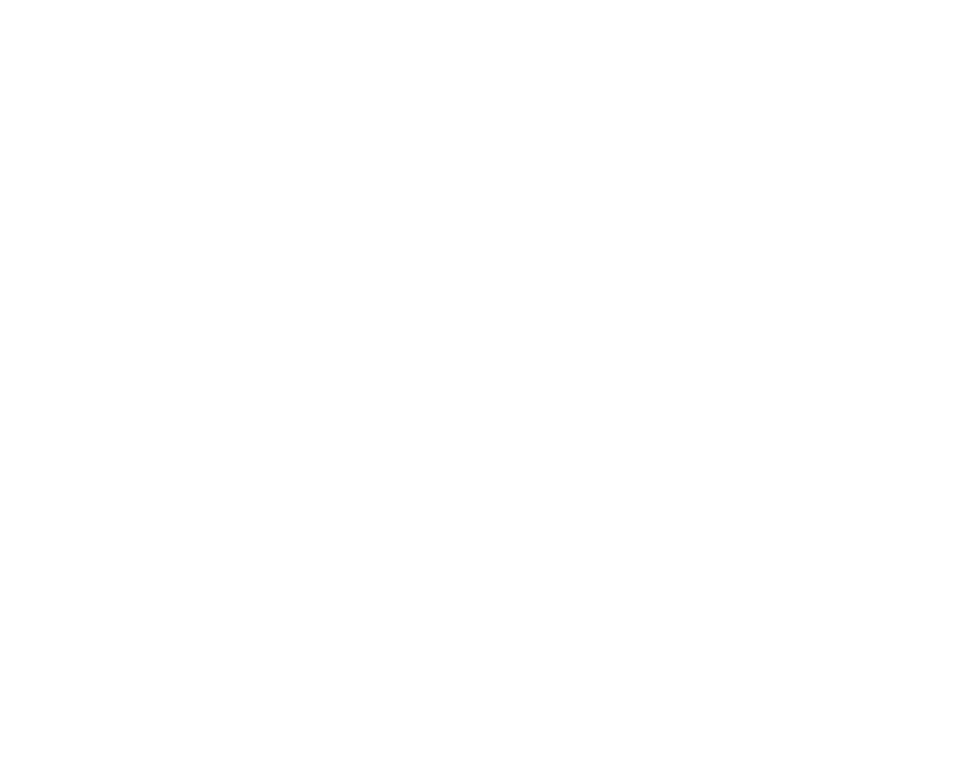

C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:11: UserWarning: This figure was saved with matplotlib version 3.1.1 and is unlikely to function correctly.
  # This is added back by InteractiveShellApp.init_path()


<IPython.core.display.Javascript object>


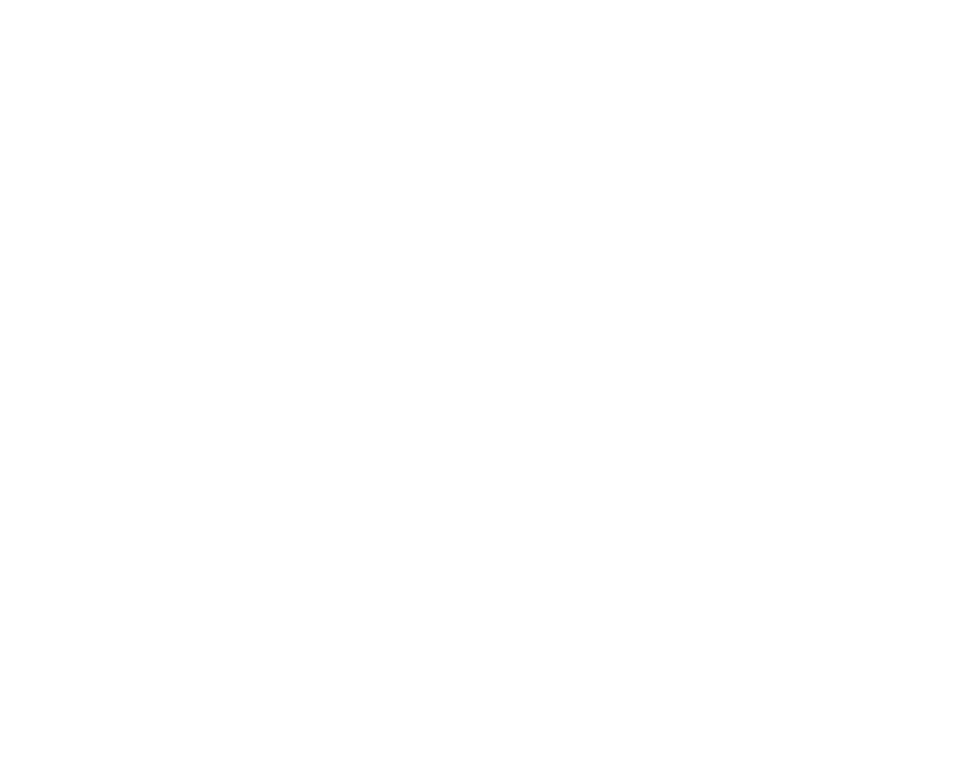

<IPython.core.display.Javascript object>


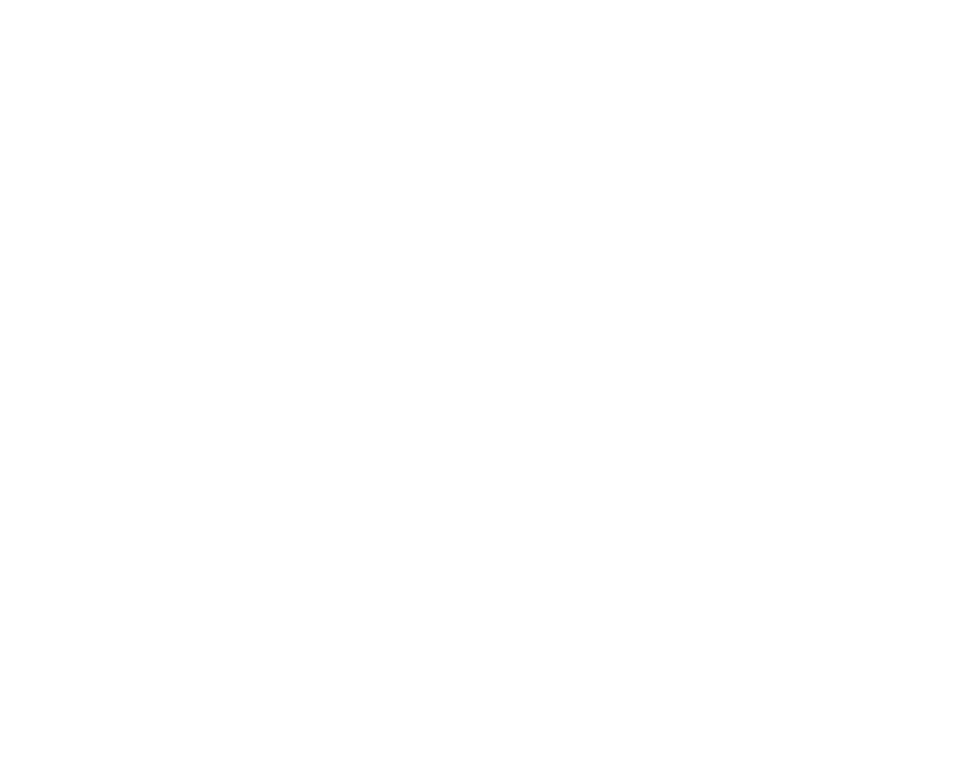

C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:12: UserWarning: This figure was saved with matplotlib version 3.1.1 and is unlikely to function correctly.
  if sys.path[0] == '':


<IPython.core.display.Javascript object>


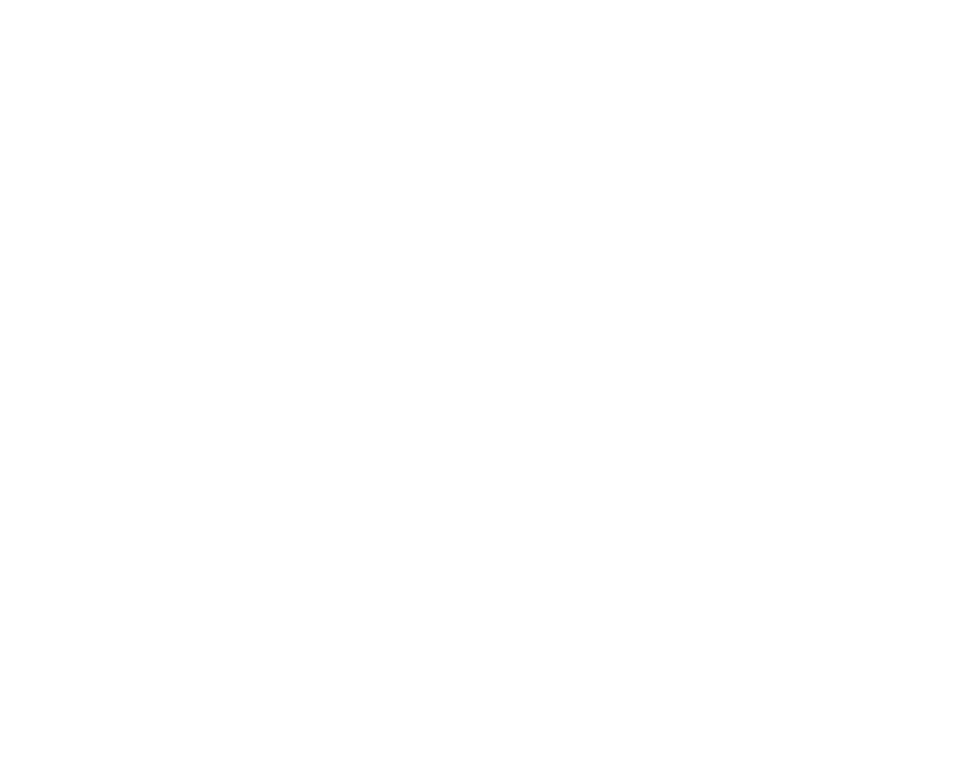

<IPython.core.display.Javascript object>


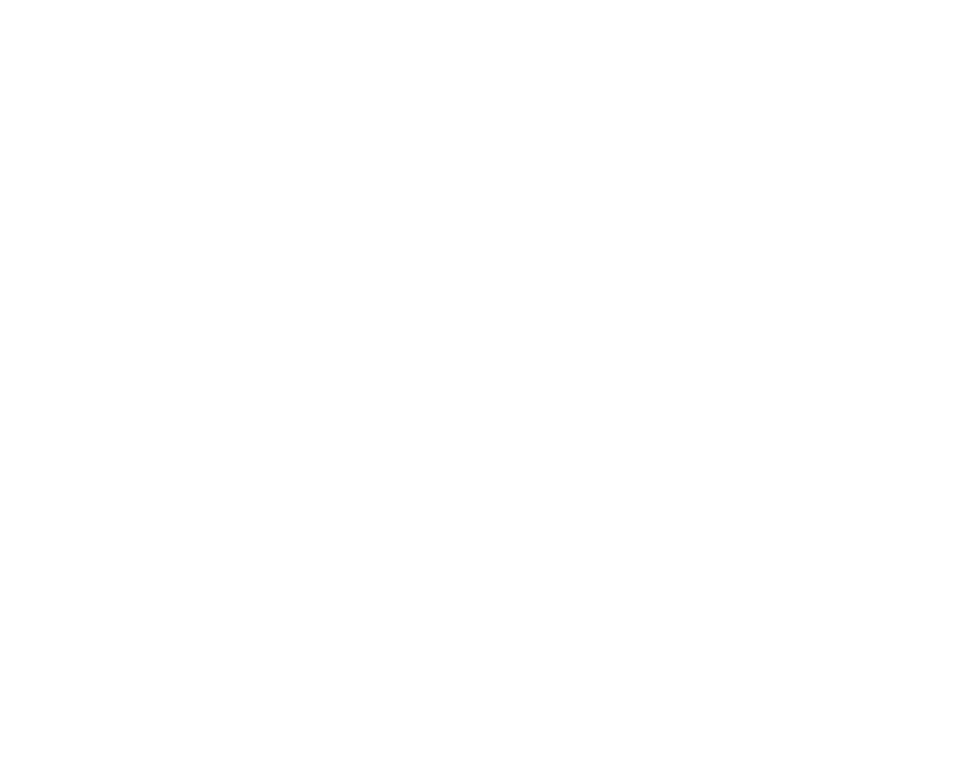

In [6]:
nb_data = load_pickles("nb")

In [7]:
for key, item in nb_data.items():
    print(key + " | Test Results: " + str(item['test_results']['acc']))

movie | Test Results: 0.82912
movie_binary | Test Results: 0.83624
movie_ngrams | Test Results: 0.8748
movie_binary_ngrams | Test Results: 0.88168
news | Test Results: 0.6959638874137015
news_binary | Test Results: 0.6860063728093467
news_ngrams | Test Results: 0.6841476367498672
news_binary_ngrams | Test Results: 0.669676048858205


In [8]:
nb_data['movie_binary_ngrams']['grid'].best_params_

{'alpha': 0.1, 'fit_prior': True}

In [9]:
nb_data['news']['grid'].best_params_

{'alpha': 0.1, 'fit_prior': False}

In [11]:
nb = MultinomialNB()

nb_param_movie = { #Params for gridsearch
    'alpha': [0.05, 0.1, 0.5],
    'fit_prior': [True]
}

nb_grid_movie = GridSearchCV(estimator=nb, param_grid=nb_param_movie, n_jobs=-1,
                                cv=5, refit=True, verbose=2, return_train_score = True) #Tune Parameters


Fitting 5 folds for each of 3 candidates, totalling 15 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   8 out of  15 | elapsed:    1.9s remaining:    1.7s
[Parallel(n_jobs=-1)]: Done  15 out of  15 | elapsed:    2.3s finished
C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\sklearn\utils\validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


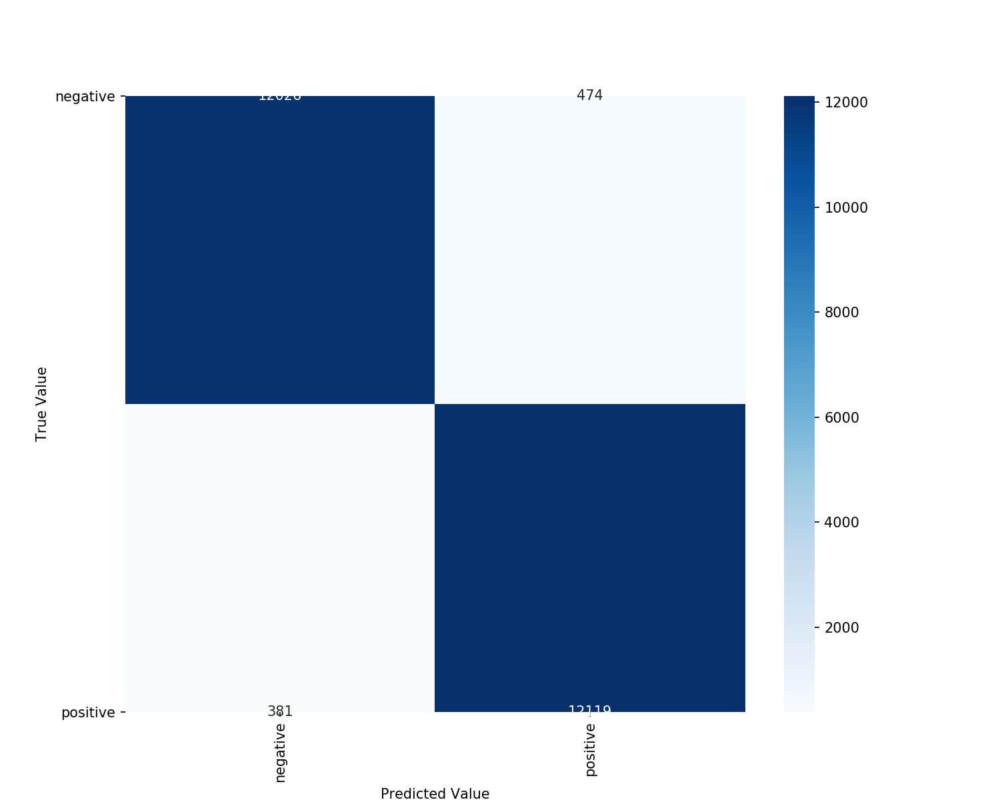

<IPython.core.display.Javascript object>


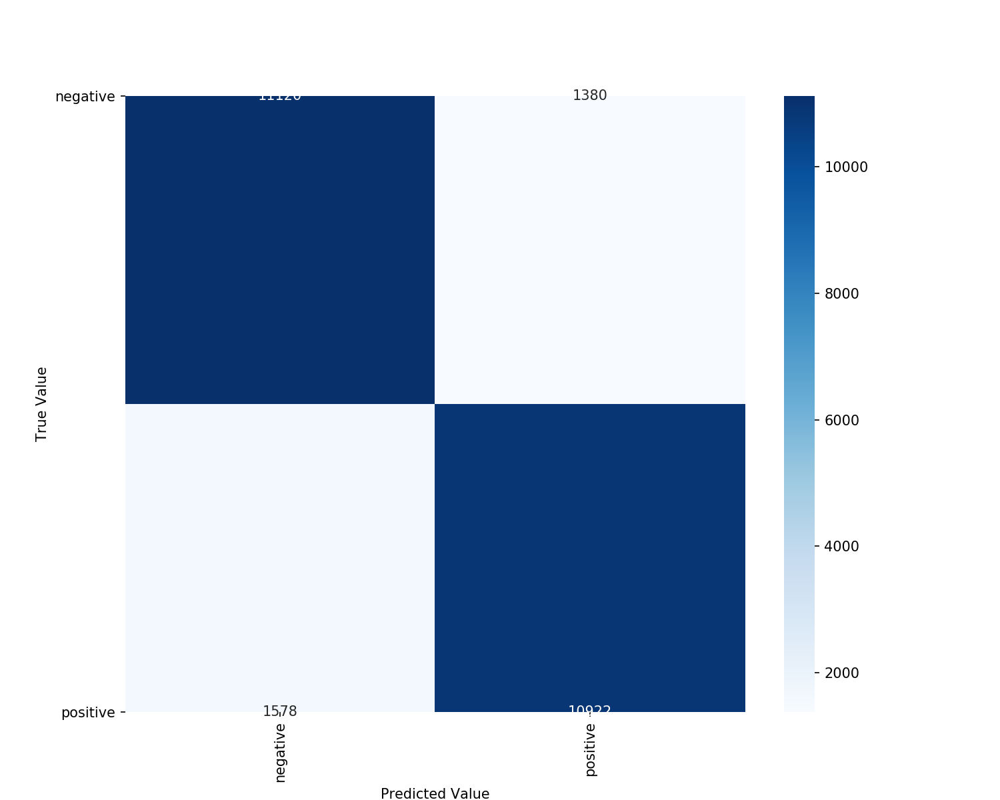

In [17]:
movie_binary_ngrams_results_nb_fine = cv_eval_save("movie_binary_ngrams_results_nb_fine.pkl", nb_grid_movie, movie['movie_binary_ngrams']['X_train'], movie['movie_binary_ngrams']['y_train'],
             movie['movie_binary_ngrams']['X_test'], movie['movie_binary_ngrams']['y_test'], movie_labels,'binary')

In [18]:
movie_binary_ngrams_results_nb_fine

{'grid': GridSearchCV(cv=5, error_score=nan,
              estimator=MultinomialNB(alpha=1.0, class_prior=None,
                                      fit_prior=True),
              iid='deprecated', n_jobs=-1,
              param_grid={'alpha': [0.05, 0.1, 0.5], 'fit_prior': [True]},
              pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
              scoring=None, verbose=2),
 'val_acc': 0.88972,
 'val_std': 0.004397453808739785,
 'train_acc': 0.9737200000000001,
 'train_std': 0.0006153048025166072,
 'train_results': {'acc': 0.9658,
  'f1': 0.9659267524807716,
  'conf_matrix': array([[12026,   474],
         [  381, 12119]], dtype=int64),
  'conf_matrix_plot': <Figure size 1500x1200 with 2 Axes>},
 'test_results': {'acc': 0.88168,
  'f1': 0.8807354245625352,
  'conf_matrix': array([[11120,  1380],
         [ 1578, 10922]], dtype=int64),
  'conf_matrix_plot': <Figure size 1500x1200 with 2 Axes>}}

In [19]:
movie_binary_ngrams_results_nb_fine['grid'].best_params_

{'alpha': 0.1, 'fit_prior': True}

In [37]:

nb_param_news = { #Params for gridsearch
    'alpha': [0.15],
    'fit_prior': [False]
}

nb_grid_news = GridSearchCV(estimator=nb, param_grid=nb_param_news, n_jobs=-1,
                                cv=5, refit=True, verbose=2, return_train_score = True) #Tune Parameters


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    0.0s remaining:    0.1s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.1s finished
C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\sklearn\utils\validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


<IPython.core.display.Javascript object>


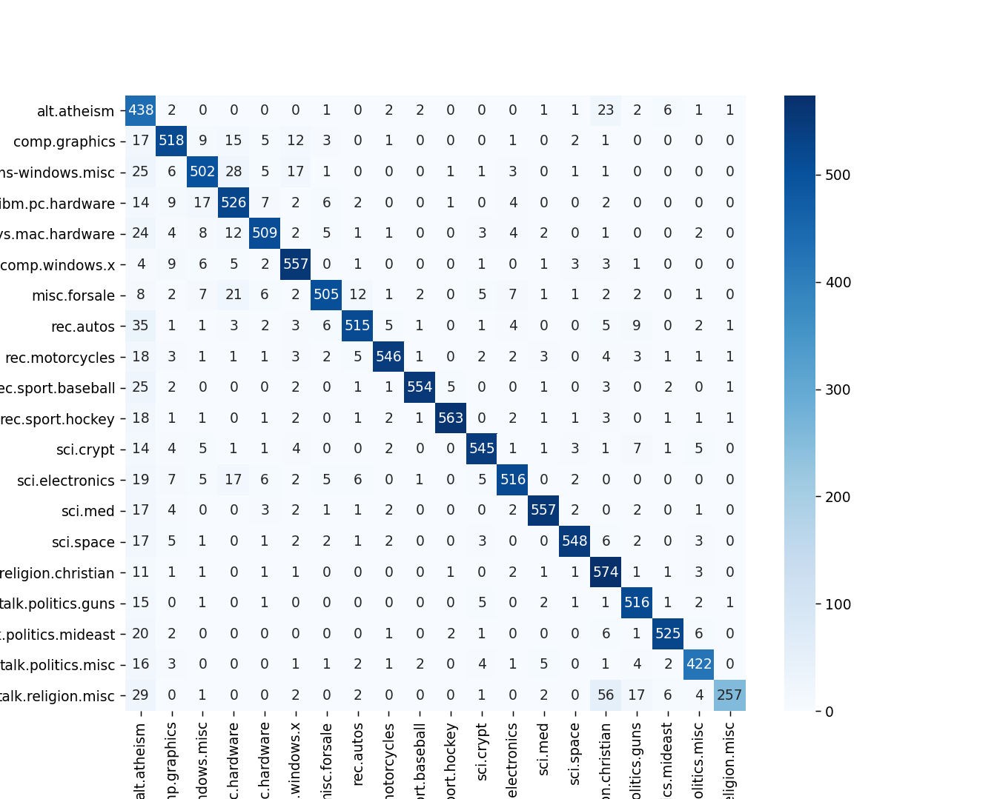

<IPython.core.display.Javascript object>


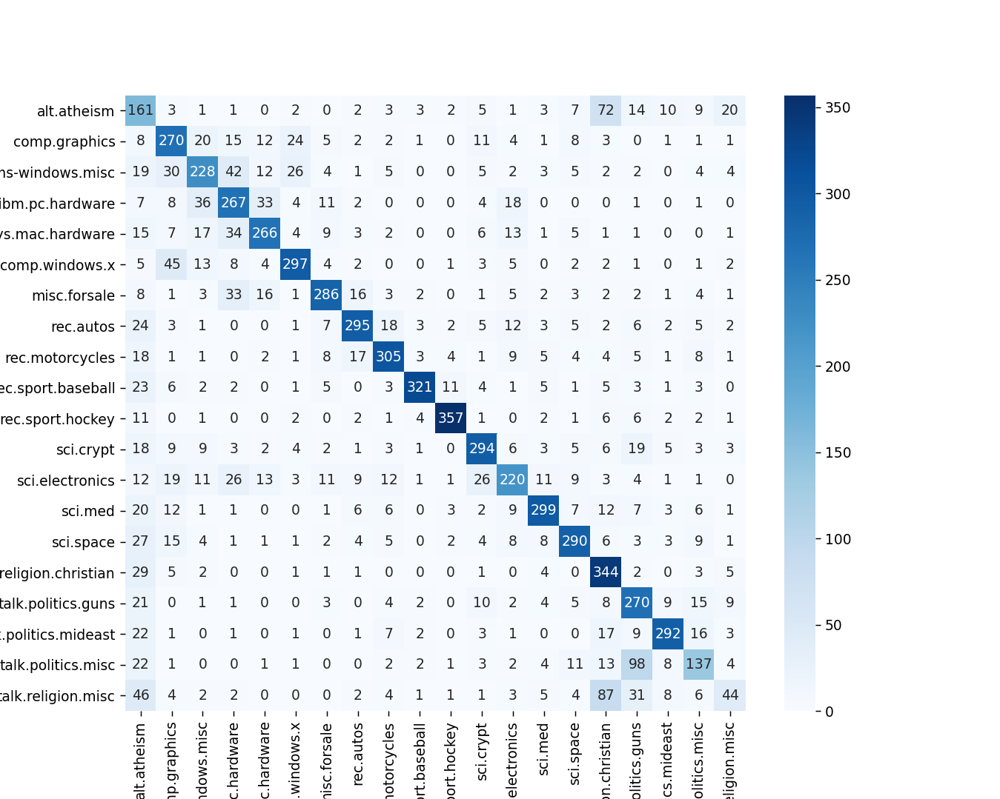

In [38]:
news_results_nb_fine = cv_eval_save("news_ngrams_results_nb_fine.pkl", nb_grid_news, news['news']['X_train'], news['news']['y_train'],
             news['news']['X_test'], news['news']['y_test'], news_labels,'micro')

In [39]:
news_results_nb_fine

{'grid': GridSearchCV(cv=5, error_score=nan,
              estimator=MultinomialNB(alpha=1.0, class_prior=None,
                                      fit_prior=True),
              iid='deprecated', n_jobs=-1,
              param_grid={'alpha': [0.15], 'fit_prior': [False]},
              pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
              scoring=None, verbose=2),
 'val_acc': 0.7466843892034744,
 'val_std': 0.007674638211183747,
 'train_acc': 0.9104427686327778,
 'train_std': 0.0012659684166662945,
 'train_results': {'acc': 0.9009192151316953,
  'f1': 0.9009192151316953,
  'conf_matrix': array([[438,   2,   0,   0,   0,   0,   1,   0,   2,   2,   0,   0,   0,
            1,   1,  23,   2,   6,   1,   1],
         [ 17, 518,   9,  15,   5,  12,   3,   0,   1,   0,   0,   0,   1,
            0,   2,   1,   0,   0,   0,   0],
         [ 25,   6, 502,  28,   5,  17,   1,   0,   0,   0,   1,   1,   3,
            0,   1,   1,   0,   0,   0,   0],
         [ 14,   9,

In [40]:
news_results_nb_fine['grid'].best_params_

{'alpha': 0.15, 'fit_prior': False}

In [20]:
nb_data['news_binary_ngrams']['grid'].best_params_

{'alpha': 0.1, 'fit_prior': False}

In [44]:

nb_param_news = { #Params for gridsearch
    'alpha': [0.1],
    'fit_prior': [False]
}

nb_grid_news = GridSearchCV(estimator=nb, param_grid=nb_param_news, n_jobs=-1,
                                cv=5, refit=True, verbose=2, return_train_score = True) #Tune Parameters


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    0.2s remaining:    0.4s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.2s finished
C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\sklearn\utils\validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


<IPython.core.display.Javascript object>


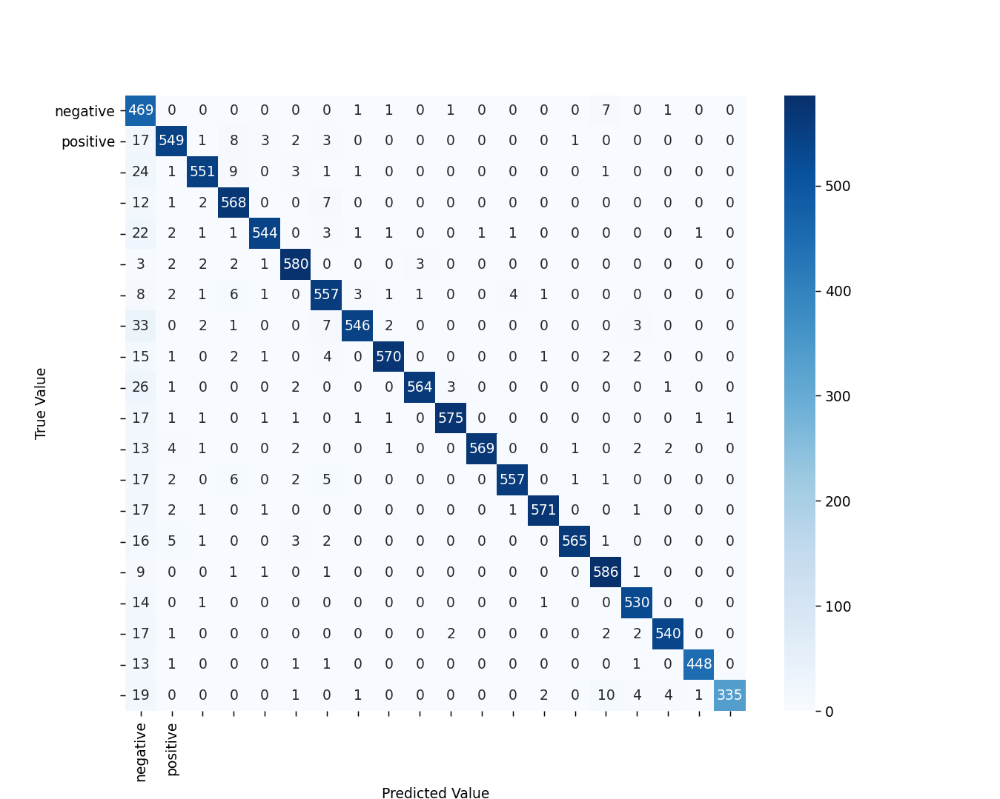

<IPython.core.display.Javascript object>


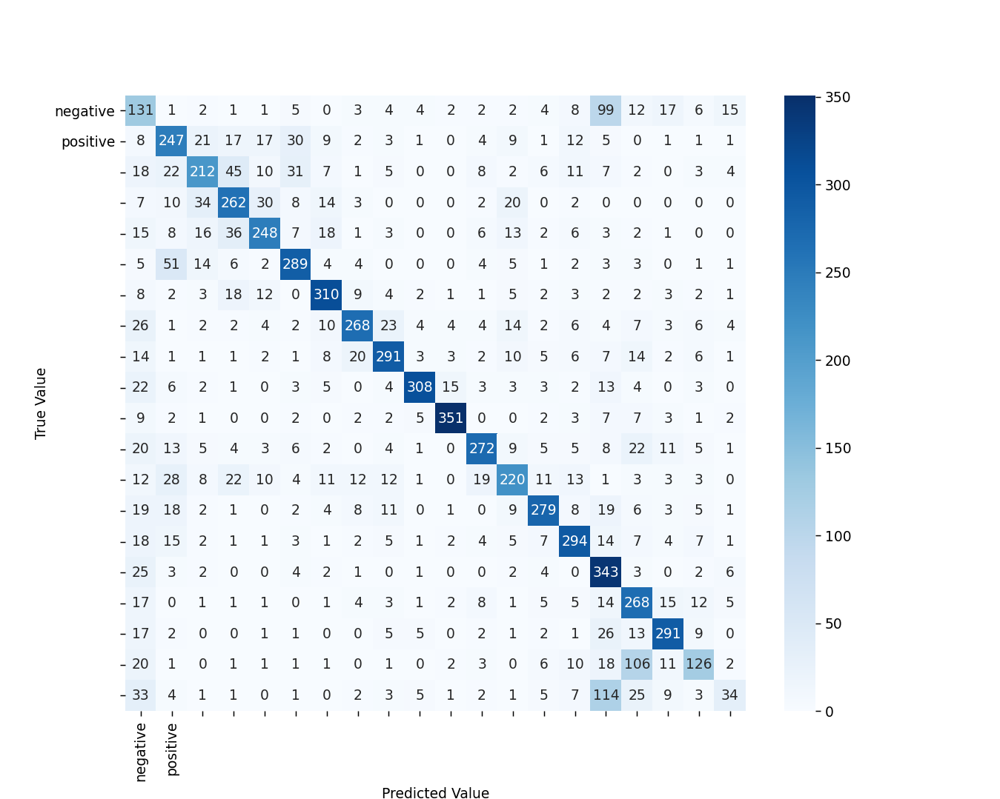

In [45]:
news_binary_ngrams_results_nb_fine = cv_eval_save("news_binary_ngrams_results_nb_fine.pkl", nb_grid_news, news['news_binary_ngrams']['X_train'], news['news_binary_ngrams']['y_train'],
             news['news_binary_ngrams']['X_test'], news['news_binary_ngrams']['y_test'], movie_labels,'micro')

In [46]:
news_binary_ngrams_results_nb_fine

{'grid': GridSearchCV(cv=5, error_score=nan,
              estimator=MultinomialNB(alpha=1.0, class_prior=None,
                                      fit_prior=True),
              iid='deprecated', n_jobs=-1,
              param_grid={'alpha': [0.1], 'fit_prior': [False]},
              pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
              scoring=None, verbose=2),
 'val_acc': 0.7286537787566327,
 'val_std': 0.007790804221346344,
 'train_acc': 0.9571327679995516,
 'train_std': 0.00039394490276662374,
 'train_results': {'acc': 0.9522715220081315,
  'f1': 0.9522715220081315,
  'conf_matrix': array([[469,   0,   0,   0,   0,   0,   0,   1,   1,   0,   1,   0,   0,
            0,   0,   7,   0,   1,   0,   0],
         [ 17, 549,   1,   8,   3,   2,   3,   0,   0,   0,   0,   0,   0,
            0,   1,   0,   0,   0,   0,   0],
         [ 24,   1, 551,   9,   0,   3,   1,   1,   0,   0,   0,   0,   0,
            0,   0,   1,   0,   0,   0,   0],
         [ 12,   1,

# Logistic Regression

C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:4: UserWarning: This figure was saved with matplotlib version 3.1.1 and is unlikely to function correctly.
  after removing the cwd from sys.path.


<IPython.core.display.Javascript object>


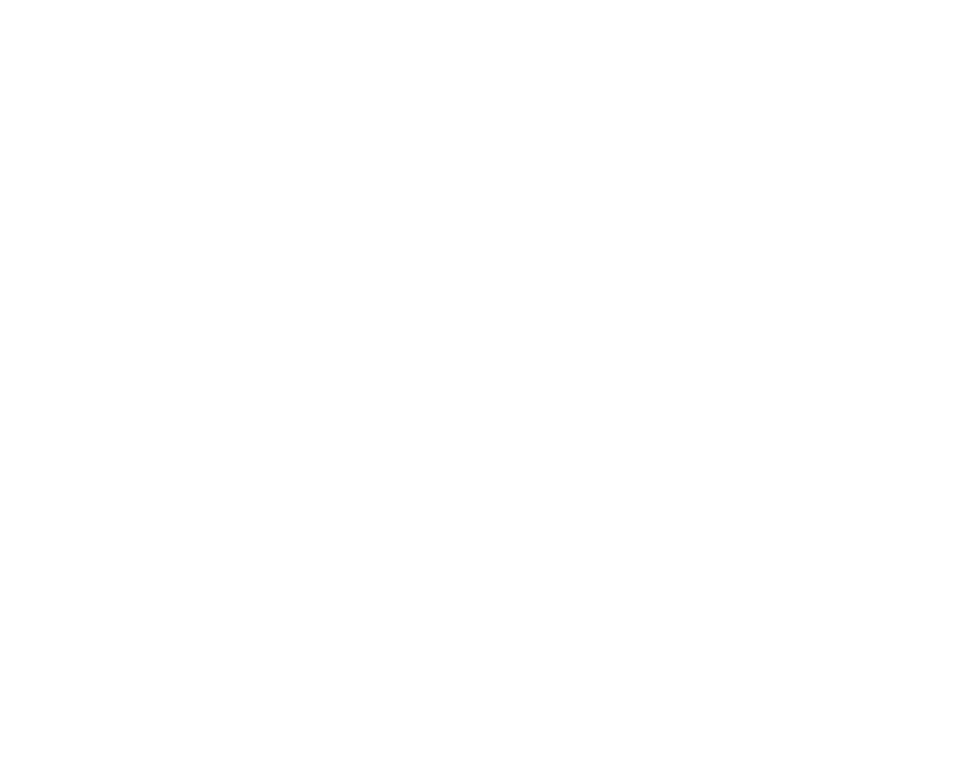

<IPython.core.display.Javascript object>


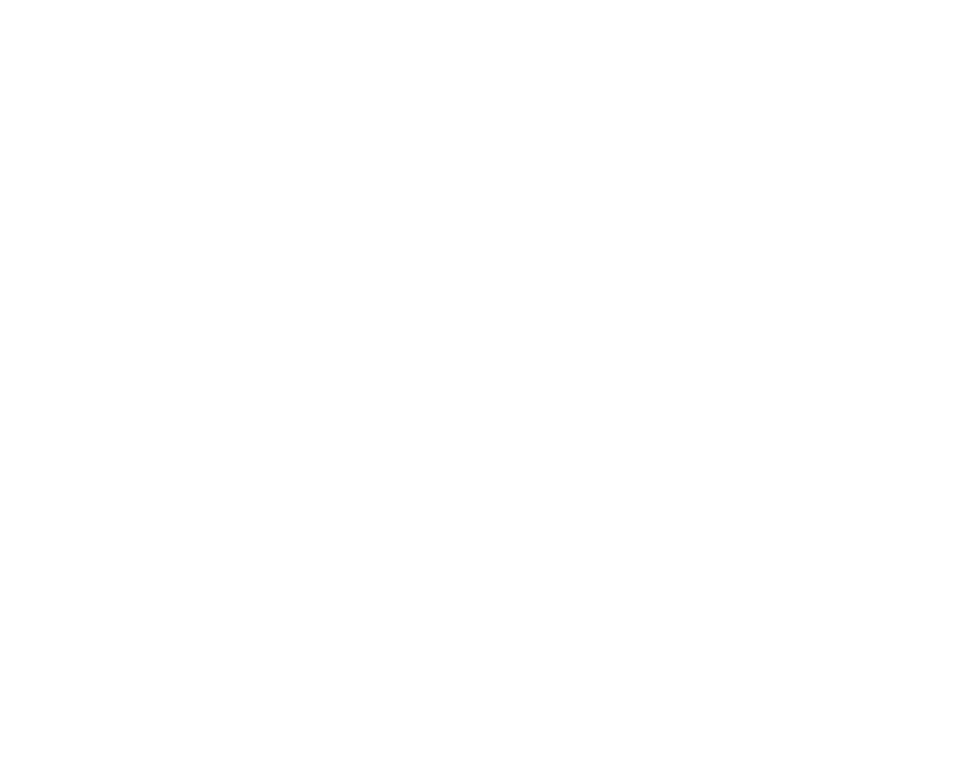

C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:5: UserWarning: This figure was saved with matplotlib version 3.1.1 and is unlikely to function correctly.
  """


<IPython.core.display.Javascript object>


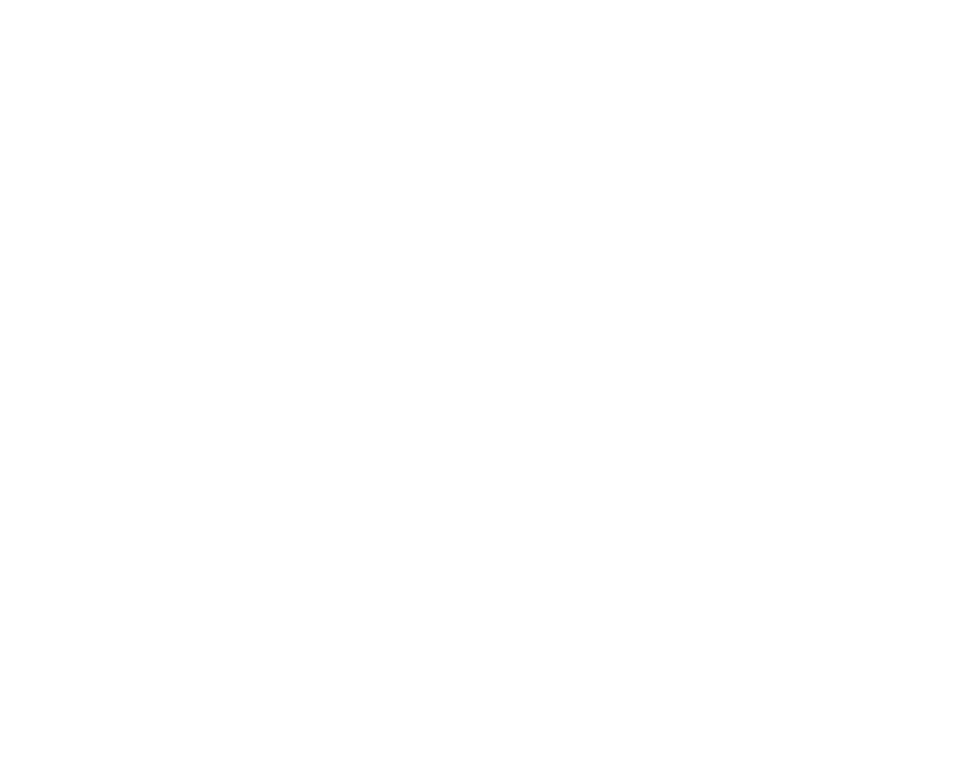

<IPython.core.display.Javascript object>


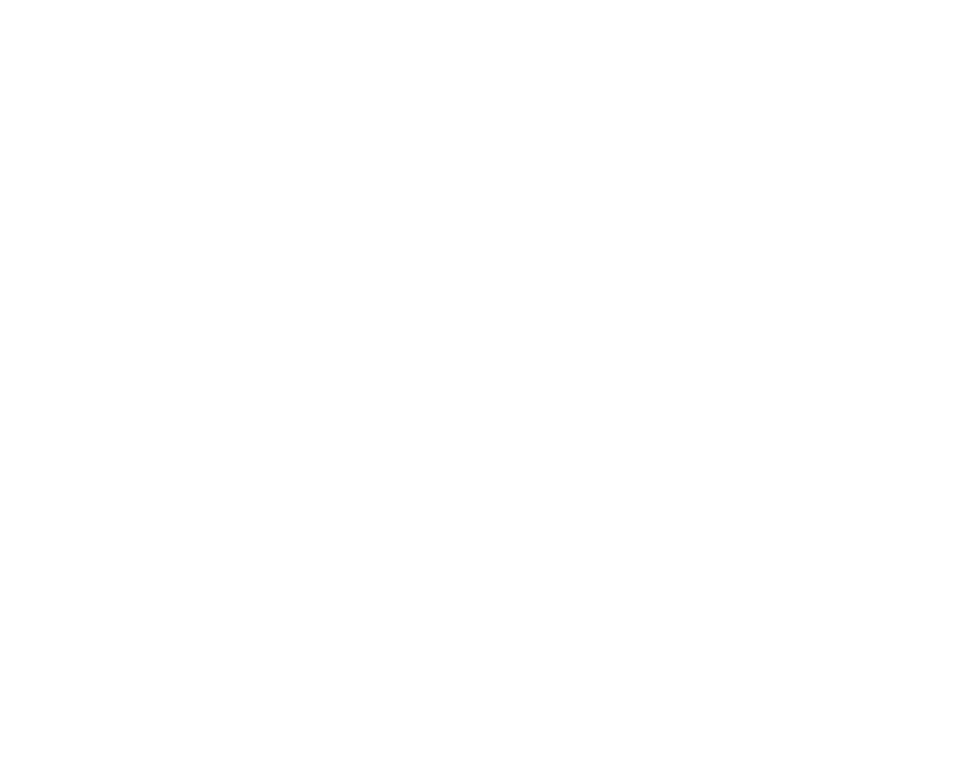

C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:6: UserWarning: This figure was saved with matplotlib version 3.1.3 and is unlikely to function correctly.
  


<IPython.core.display.Javascript object>


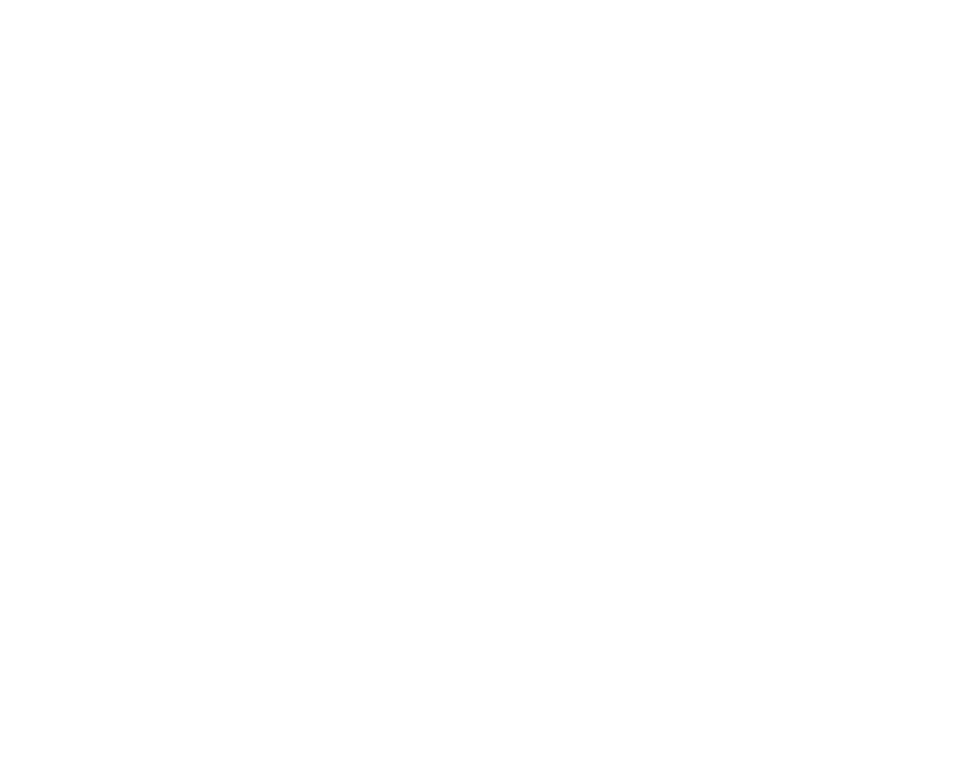

<IPython.core.display.Javascript object>


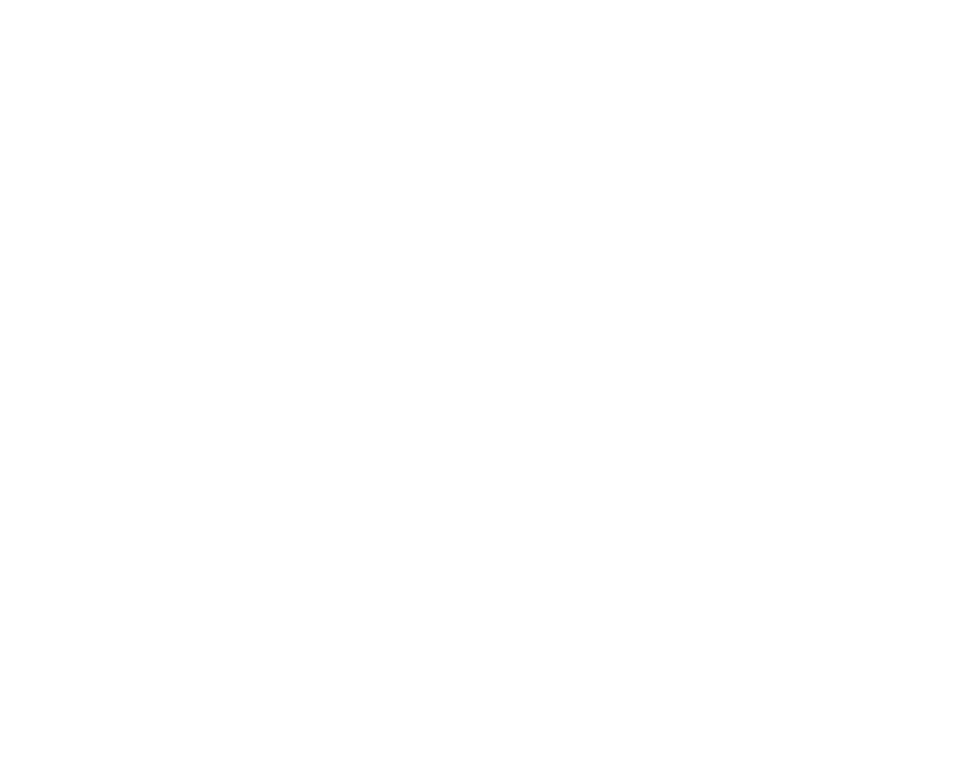

C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:7: UserWarning: This figure was saved with matplotlib version 3.1.3 and is unlikely to function correctly.
  import sys


<IPython.core.display.Javascript object>


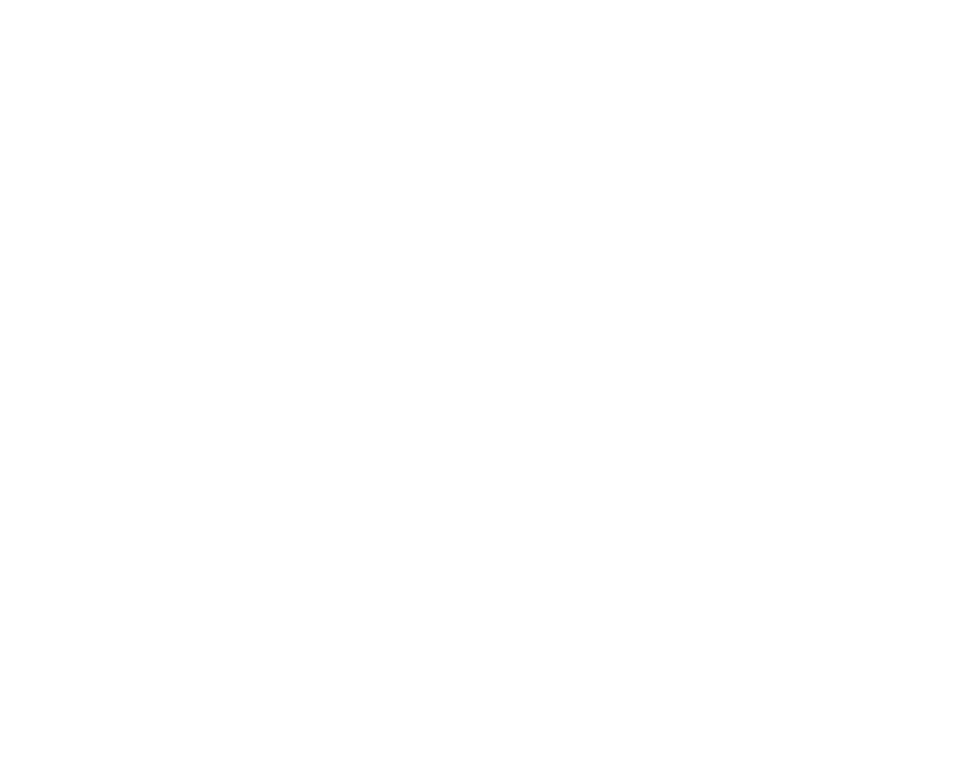

<IPython.core.display.Javascript object>


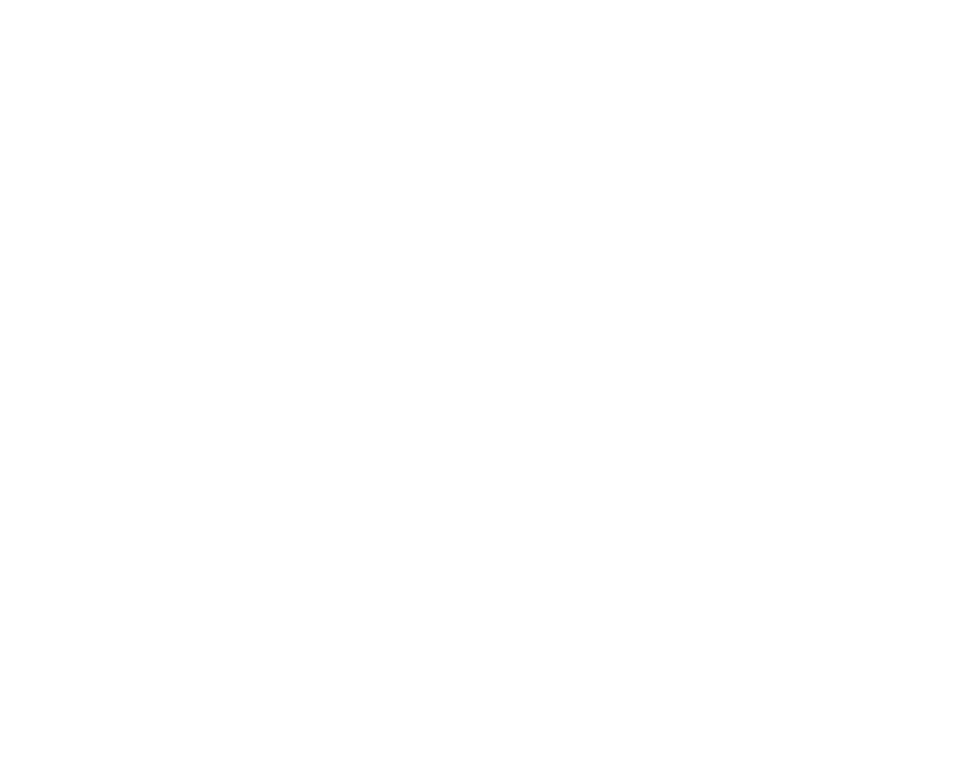

C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:9: UserWarning: This figure was saved with matplotlib version 3.1.1 and is unlikely to function correctly.
  if __name__ == '__main__':


<IPython.core.display.Javascript object>


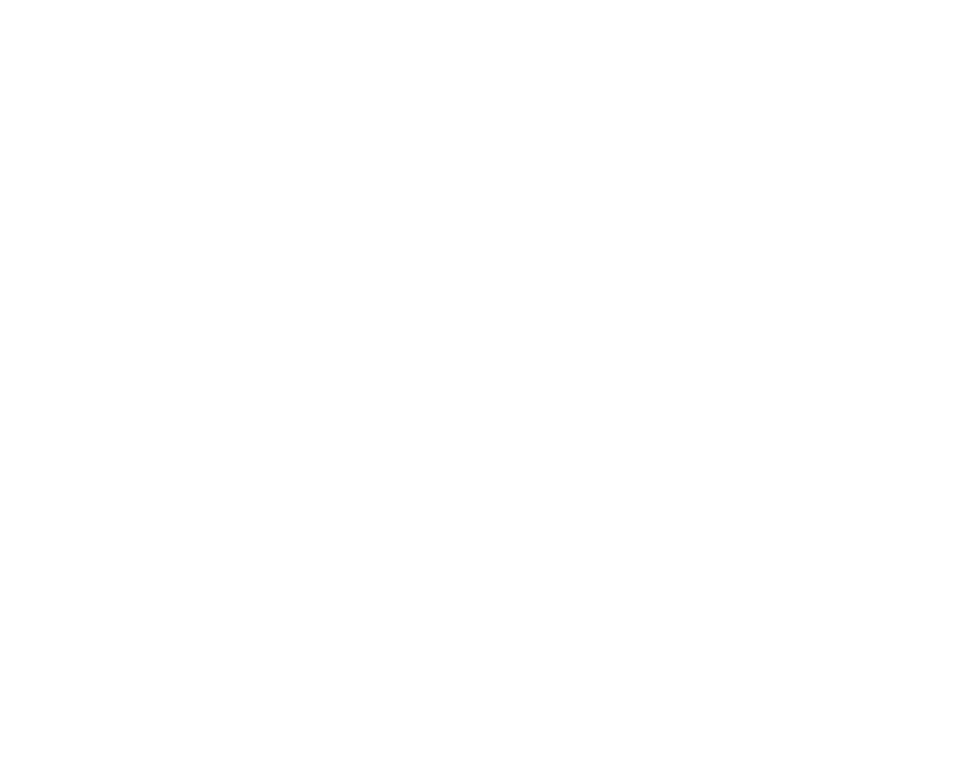

<IPython.core.display.Javascript object>


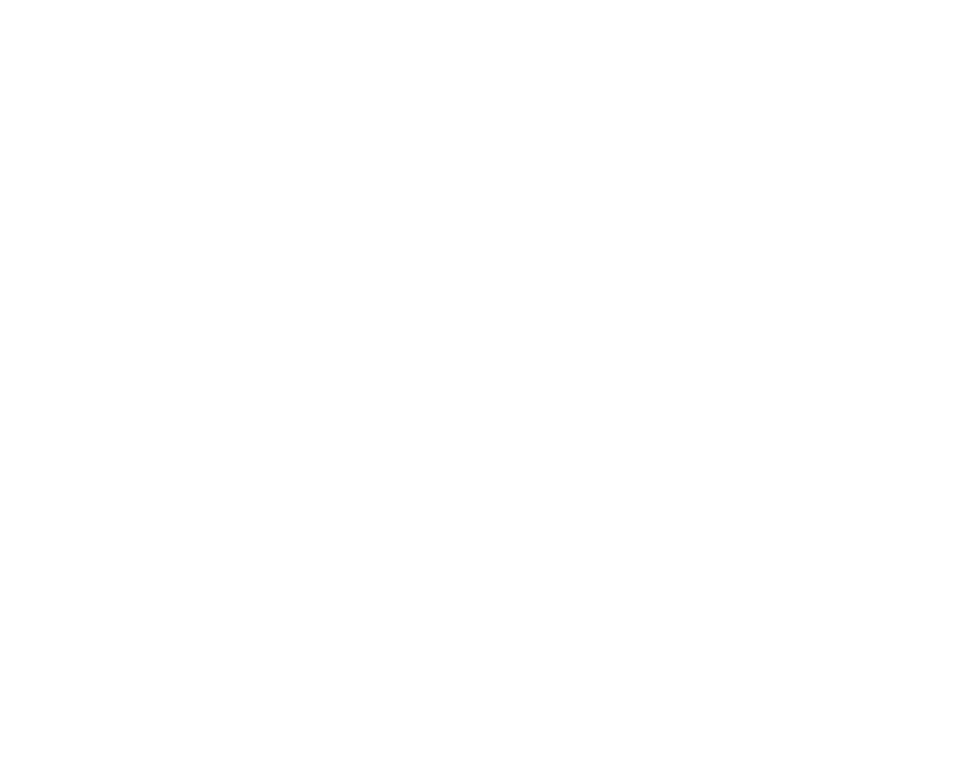

C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:10: UserWarning: This figure was saved with matplotlib version 3.1.3 and is unlikely to function correctly.
  # Remove the CWD from sys.path while we load stuff.


<IPython.core.display.Javascript object>


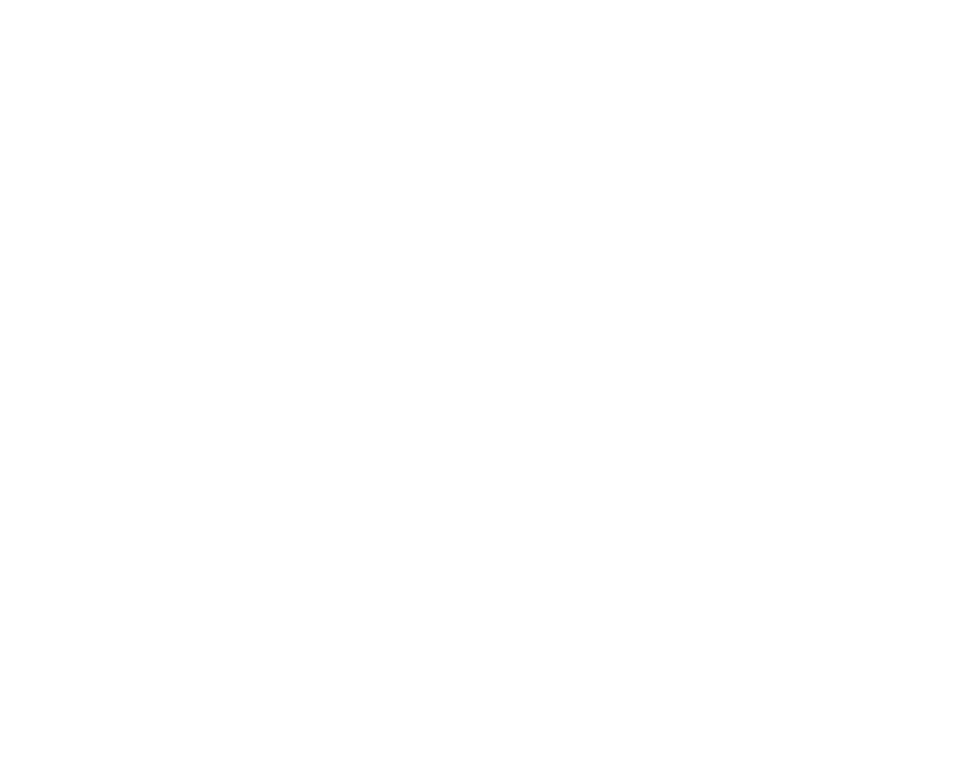

<IPython.core.display.Javascript object>


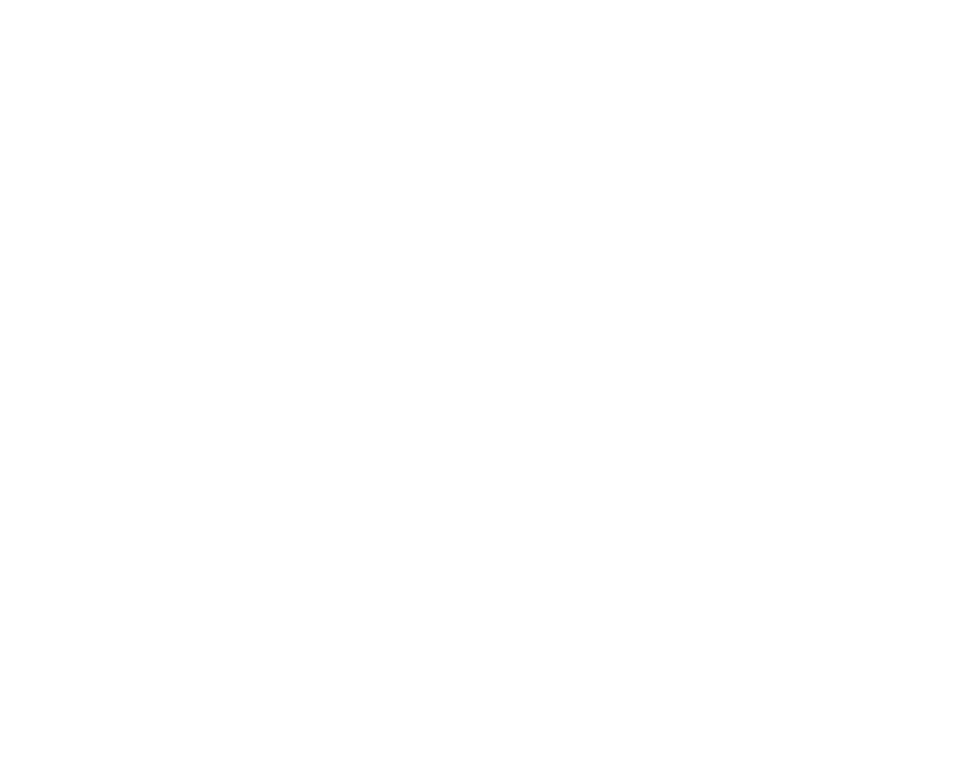

C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:11: UserWarning: This figure was saved with matplotlib version 3.1.3 and is unlikely to function correctly.
  # This is added back by InteractiveShellApp.init_path()


<IPython.core.display.Javascript object>


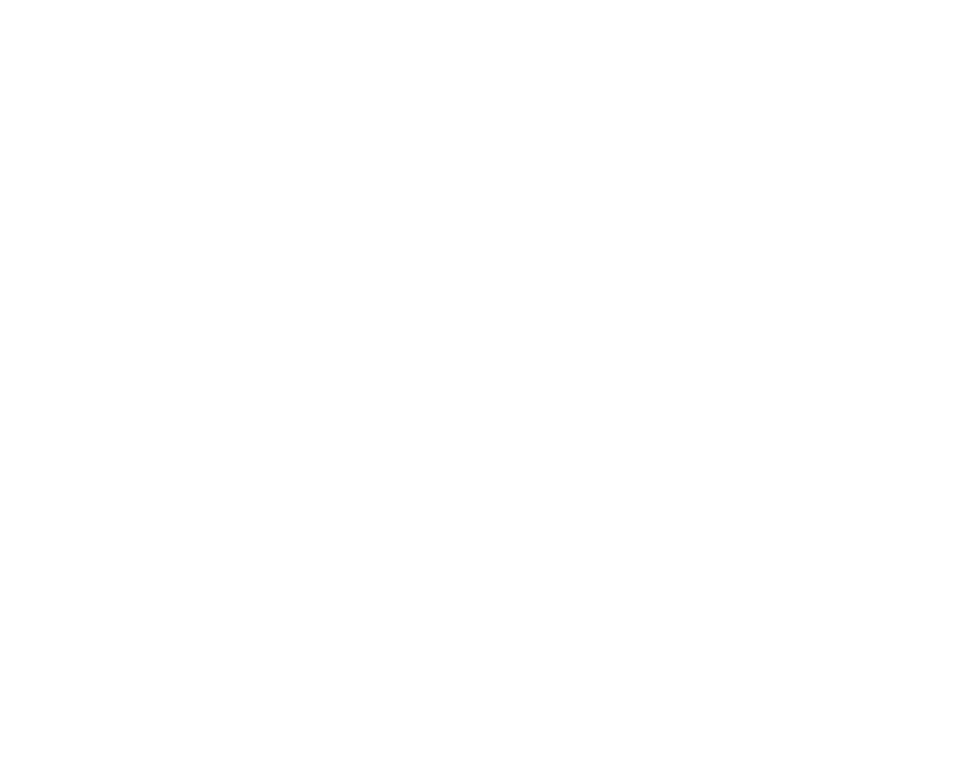

<IPython.core.display.Javascript object>


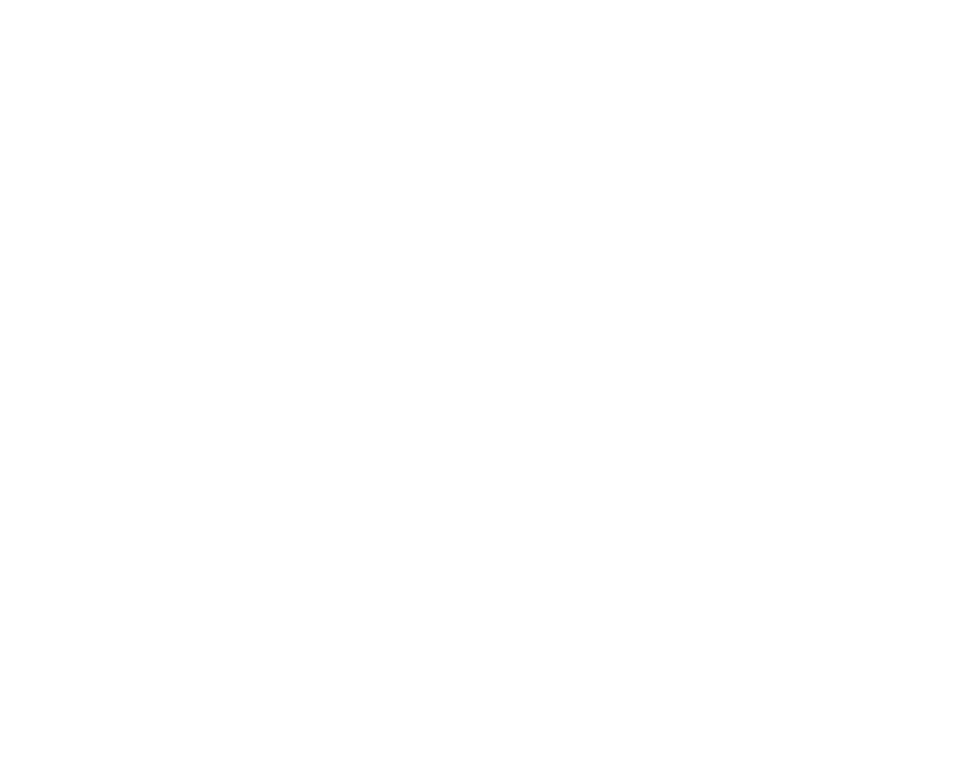

C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:12: UserWarning: This figure was saved with matplotlib version 3.1.3 and is unlikely to function correctly.
  if sys.path[0] == '':


<IPython.core.display.Javascript object>


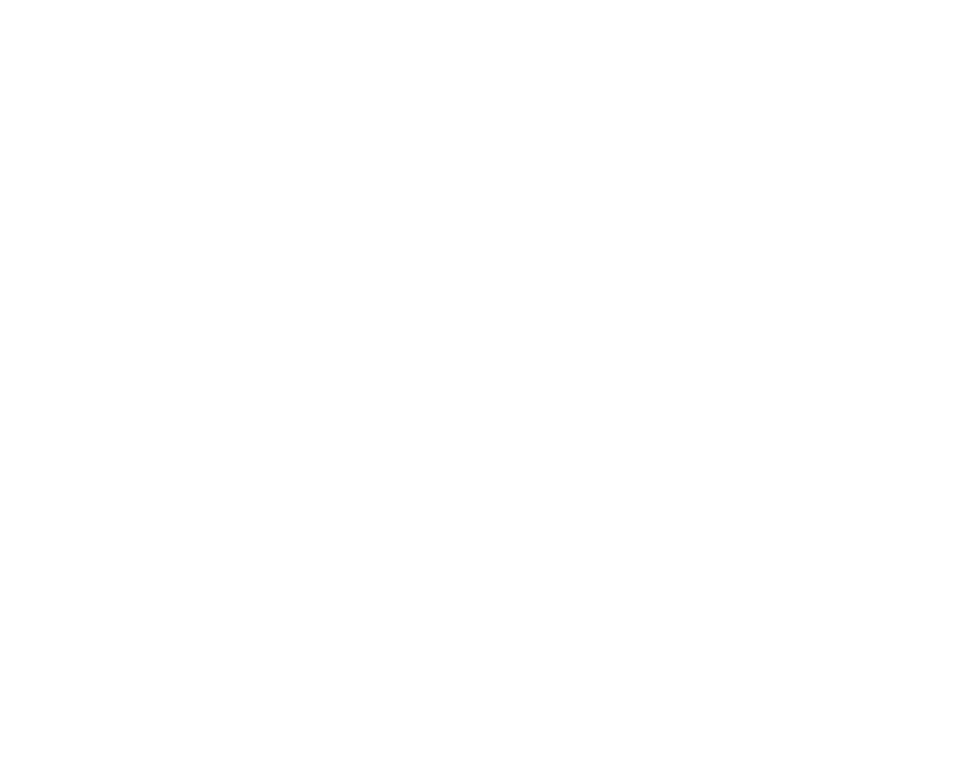

<IPython.core.display.Javascript object>


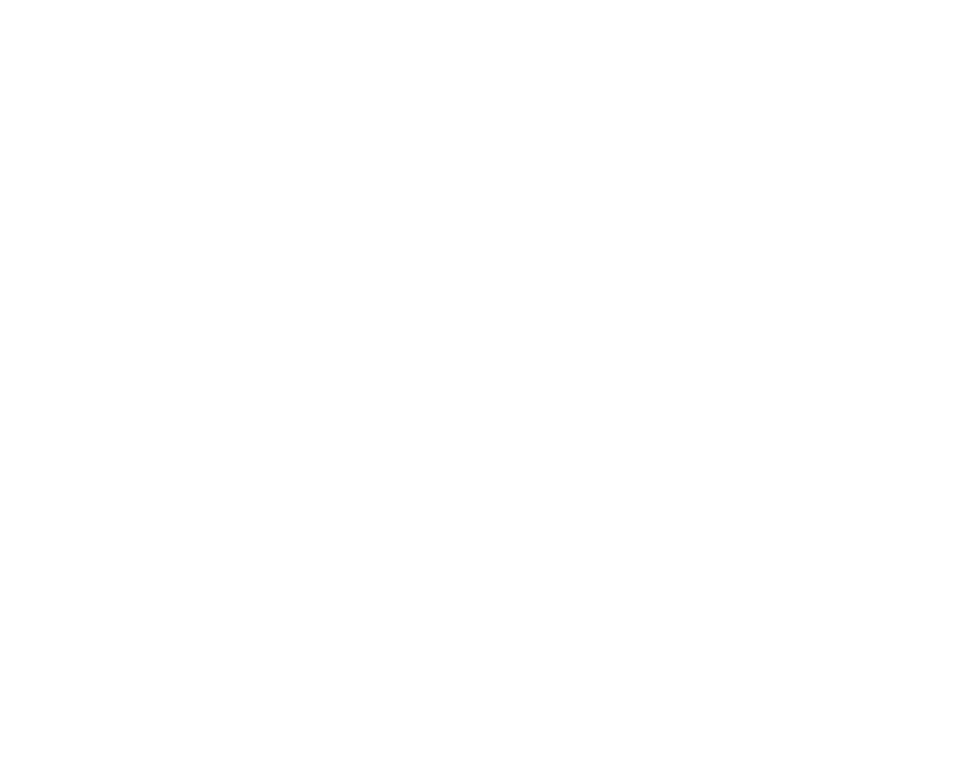

In [79]:
lr_data = load_pickles("log_rg")

In [80]:
for key, item in lr_data.items():
    print(key + " | Test Results: " + str(item['test_results']['acc']))

movie | Test Results: 0.87308
movie_binary | Test Results: 0.88488
movie_ngrams | Test Results: 0.89568
movie_binary_ngrams | Test Results: 0.90292
news | Test Results: 0.6725969198088158
news_binary | Test Results: 0.6704726500265533
news_ngrams | Test Results: 0.6784386617100372
news_binary_ngrams | Test Results: 0.6801646309081253


In [21]:
lr_data['movie_binary_ngrams']['grid'].best_params_

{'C': 10, 'l1_ratio': 0.2}

In [22]:
lr_data['news_binary_ngrams']['grid'].best_params_

{'C': 10, 'l1_ratio': 0.2}

In [81]:
lr = LogisticRegression(penalty="elasticnet", solver="saga", max_iter=100000, dual=False, n_jobs=-1, random_state=42) 

lr_params_movie = { #hyperparameters over which to optimize
    'C': [10],
    'l1_ratio': [0.2]
}

lr_grid_movie = GridSearchCV(estimator=lr, param_grid=lr_params_movie, n_jobs=-1,
                                cv=5, refit=True, verbose=2, return_train_score = True)

Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed: 10.7min remaining: 16.0min
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed: 10.8min remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed: 10.8min finished
C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\sklearn\utils\validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


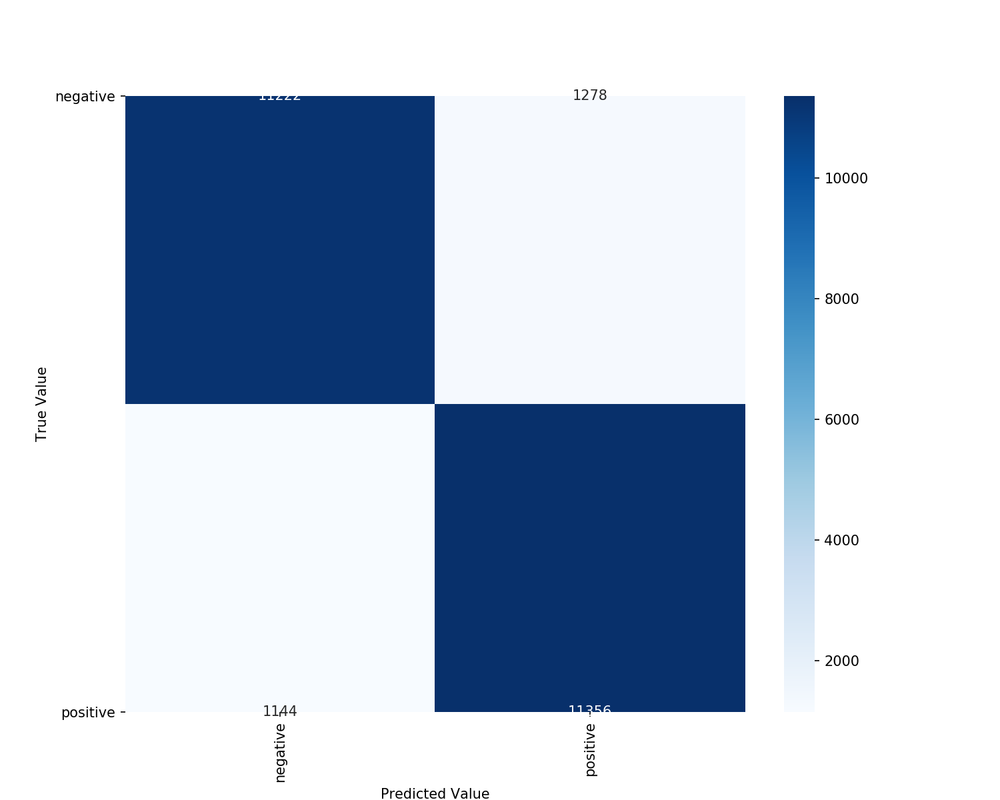

In [24]:
movie_binary_ngrams_results_lr_fine = cv_eval_save("movie_binary_ngrams_results_lr_fine.pkl", lr_grid_movie, movie['movie_binary_ngrams']['X_train'], movie['movie_binary_ngrams']['y_train'],
             movie['movie_binary_ngrams']['X_test'], movie['movie_binary_ngrams']['y_test'], movie_labels,'binary')

In [25]:
movie_binary_ngrams_results_lr_fine

{'grid': GridSearchCV(cv=5, error_score=nan,
              estimator=LogisticRegression(C=1.0, class_weight=None, dual=False,
                                           fit_intercept=True,
                                           intercept_scaling=1, l1_ratio=None,
                                           max_iter=100000, multi_class='auto',
                                           n_jobs=-1, penalty='elasticnet',
                                           random_state=42, solver='saga',
                                           tol=0.0001, verbose=0,
                                           warm_start=False),
              iid='deprecated', n_jobs=-1,
              param_grid={'C': [10], 'l1_ratio': [0.2]}, pre_dispatch='2*n_jobs',
              refit=True, return_train_score=True, scoring=None, verbose=2),
 'val_acc': 0.9023199999999999,
 'val_std': 0.00603403679140256,
 'train_acc': 0.99871,
 'train_std': 7.99999999999912e-05,
 'train_results': {'acc': 0.9982,
  'f1': 0.998

In [26]:
movie_binary_ngrams_results_lr_fine['grid'].best_params_

{'C': 10, 'l1_ratio': 0.2}

In [31]:
lr_param_news = { #Params for gridsearch
    'C': [10],
    'l1_ratio': [0.2]
}

lr_grid_news = GridSearchCV(estimator=lr, param_grid=lr_param_news, n_jobs=-1,
                                cv=5, refit=True, verbose=2, return_train_score = True) #Tune Parameters


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed: 10.3min remaining: 15.4min
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed: 11.0min remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed: 11.0min finished
C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\sklearn\utils\validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\Lenovo\Miniconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


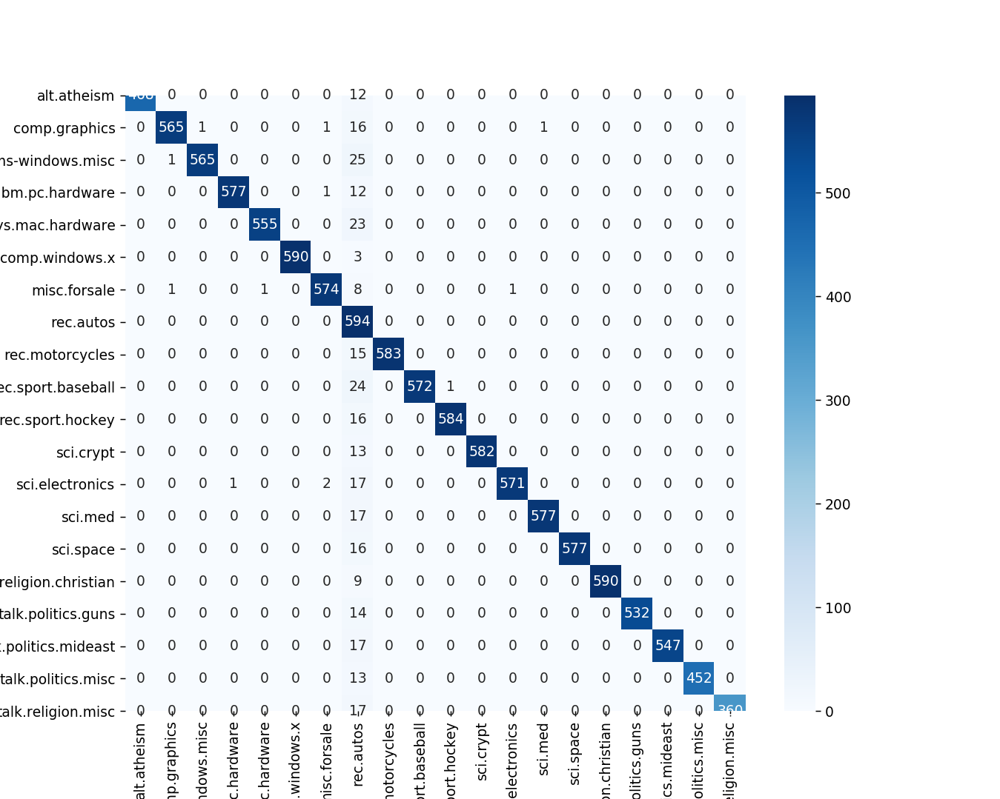

<IPython.core.display.Javascript object>


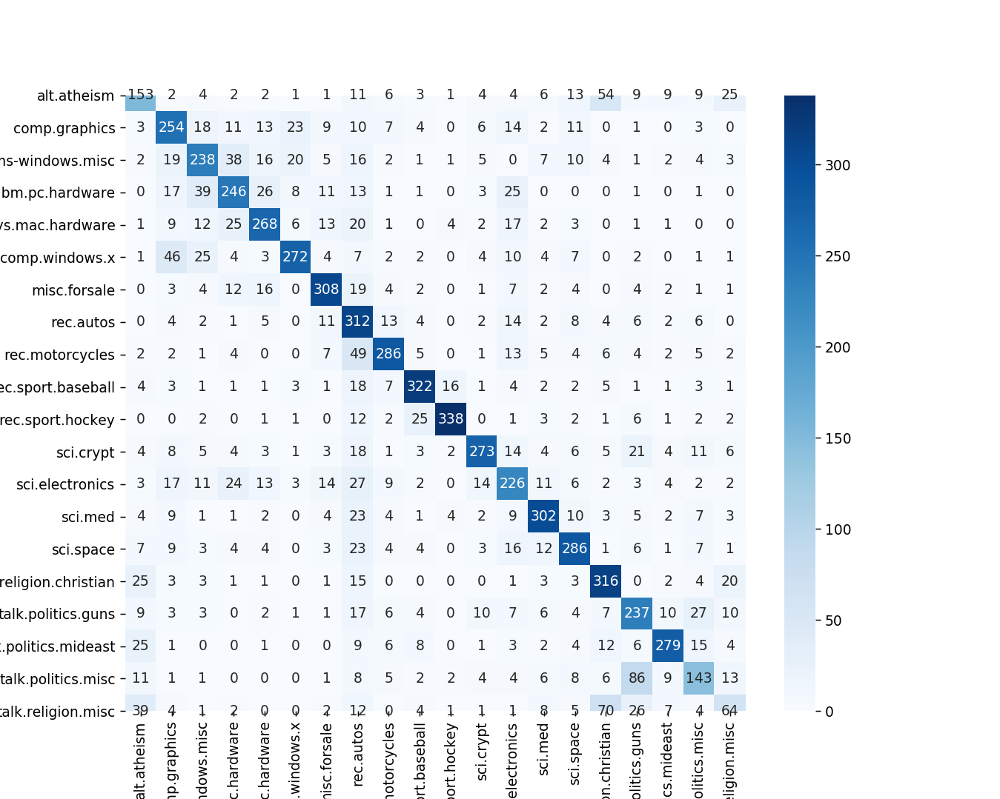

In [32]:
news_binary_ngrams_results_lr_fine = cv_eval_save("news_binary_ngrams_results_lr_fine.pkl", lr_grid_news, news['news_binary_ngrams']['X_train'], news['news_binary_ngrams']['y_train'],
             news['news_binary_ngrams']['X_test'], news['news_binary_ngrams']['y_test'], news_labels,'micro')

In [33]:
news_binary_ngrams_results_lr_fine['grid'].best_params_

{'C': 10, 'l1_ratio': 0.2}

In [34]:
news_binary_ngrams_results_lr_fine

{'grid': GridSearchCV(cv=5, error_score=nan,
              estimator=LogisticRegression(C=1.0, class_weight=None, dual=False,
                                           fit_intercept=True,
                                           intercept_scaling=1, l1_ratio=None,
                                           max_iter=100000, multi_class='auto',
                                           n_jobs=-1, penalty='elasticnet',
                                           random_state=42, solver='saga',
                                           tol=0.0001, verbose=0,
                                           warm_start=False),
              iid='deprecated', n_jobs=-1,
              param_grid={'C': [10], 'l1_ratio': [0.2]}, pre_dispatch='2*n_jobs',
              refit=True, return_train_score=True, scoring=None, verbose=2),
 'val_acc': 0.734664516207174,
 'val_std': 0.008536827301493303,
 'train_acc': 0.9737051391357063,
 'train_std': 0.0004793187195501287,
 'train_results': {'acc': 0.9735725

In [82]:
lr_data['movie']['grid'].best_params_

{'C': 10, 'l1_ratio': 0}

# Random Forest

<IPython.core.display.Javascript object>


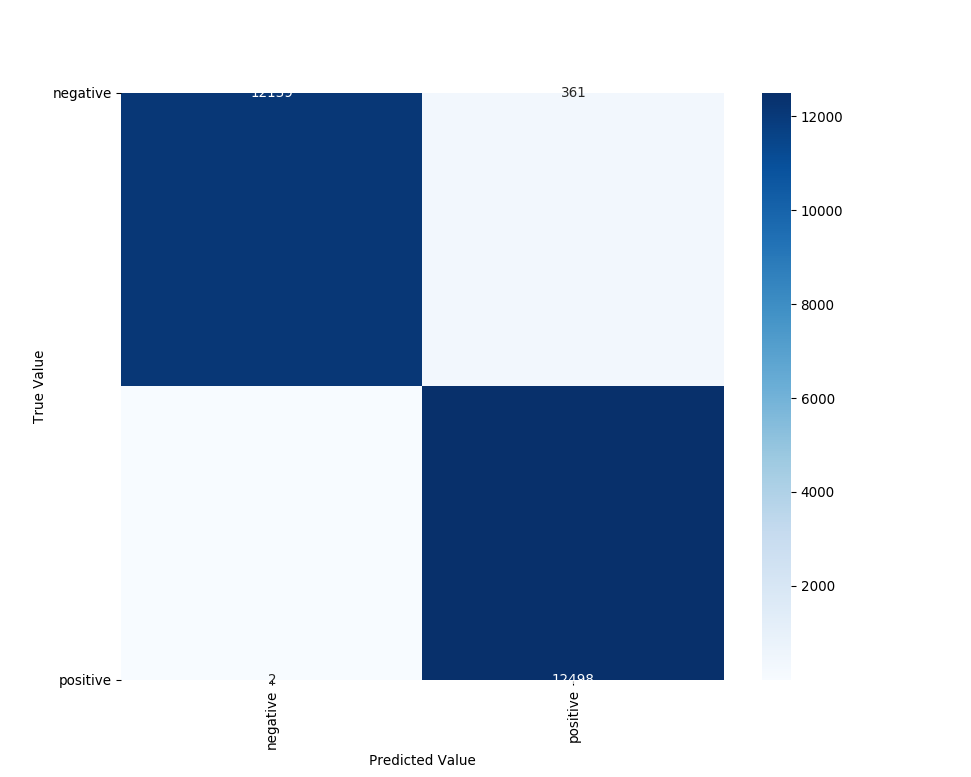

<IPython.core.display.Javascript object>


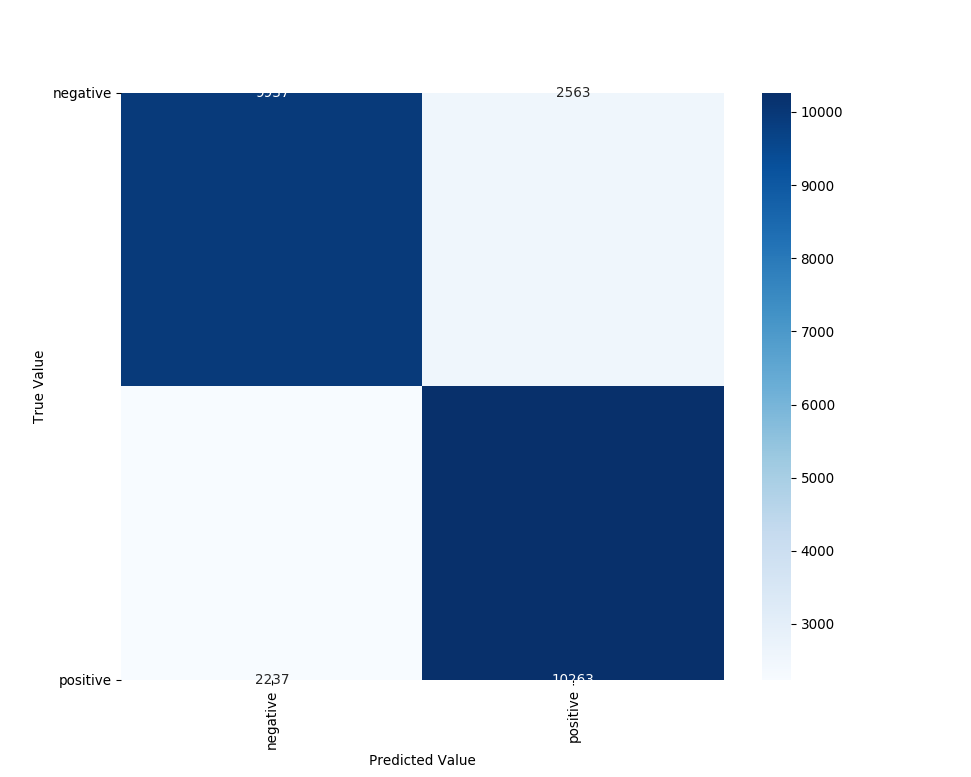

<IPython.core.display.Javascript object>


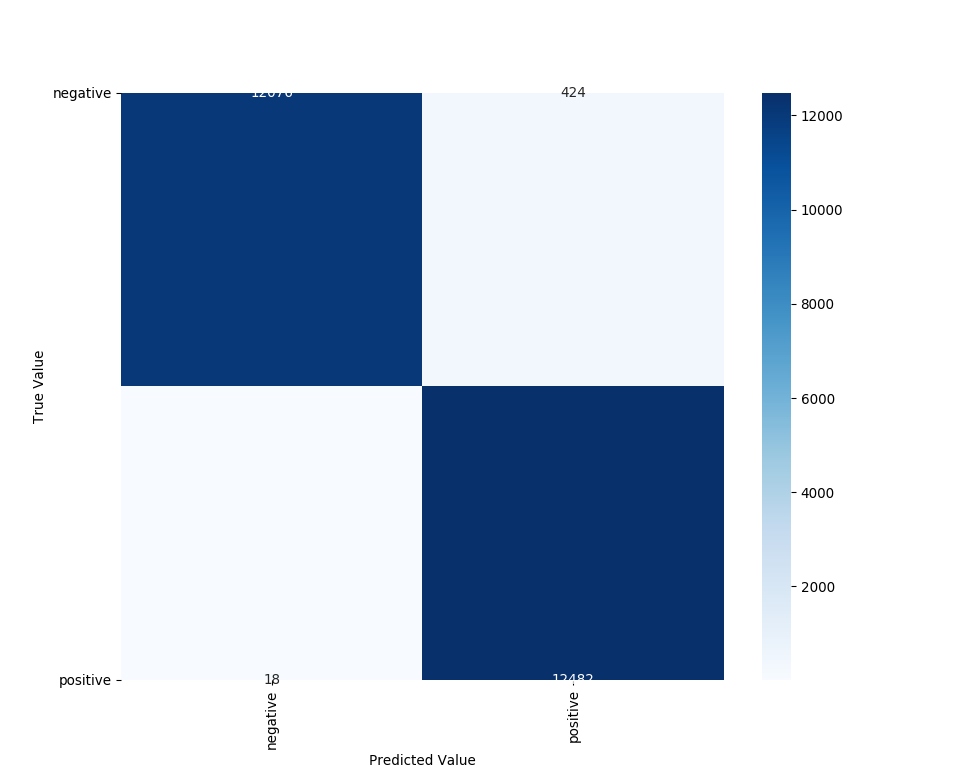

<IPython.core.display.Javascript object>


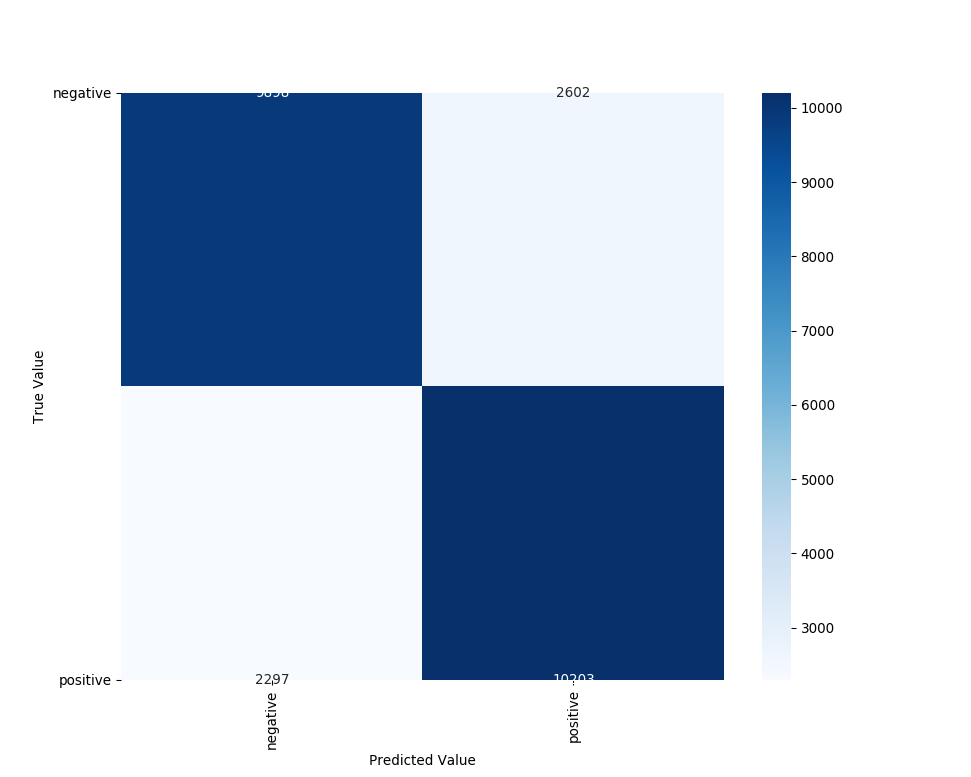

<IPython.core.display.Javascript object>


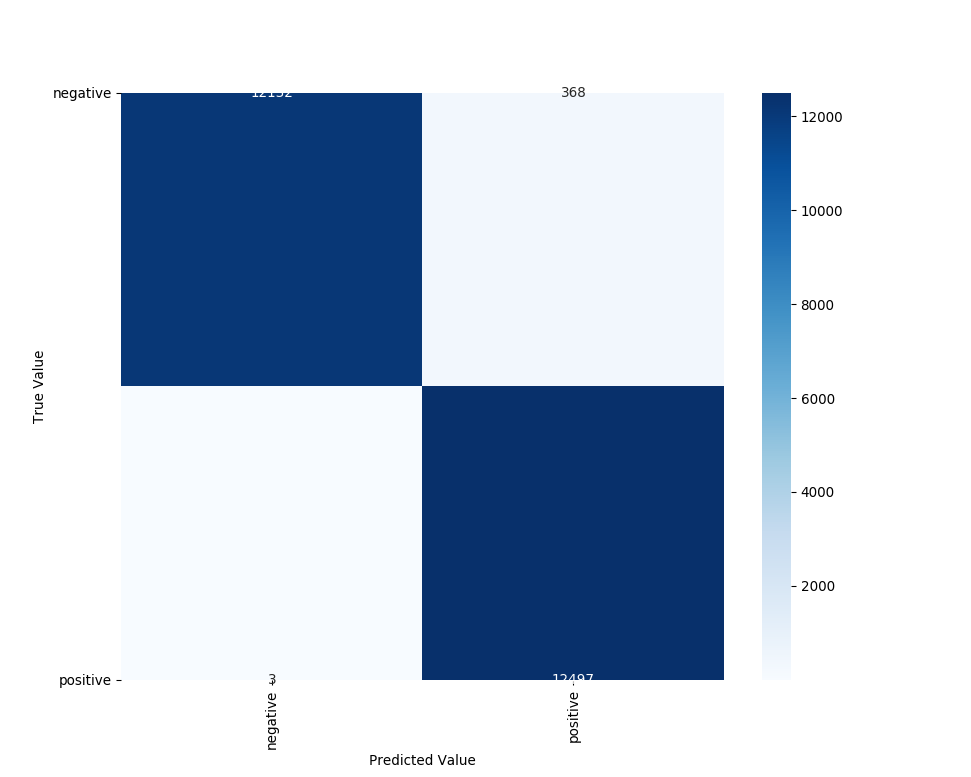

<IPython.core.display.Javascript object>


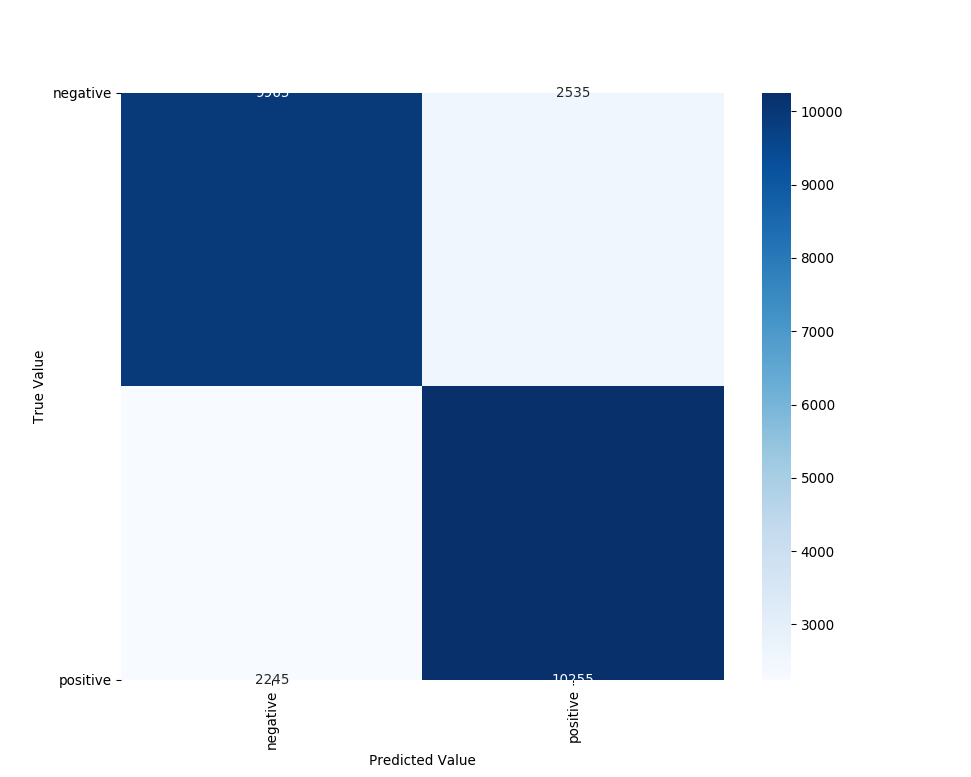

<IPython.core.display.Javascript object>


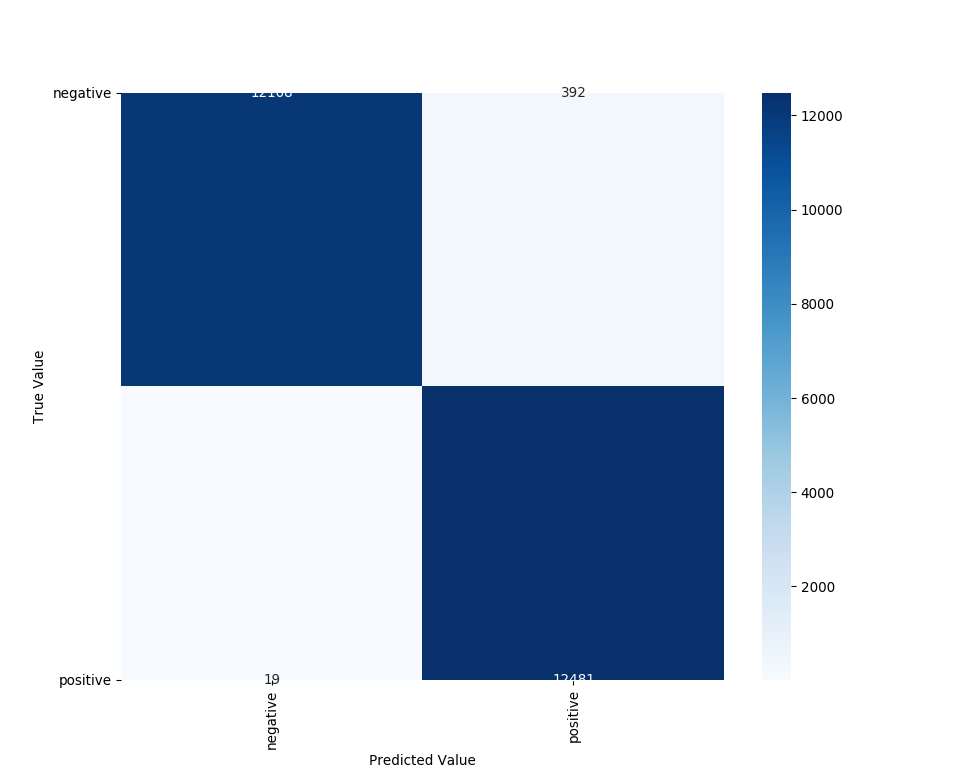

<IPython.core.display.Javascript object>


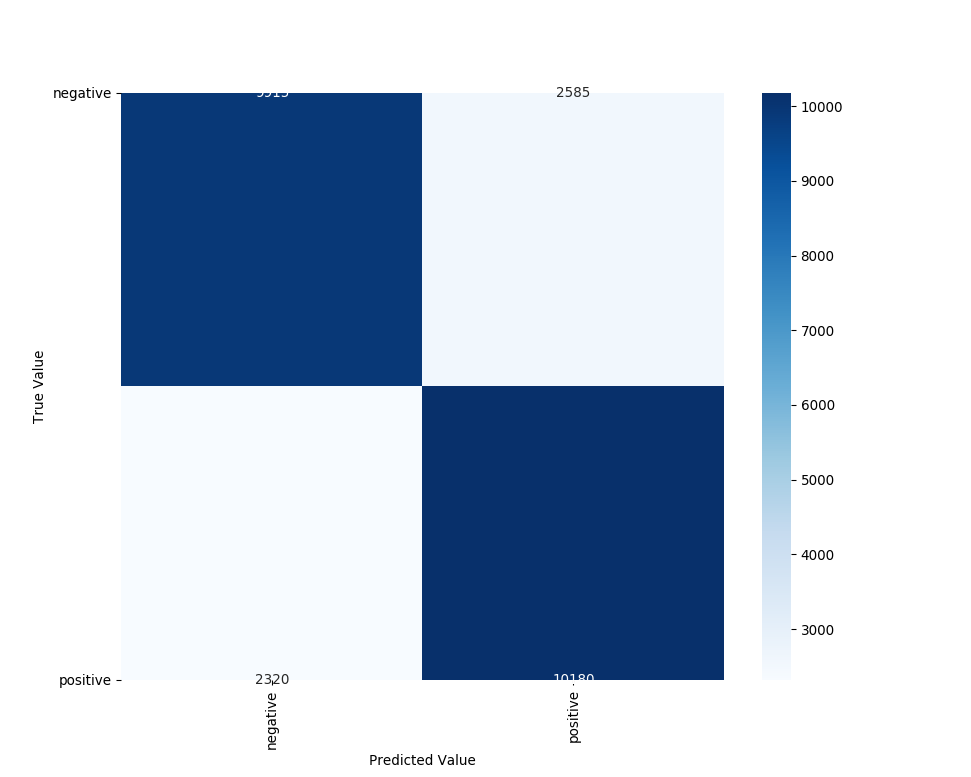

<IPython.core.display.Javascript object>


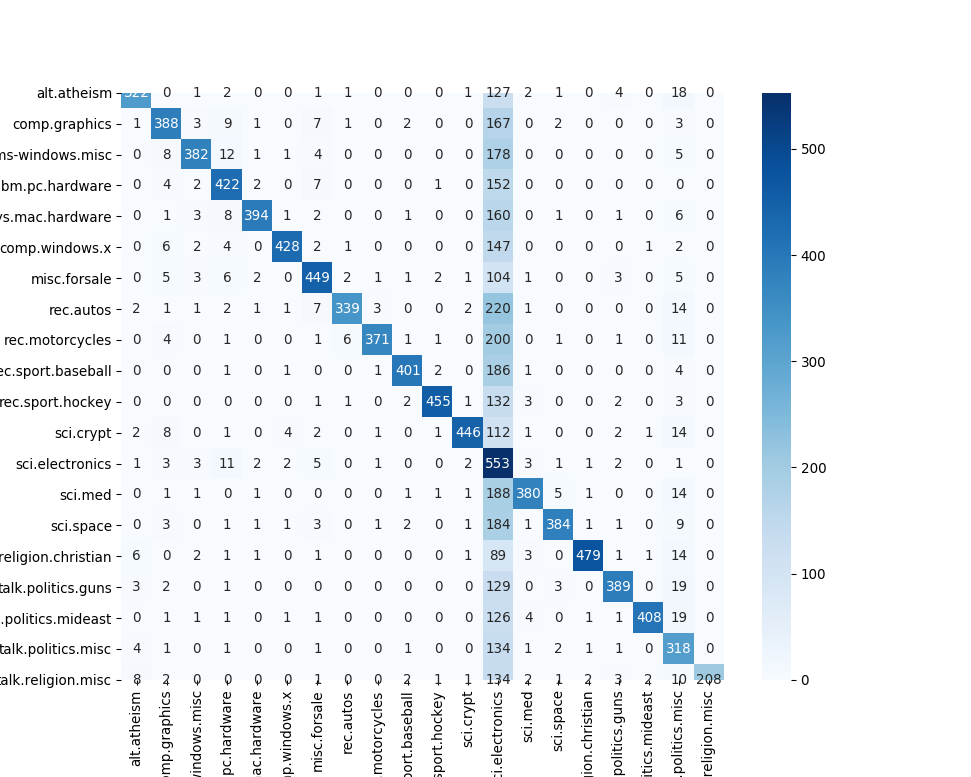

<IPython.core.display.Javascript object>


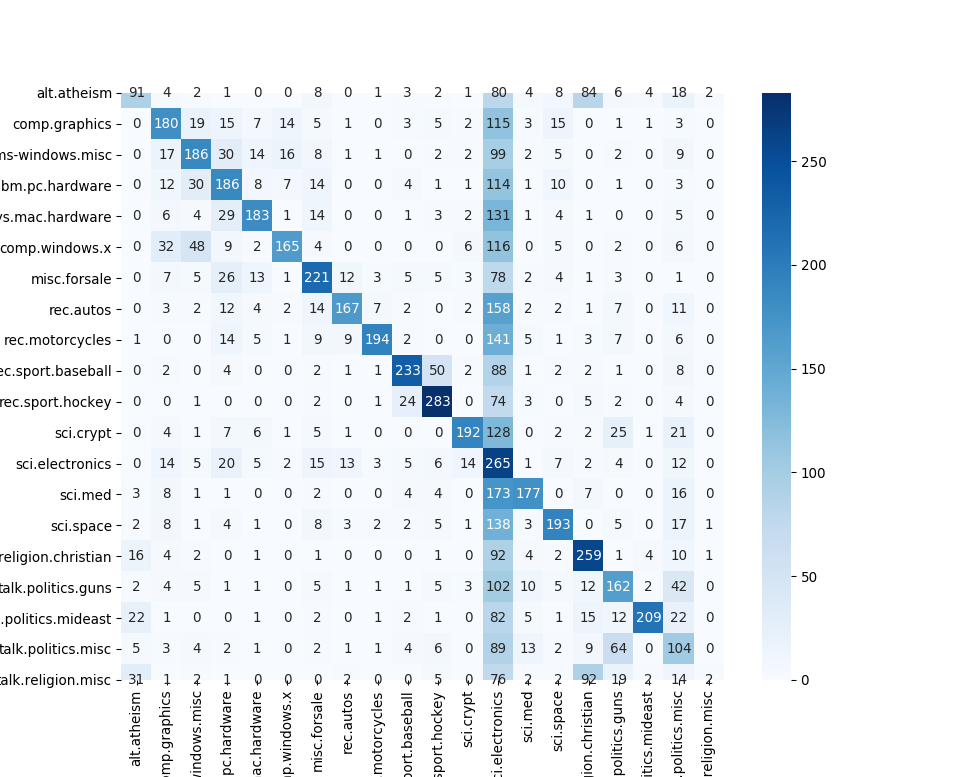

<IPython.core.display.Javascript object>


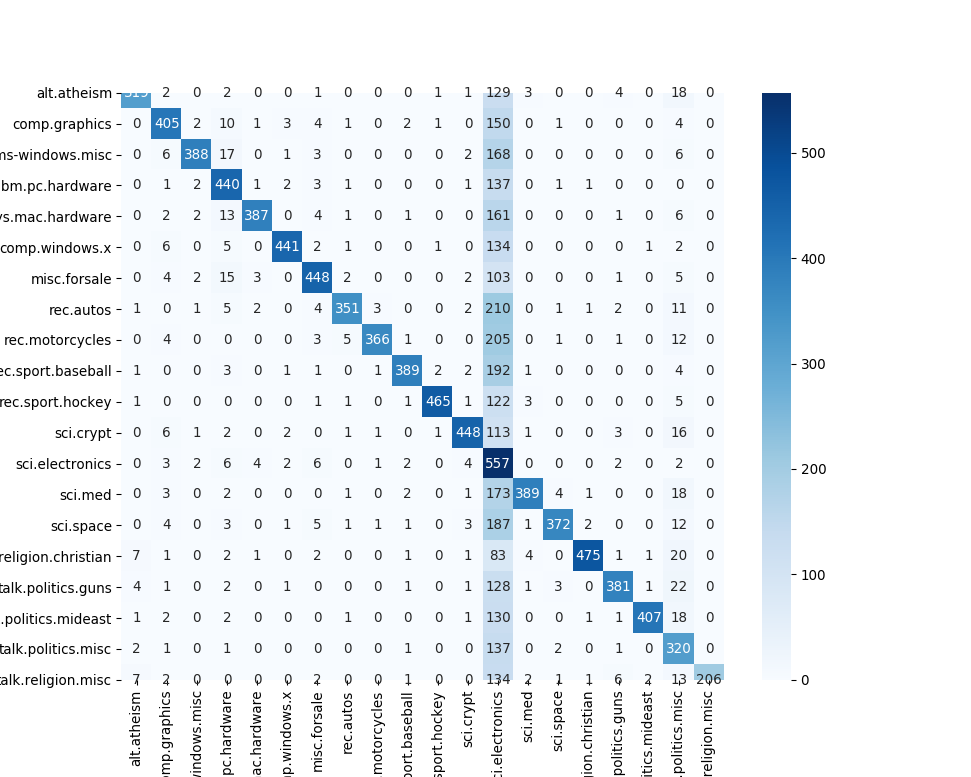

<IPython.core.display.Javascript object>


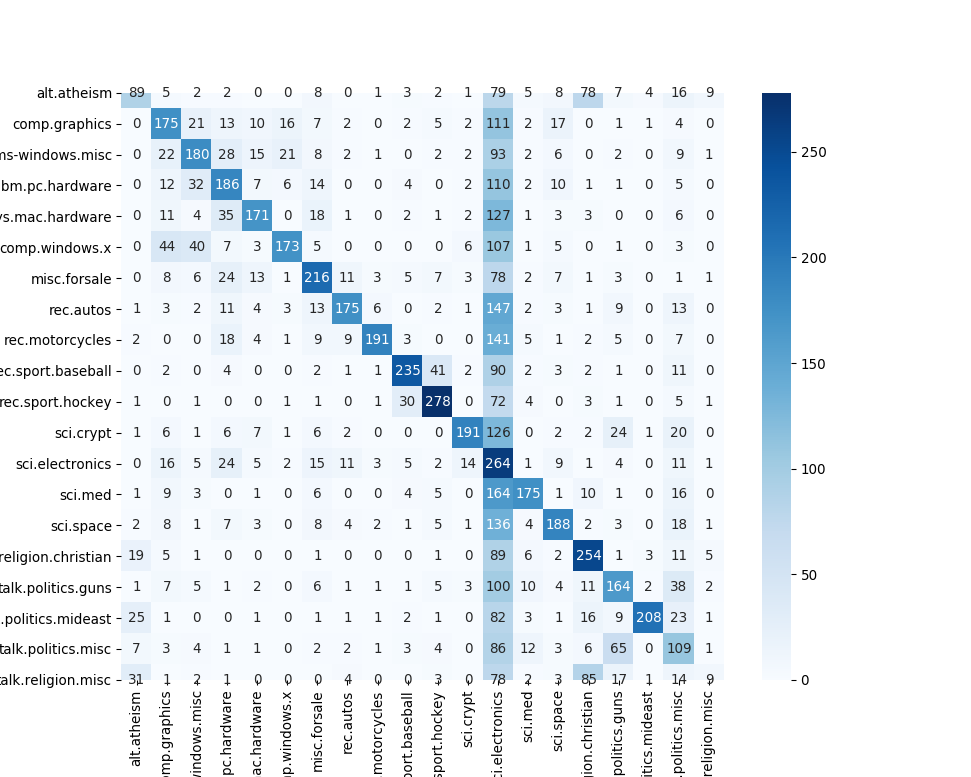

<IPython.core.display.Javascript object>


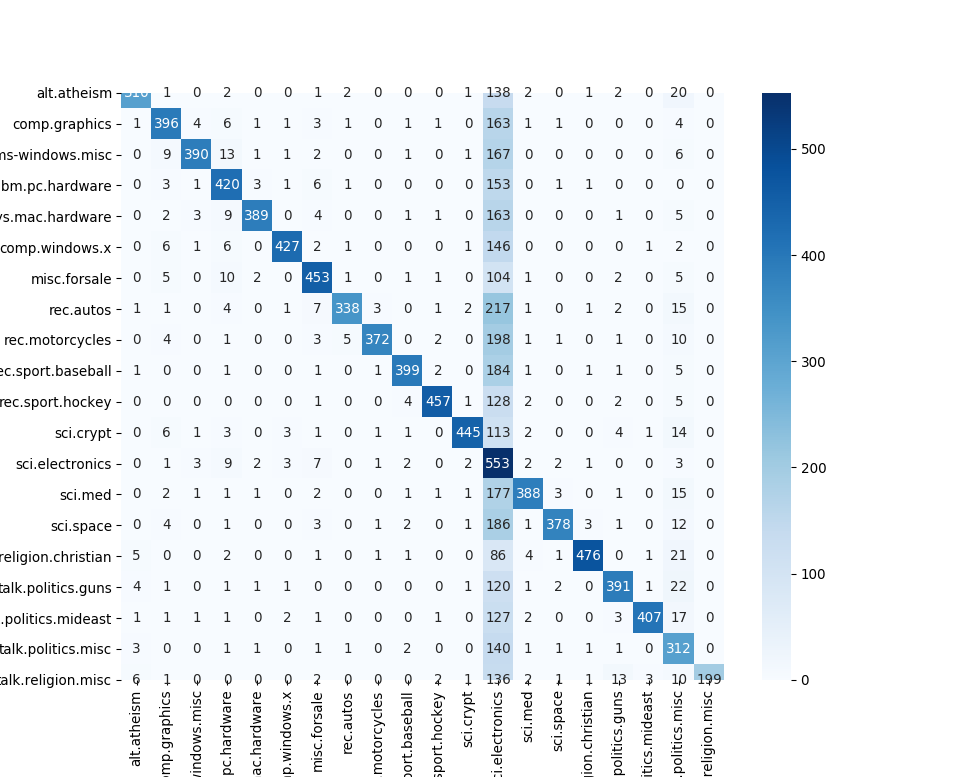

<IPython.core.display.Javascript object>


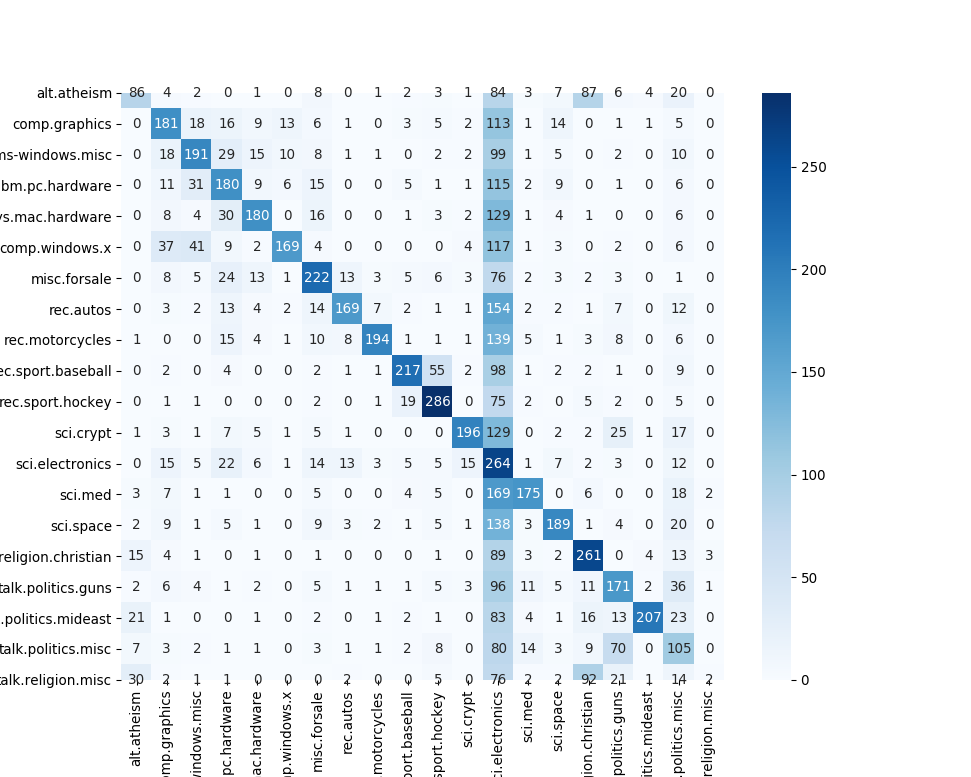

<IPython.core.display.Javascript object>


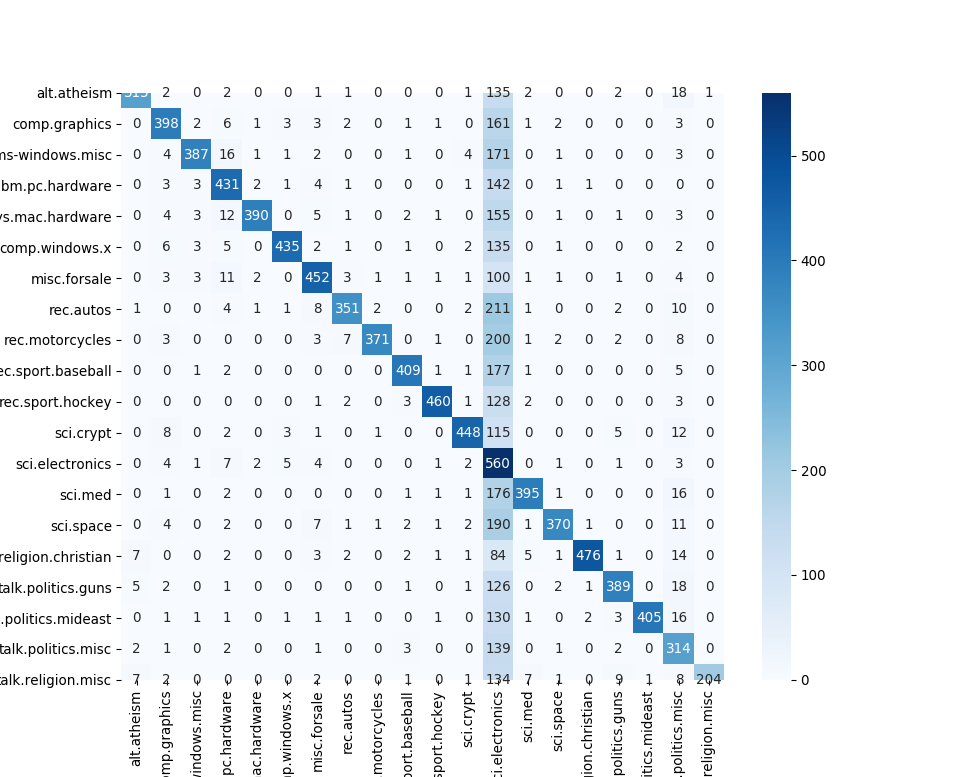

<IPython.core.display.Javascript object>


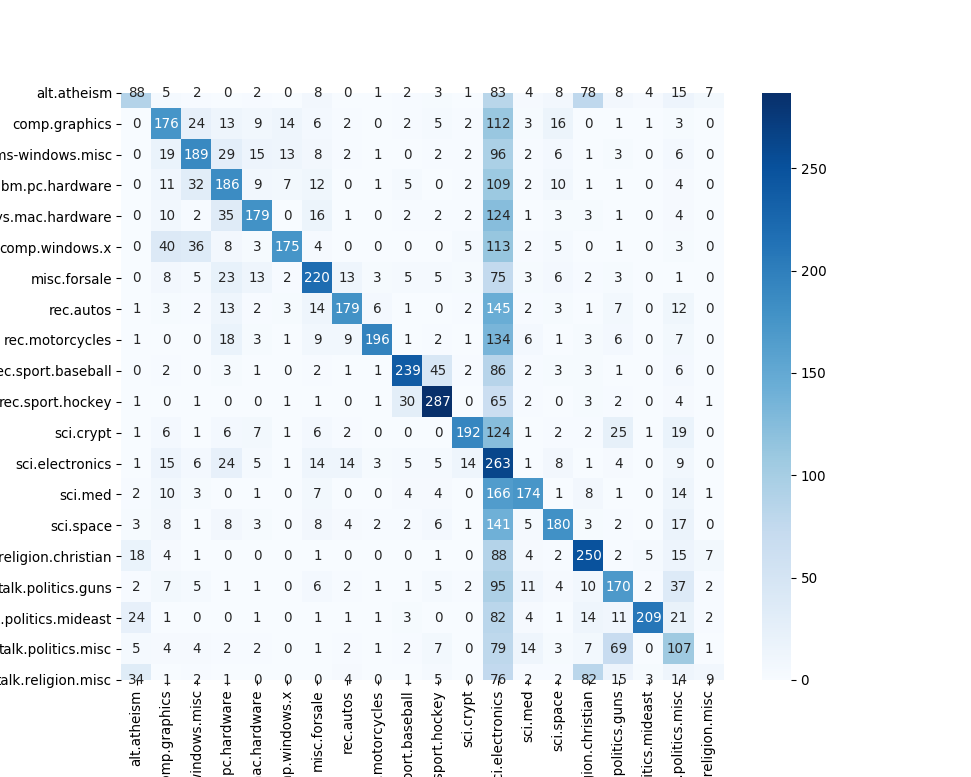

In [64]:
forest_data = load_pickles('forest')

In [65]:
for key, item in forest_data.items():
    print(key + " | Test Results: " + str(item['test_results']['acc']))

movie | Test Results: 0.808
movie_binary | Test Results: 0.80404
movie_ngrams | Test Results: 0.8088
movie_binary_ngrams | Test Results: 0.8038
news | Test Results: 0.48486457780138076
news_binary | Test Results: 0.48207647371216145
news_ngrams | Test Results: 0.483935209771641
news_binary_ngrams | Test Results: 0.48698884758364314


In [ ]:
forest_data['movie_ngrams']['grid']